In [6]:
import warnings
import os

warnings.filterwarnings("ignore")

In [7]:
import geopandas as gpd
base = "/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data/geoportal.statistics.gov.uk/LSOA11_BGC"

#读取LSOA地图文件
shp = os.path.join(base, "LSOA_(Dec_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp")
lsoa = gpd.read_file(shp)


In [8]:
clipped_tif = "/Users/hh/Desktop/论文/git/clc_ew_27700_clipped.tif"


In [10]:
import numpy as np
import pandas as pd
from collections import Counter
import rasterio

# download CORINE data
with rasterio.open(clipped_tif) as src:
    corine_data = src.read(1)
    print(f"data: {corine_data.shape}")
    print(f"NoData : {src.nodata}")
    
    
    unique_values = np.unique(corine_data)
    print(f"\n unique values: {len(unique_values)} ")
    print(unique_values)
    

    valid_data = corine_data[corine_data != src.nodata] if src.nodata else corine_data
    value_counts = Counter(valid_data.flatten())
    
    
    corine_stats = pd.DataFrame([
        {'代码': int(code), 'number of pixel': count, 'percent': f"{count/len(valid_data)*100:.2f}%"}
        for code, count in sorted(value_counts.items())
    ])
    

    print(corine_stats)

data: (6030, 5298)
NoData : -128.0

 unique values: 36 
[-128    1    2    3    4    5    6    7    8    9   10   11   12   16
   18   20   21   22   23   24   25   26   27   29   30   31   32   35
   36   37   39   40   41   42   43   44]
    代码  number of pixel percent
0    1            22913   0.18%
1    2          1002924   7.76%
2    3           172369   1.33%
3    4            10784   0.08%
4    5             8256   0.06%
5    6            25984   0.20%
6    7            36289   0.28%
7    8             3440   0.03%
8    9            10011   0.08%
9   10            50378   0.39%
10  11           210745   1.63%
11  12          4948645  38.28%
12  16            10450   0.08%
13  18          4038092  31.24%
14  20             7602   0.06%
15  21            69632   0.54%
16  22               55   0.00%
17  23           363454   2.81%
18  24           274629   2.12%
19  25           192022   1.49%
20  26           485859   3.76%
21  27           450855   3.49%
22  29            80038 

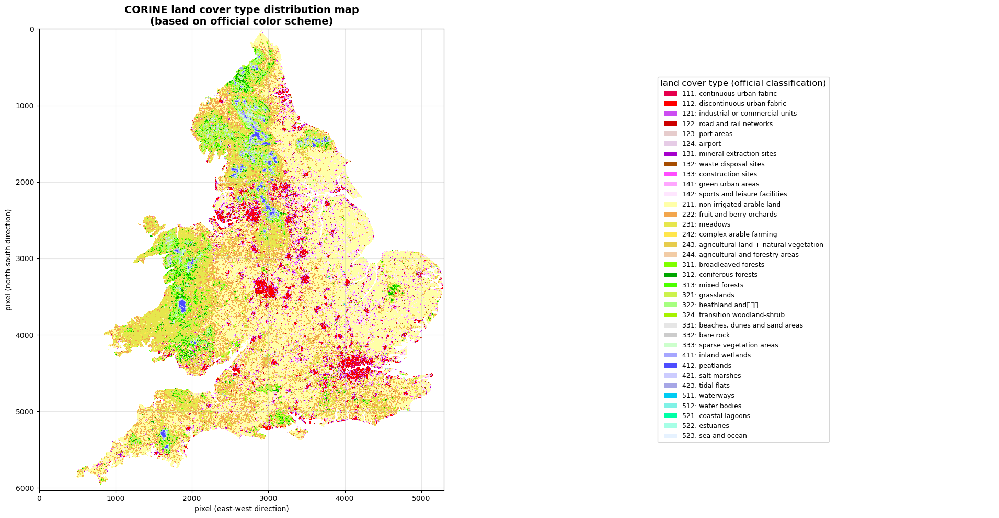

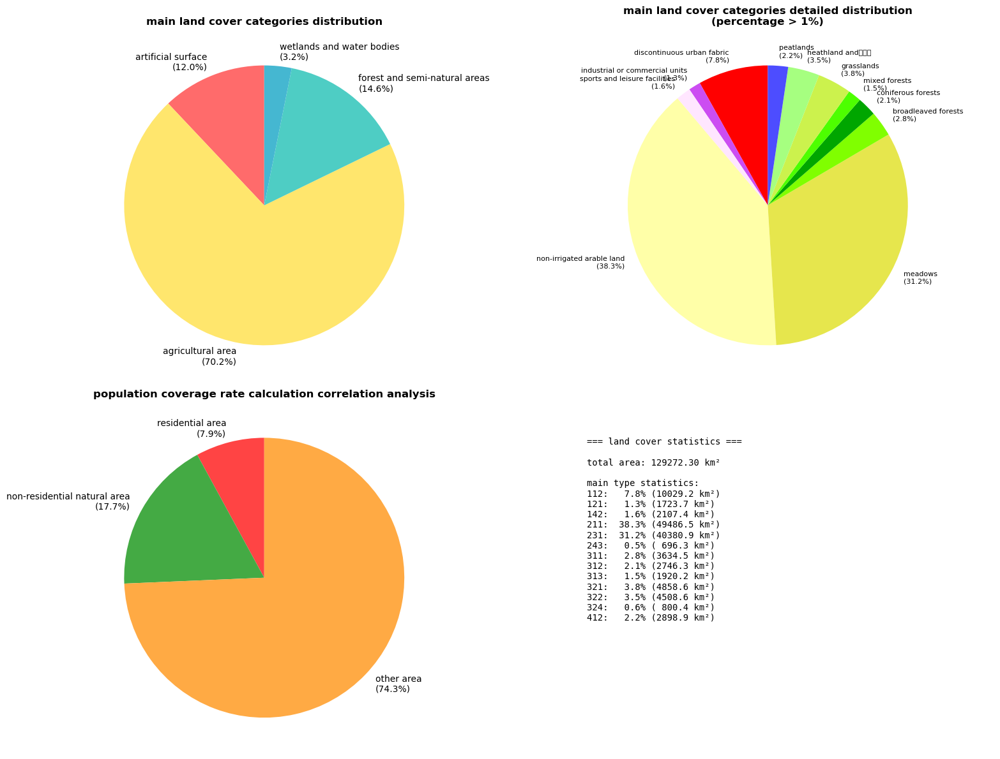


=== detailed land cover type statistics ===
research area total area: 129272.30 km²
total pixels: 12,927,230

various types detailed statistics:
official code | type name                    | area(km²) | percentage(%)
-----------------------------------------------------------------
     111 | continuous urban fabric   |   229.13 |   0.18
     112 | discontinuous urban fabric | 10029.24 |   7.76
     121 | industrial or commercial units |  1723.69 |   1.33
     122 | road and rail networks    |   107.84 |   0.08
     123 | port areas                |    82.56 |   0.06
     124 | airport                   |   259.84 |   0.20
     131 | mineral extraction sites  |   362.89 |   0.28
     132 | waste disposal sites      |    34.40 |   0.03
     133 | construction sites        |   100.11 |   0.08
     141 | green urban areas         |   503.78 |   0.39
     142 | sports and leisure facilities |  2107.45 |   1.63
     211 | non-irrigated arable land | 49486.45 |  38.28
     222 | fruit and 

In [11]:

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
from matplotlib.patches import Patch


code_mapping = {
    1: 111,   # continuous urban fabric
    2: 112,   # discontinuous urban fabric
    3: 121,   # industrial or commercial units
    4: 122,   # road and rail networks
    5: 123,   # port areas
    6: 124,   # airport
    7: 131,   # mineral extraction sites
    8: 132,   # waste disposal sites
    9: 133,   # construction sites
    10: 141,  # green urban areas
    11: 142,  # sports and leisure facilities
    12: 211,  # non-irrigated arable land
    16: 222,  # fruit and berry orchards
    18: 231,  # meadows
    20: 242,  # complex arable farming
    21: 243,  # mainly agricultural land, but with large areas of natural vegetation
    22: 244,  # agricultural and forestry areas
    23: 311,  # broadleaved forests
    24: 312,  # coniferous forests
    25: 313,  # mixed forests
    26: 321,  # grasslands
    27: 322,  # heathland and石楠地
    29: 324,  # transition woodland-shrub
    30: 331,  # beaches, dunes and sand areas
    31: 332,  # bare rock
    32: 333,  # sparsely vegetated areas
    35: 411,  # inland wetlands
    36: 412,  # peatlands
    37: 421,  # salt marshes
    39: 423,  # tidal flats
    40: 511,  # waterways
    41: 512,  # water bodies
    42: 521,  # coastal lagoons
    43: 522,  # estuaries
    44: 523   # sea and ocean
}


corine_official = {
    111: {"name": "continuous urban fabric", "color": "#E6004D"},
    112: {"name": "discontinuous urban fabric", "color": "#FF0000"},
    121: {"name": "industrial or commercial units", "color": "#CC4DF2"},
    122: {"name": "road and rail networks", "color": "#CC0000"},
    123: {"name": "port areas", "color": "#E6CCCC"},
    124: {"name": "airport", "color": "#E6CCE6"},
    131: {"name": "mineral extraction sites", "color": "#A600CC"},
    132: {"name": "waste disposal sites", "color": "#A64D00"},
    133: {"name": "construction sites", "color": "#FF4DFF"},
    141: {"name": "green urban areas", "color": "#FFA6FF"},
    142: {"name": "sports and leisure facilities", "color": "#FFE6FF"},
    211: {"name": "non-irrigated arable land", "color": "#FFFFA8"},
    222: {"name": "fruit and berry orchards", "color": "#F2A64D"},
    231: {"name": "meadows", "color": "#E6E64D"},
    242: {"name": "complex arable farming", "color": "#FFE64D"},
    243: {"name": "agricultural land + natural vegetation", "color": "#E6CC4D"},
    244: {"name": "agricultural and forestry areas", "color": "#F2CCA6"},
    311: {"name": "broadleaved forests", "color": "#80FF00"},
    312: {"name": "coniferous forests", "color": "#00A600"},
    313: {"name": "mixed forests", "color": "#4DFF00"},
    321: {"name": "grasslands", "color": "#CCF24D"},
    322: {"name": "heathland and石楠地", "color": "#A6FF80"},
    324: {"name": "transition woodland-shrub", "color": "#A6F200"},
    331: {"name": "beaches, dunes and sand areas", "color": "#E6E6E6"},
    332: {"name": "bare rock", "color": "#CCCCCC"},
    333: {"name": "sparse vegetation areas", "color": "#CCFFCC"},
    411: {"name": "inland wetlands", "color": "#A6A6FF"},
    412: {"name": "peatlands", "color": "#4D4DFF"},
    421: {"name": "salt marshes", "color": "#CCCCFF"},
    423: {"name": "tidal flats", "color": "#A6A6E6"},
    511: {"name": "waterways", "color": "#00CCF2"},
    512: {"name": "water bodies", "color": "#80F2E6"},
    521: {"name": "coastal lagoons", "color": "#00FFA6"},
    522: {"name": "estuaries", "color": "#A6FFE6"},
    523: {"name": "sea and ocean", "color": "#E6F2FF"}
}


with rasterio.open(clipped_tif) as src:
    corine_data = src.read(1)
    transform = src.transform
    

    unique_values = np.unique(corine_data)
    unique_values = unique_values[unique_values != -128]  # 排除 NoData
    

    colors = []
    labels = []
    values = []
    
    for val in sorted(unique_values):
        if val in code_mapping:
            official_code = code_mapping[val]
            if official_code in corine_official:
                colors.append(corine_official[official_code]["color"])
                labels.append(f"{official_code}: {corine_official[official_code]['name']}")
                values.append(val)
    

    cmap = mcolors.ListedColormap(colors)
    norm = mcolors.BoundaryNorm(values + [max(values) + 1], len(colors))
    

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
  
    masked_data = np.ma.masked_where(corine_data == -128, corine_data)
    im = ax1.imshow(masked_data, cmap=cmap, norm=norm, aspect='equal')
    ax1.set_title('CORINE land cover type distribution map\n(based on official color scheme)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('pixel (east-west direction)')
    ax1.set_ylabel('pixel (north-south direction)')
    ax1.grid(True, alpha=0.3)
    

    legend_elements = []
    for val in sorted(unique_values):
        if val in code_mapping:
            official_code = code_mapping[val]
            if official_code in corine_official:
                legend_elements.append(
                    Patch(facecolor=corine_official[official_code]["color"], 
                          label=f"{official_code}: {corine_official[official_code]['name']}")
                )
    
    ax2.axis('off')
    ax2.legend(handles=legend_elements, loc='center', fontsize=9, 
              title='land cover type (official classification)', title_fontsize=12)
    
    plt.tight_layout()
    plt.show()


fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 12))


unique_values_data, counts = np.unique(corine_data[corine_data != -128], return_counts=True)
total_pixels = np.sum(counts)


categories = {
    "artificial surface": [111, 112, 121, 122, 123, 124, 131, 132, 133, 141, 142],
    "agricultural area": [211, 212, 213, 221, 222, 223, 231, 241, 242, 243, 244],
    "forest and semi-natural areas": [311, 312, 313, 321, 322, 323, 324, 331, 332, 333, 334, 335],
    "wetlands and water bodies": [411, 412, 421, 422, 423, 511, 512, 521, 522, 523]
}

category_colors = {
    "artificial surface": "#FF6B6B",
    "agricultural area": "#FFE66D", 
    "forest and semi-natural areas": "#4ECDC4",
    "wetlands and water bodies": "#45B7D1"
}


category_stats = {}
for category, codes in categories.items():
    total_count = 0
    for val, count in zip(unique_values_data, counts):
        if val in code_mapping and code_mapping[val] in codes:
            total_count += count
    category_stats[category] = total_count


pie_labels = []
pie_sizes = []
pie_colors = []
for category, count in category_stats.items():
    if count > 0:
        percentage = (count / total_pixels) * 100
        pie_labels.append(f"{category}\n({percentage:.1f}%)")
        pie_sizes.append(count)
        pie_colors.append(category_colors[category])

ax1.pie(pie_sizes, labels=pie_labels, colors=pie_colors, autopct='', startangle=90)
ax1.set_title('main land cover categories distribution', fontsize=12, fontweight='bold')


detailed_labels = []
detailed_sizes = []
detailed_colors = []

for val, count in zip(unique_values_data, counts):
    if val in code_mapping:
        official_code = code_mapping[val]
        if official_code in corine_official:
            percentage = (count / total_pixels) * 100
            if percentage > 1.0: 
                detailed_labels.append(f"{corine_official[official_code]['name']}\n({percentage:.1f}%)")
                detailed_sizes.append(count)
                detailed_colors.append(corine_official[official_code]["color"])

ax2.pie(detailed_sizes, labels=detailed_labels, colors=detailed_colors, 
        autopct='', startangle=90, textprops={'fontsize': 8})
ax2.set_title('main land cover categories detailed distribution\n(percentage > 1%)', fontsize=12, fontweight='bold')


residential_codes = [111, 112]  
non_residential_codes = [311, 312, 313, 321, 322, 324, 331, 332, 333, 411, 412, 421, 423, 511, 512]  # 非居住用地

residential_count = 0
non_residential_count = 0
total_count = 0

for val, count in zip(unique_values_data, counts):
    if val in code_mapping:
        official_code = code_mapping[val]
        total_count += count
        if official_code in residential_codes:
            residential_count += count
        elif official_code in non_residential_codes:
            non_residential_count += count

other_count = total_count - residential_count - non_residential_count


coverage_labels = [
    f"residential area\n({(residential_count/total_count)*100:.1f}%)",
    f"non-residential natural area\n({(non_residential_count/total_count)*100:.1f}%)", 
    f"other area\n({(other_count/total_count)*100:.1f}%)"
]
coverage_sizes = [residential_count, non_residential_count, other_count]
coverage_colors = ['#FF4444', '#44AA44', '#FFAA44']

ax3.pie(coverage_sizes, labels=coverage_labels, colors=coverage_colors, autopct='', startangle=90)
ax3.set_title('population coverage rate calculation correlation analysis', fontsize=12, fontweight='bold')


ax4.axis('off')
stats_text = "=== land cover statistics ===\n\n"
stats_text += f"total area: {(total_pixels * 0.01):.2f} km²\n\n"
stats_text += "main type statistics:\n"

for val, count in zip(unique_values_data, counts):
    if val in code_mapping:
        official_code = code_mapping[val]
        if official_code in corine_official:
            percentage = (count / total_pixels) * 100
            area_km2 = count * 0.01  # 100m×100m = 0.01km²
            if percentage > 0.5:
                stats_text += f"{official_code}: {percentage:5.1f}% ({area_km2:6.1f} km²)\n"

ax4.text(0.1, 0.9, stats_text, transform=ax4.transAxes, fontsize=10, 
         verticalalignment='top', fontfamily='monospace')

plt.tight_layout()
plt.show()


print("\n=== detailed land cover type statistics ===")
print(f"research area total area: {(total_pixels * 0.01):.2f} km²")
print(f"total pixels: {total_pixels:,}")
print("\nvarious types detailed statistics:")
print("official code | type name                    | area(km²) | percentage(%)")
print("-" * 65)

for val, count in zip(unique_values_data, counts):
    if val in code_mapping:
        official_code = code_mapping[val]
        if official_code in corine_official:
            percentage = (count / total_pixels) * 100
            area_km2 = count * 0.01
            print(f"{official_code:8d} | {corine_official[official_code]['name']:<25} | {area_km2:8.2f} | {percentage:6.2f}")

  reference            | object          | not null: 8184/8185
  company              | object          | not null: 8185/8185
  name                 | object          | not null: 8184/8185
  comment              | object          | not null: 53/8185
  identifier           | object          | not null: 8185/8185
   reference         company             name comment  identifier
0  DOA000001  scottish_water      Kilmore DOA    None  02c6f0e5a0
1  DOA000002  scottish_water         Luss DOA    None  240b0a9f07
2  DOA000003  scottish_water     Rothesay DOA    None  382f95fed3
3  DOA000004  scottish_water      Clachan DOA    None  210f3df954
4  DOA000005  scottish_water  Campbeltown DOA    None  882800b2be

=== statistic data ===

=== geometric information ===
total area: 21832.19 km²
average area: 2.6673 km²
maximum area: 290.5092 km²
minimum area: 0.000041 km²

data boundary range:
  X: 63186.88 to 655989.00
  Y: 9754.40 to 1212344.09

=== unique value analysis ===

reference unique values 

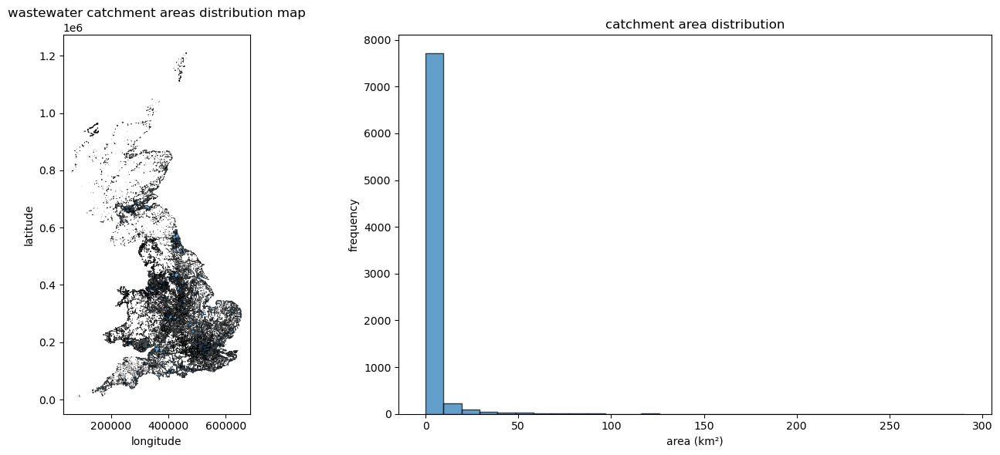

In [16]:
import geopandas as gpd
import pandas as pd


catchments_file = "/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data/wastewater_catchment_areas_public/catchments_consolidated/catchments_consolidated.shp"


catchments_gdf = gpd.read_file(catchments_file)




for col in catchments_gdf.columns:
    dtype = catchments_gdf[col].dtype
    if col != 'geometry':
        non_null_count = catchments_gdf[col].count()
        print(f"  {col:<20} | {str(dtype):<15} | not null: {non_null_count}/{len(catchments_gdf)}")


non_geom_cols = [col for col in catchments_gdf.columns if col != 'geometry']
print(catchments_gdf[non_geom_cols].head())

print("\n=== statistic data ===")

lsoa_related_cols = [col for col in catchments_gdf.columns if 'lsoa' in col.lower() or 'LSOA' in col]
if lsoa_related_cols:
    print(f"LSOA related columns: {lsoa_related_cols}")
    for col in lsoa_related_cols:
        unique_count = catchments_gdf[col].nunique()
        print(f"  {col}: {unique_count} unique values")


pop_related_cols = [col for col in catchments_gdf.columns if any(keyword in col.lower() for keyword in ['pop', 'population', 'people', 'resident'])]
if pop_related_cols:
    print(f"\npopulation related columns: {pop_related_cols}")
    for col in pop_related_cols:
        if catchments_gdf[col].dtype in ['int64', 'float64']:
            print(f"  {col}: sum {catchments_gdf[col].sum():,.0f}, average {catchments_gdf[col].mean():.1f}")

wastewater_cols = [col for col in catchments_gdf.columns if any(keyword in col.lower() for keyword in ['waste', 'water', 'treatment', 'sewage', 'catchment'])]
if wastewater_cols:
    print(f"\nwastewater related columns: {wastewater_cols}")

print("\n=== geometric information ===")
print(f"total area: {catchments_gdf.geometry.area.sum() / 1000000:.2f} km²")
print(f"average area: {catchments_gdf.geometry.area.mean() / 1000000:.4f} km²")
print(f"maximum area: {catchments_gdf.geometry.area.max() / 1000000:.4f} km²")
print(f"minimum area: {catchments_gdf.geometry.area.min() / 1000000:.6f} km²")


bounds = catchments_gdf.total_bounds
print(f"\ndata boundary range:")
print(f"  X: {bounds[0]:.2f} to {bounds[2]:.2f}")
print(f"  Y: {bounds[1]:.2f} to {bounds[3]:.2f}")

print("\n=== unique value analysis ===")

for col in non_geom_cols[:5]:  
    if catchments_gdf[col].dtype == 'object':
        unique_vals = catchments_gdf[col].unique()
        print(f"\n{col} unique values (first 10):")
        print(unique_vals[:10])
    elif catchments_gdf[col].dtype in ['int64', 'float64']:
        print(f"\n{col} numerical statistics:")
        print(f"  minimum: {catchments_gdf[col].min()}")
        print(f"  maximum: {catchments_gdf[col].max()}")
        print(f"  average: {catchments_gdf[col].mean():.2f}")


import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))


catchments_gdf.plot(ax=ax1, alpha=0.7, edgecolor='black', linewidth=0.5)
ax1.set_title('wastewater catchment areas distribution map')
ax1.set_xlabel('longitude')
ax1.set_ylabel('latitude')


areas_km2 = catchments_gdf.geometry.area / 1000000
ax2.hist(areas_km2, bins=30, alpha=0.7, edgecolor='black')
ax2.set_title('catchment area distribution')
ax2.set_xlabel('area (km²)')
ax2.set_ylabel('frequency')

plt.tight_layout()
plt.show()



In [ ]:
import pandas as pd
import geopandas as gpd
import pathlib


BASE_PATH = pathlib.Path('/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data')
ROOT = BASE_PATH / 'wastewater_catchment_areas_public'

# 1. read population data
lsoa_population = pd.read_csv(BASE_PATH / 'ons.gov.uk/lsoasyoaallyearst.zip', 
                              usecols=['LSOA11CD', 'year', 'Pop_Total'])
lsoa_population['year'] = lsoa_population.year.apply(lambda x: int(x[4:]))

# 2. read LSOA boundary data
lsoas = gpd.read_file(BASE_PATH / 'geoportal.statistics.gov.uk/LSOA11_BGC.zip').set_index('LSOA11CD')

# 3. read preprocessed LSOA-catchment association data
lsoa_catchment_lookup = pd.read_csv(ROOT / 'lsoa_catchment_lookup.csv')
lsoa_coverage = pd.read_csv(ROOT / 'lsoa_coverage.csv')

# 4. read catchment data
catchments = gpd.read_file(ROOT / 'catchments_consolidated.shp')

print("data loaded!")
print(f"LSOA number: {len(lsoas)}")
print(f"population data records: {len(lsoa_population)}")
print(f"LSOA-catchment association records: {len(lsoa_catchment_lookup)}")
print(f"catchment number: {len(catchments)}")


print("\n=== population data example ===")
print(lsoa_population.head())
print(f"year range: {lsoa_population.year.min()} - {lsoa_population.year.max()}")


print("\n=== LSOA-catchment association data example ===")
print(lsoa_catchment_lookup.head())
print(f"association data fields: {list(lsoa_catchment_lookup.columns)}")

print("\n=== LSOA coverage data example ===")
print(lsoa_coverage.head())
print(f"coverage data fields: {list(lsoa_coverage.columns)}")


print("\n=== catchment data example ===")
print(catchments.head())


print("\n=== data integrity check ===")
print(f"unique LSOA number in population data: {lsoa_population.LSOA11CD.nunique()}")
print(f"LSOA boundary data number: {len(lsoas)}")
print(f"unique LSOA number in association data: {lsoa_catchment_lookup.LSOA11CD.nunique()}")
print(f"unique LSOA number in coverage data: {lsoa_coverage.LSOA11CD.nunique()}")

data loaded!
LSOA number: 34753
population data records: 590801
LSOA-catchment association records: 42946
catchment number: 8185

=== population data example ===
    LSOA11CD  year  Pop_Total
0  E01000001  2001       1615
1  E01000001  2002       1571
2  E01000001  2003       1578
3  E01000001  2004       1559
4  E01000001  2005       1461
year range: 2001 - 2017

=== LSOA-catchment association data example ===
   identifier   LSOA11CD  intersection_area
0  6e237d7d4f  E01021768      177231.272895
1  6e237d7d4f  E01021769      160934.444886
2  6e237d7d4f  E01021796      157677.752105
3  a3aea16d4a  E01028691      245795.515753
4  a3aea16d4a  E01028702      263935.503395
association data fields: ['identifier', 'LSOA11CD', 'intersection_area']

=== LSOA coverage data example ===
    LSOA11CD     total_area   area_covered
0  E01000001  133324.978700  133324.978700
1  E01000002  226210.015930  226210.015930
2  E01000003   57285.328701   55467.903701
3  E01000005  190747.438514  190747.4385

In [19]:
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import numpy as np
from shapely.geometry import mapping
import matplotlib.pyplot as plt

def calculate_precise_population_coverage():
    """
    calculate the specific pixel weight of each LSOA catchment coverage
    """
    
    # 1. pupulation density weight
    population_weights = {
        1: 1.0,      # 
        2: 1.0,      
        3: 1.0,     
        4: 1.0,     
        5: 1.0,      
        6: 0.0,      
        7: 0.0,      
        8: 0.0,      
        9: 0.0,      
        10: 1.0,    
        11: 0.0,    
        12: 0.0,    
        16: 0.0,    
        18: 0.0,    
        20: 0.0,    
        21: 0.0,    
        22: 0.0,    
        23: 0.0,     
        24: 0.0,     
        25: 0.0,     
        26: 0.0,     
        27: 0.0,     
        29: 0.0,     
        30: 0.0,     
        31: 0.0,     
        32: 0.0,     
        35: 0.0,     
        36: 0.0,    
        37: 0.0,     
        39: 0.0,     
        40: 0.0,     
        41: 0.0,     
        42: 0.0,     
        43: 0.0,     
        44: 0.0      
    }
    
    # 2. data preparation
    corine_file = "/Users/hh/Desktop/论文/git/clc_ew_27700_clipped.tif"
    analysis_year = 2017
    
    year_population = lsoa_population[lsoa_population.year == analysis_year].copy()
    print(f"analysis year: {analysis_year}")
    
    # 3. read catchment data (we need geometry to calculate precise coverage)
    catchments_gdf = gpd.read_file("/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data/wastewater_catchment_areas_public/catchments_consolidated/catchments_consolidated.shp")
    
    # 4. merge data
    print("merge data...")
    merged = pd.merge(lsoa_coverage, year_population, on='LSOA11CD', how='left')
    
    # 5. process each LSOA
    results = []
    
    print("start processing LSOA data...")
    
    for idx, row in merged.iterrows():
        if idx % 1000 == 0:
            print(f"processing progress: {idx}/{len(merged)}")
            
        lsoa_code = row['LSOA11CD']
        original_population = row.get('Pop_Total', 0)
        
        if pd.isna(original_population) or original_population == 0:
            continue
            
        try:
            # get LSOA geometry
            if lsoa_code in lsoas.index:
                lsoa_geom = lsoas.loc[lsoa_code, 'geometry']
            else:
                continue
            
            # === step 1: calculate the land cover weight distribution of the whole LSOA ===
            lsoa_geom_list = [mapping(lsoa_geom)]
            
            with rasterio.open(corine_file) as src:
                lsoa_corine, lsoa_transform = mask(src, lsoa_geom_list, crop=True, nodata=-128)
                lsoa_corine = lsoa_corine[0]
            
            # calculate the total weight of LSOA
            valid_pixels = lsoa_corine[lsoa_corine != -128]
            total_pixels = len(valid_pixels)
            
            if total_pixels == 0:
                continue
                
            total_weight = 0
            lsoa_land_cover = {}
            
            for land_code in np.unique(valid_pixels):
                if land_code == -128:
                    continue
                pixel_count = np.sum(valid_pixels == land_code)
                weight = population_weights.get(land_code, 0)
                total_weight += pixel_count * weight
                
                lsoa_land_cover[land_code] = {
                    'pixel_count': pixel_count,
                    'weight': weight,
                    'total_weight_contribution': pixel_count * weight
                }
            
            # === step 2: calculate the population represented by each unit weight ===
            if total_weight > 0:
                population_per_unit_weight = original_population / total_weight
            else:
                # if the total weight is 0, give the minimum weight to avoid division by zero
                total_weight = total_pixels * 0.01
                population_per_unit_weight = original_population / total_weight
            
            # === step 3: find all catchments that cover this LSOA ===
            relevant_catchments = lsoa_catchment_lookup[
                lsoa_catchment_lookup['LSOA11CD'] == lsoa_code
            ]
            
            if len(relevant_catchments) == 0:
                # no catchment coverage
                covered_weight = 0
                covered_land_cover = {}
            else:
                # === step 4: calculate the weight of the actual coverage of the catchment ===
                covered_weight = 0
                covered_land_cover = {}
                
                # get all catchments that cover this LSOA
                catchment_ids = relevant_catchments['identifier'].unique()
                
                # merge all relevant catchment geometries
                relevant_catchment_geoms = catchments_gdf[
                    catchments_gdf['identifier'].isin(catchment_ids)
                ]['geometry'].tolist()
                
                if len(relevant_catchment_geoms) > 0:
                    # calculate the intersection between catchment and LSOA
                    from shapely.ops import unary_union
                    combined_catchments = unary_union(relevant_catchment_geoms)
                    intersection_geom = lsoa_geom.intersection(combined_catchments)
                    
                    if not intersection_geom.is_empty:
                        # === key step: calculate the land cover of the intersection area ===
                        intersection_geom_list = [mapping(intersection_geom)]
                        
                        with rasterio.open(corine_file) as src:
                            intersection_corine, intersection_transform = mask(
                                src, intersection_geom_list, crop=True, nodata=-128
                            )
                            intersection_corine = intersection_corine[0]
                        
                        # calculate the weight of the covered area
                        covered_pixels = intersection_corine[intersection_corine != -128]
                        
                        for land_code in np.unique(covered_pixels):
                            if land_code == -128:
                                continue
                            covered_pixel_count = np.sum(covered_pixels == land_code)
                            weight = population_weights.get(land_code, 0)
                            covered_weight += covered_pixel_count * weight
                            
                            covered_land_cover[land_code] = {
                                'covered_pixel_count': covered_pixel_count,
                                'weight': weight,
                                'covered_weight_contribution': covered_pixel_count * weight
                            }
            
            # === step 5: calculate the final covered population ===
            covered_population = covered_weight * population_per_unit_weight
            
            # calculate the coverage rate
            weight_coverage_ratio = covered_weight / total_weight if total_weight > 0 else 0
            
            # === step 6: store the results ===
            result = {
                'lsoa_code': lsoa_code,
                'original_population': original_population,
                
                # weight calculation
                'total_weight': total_weight,
                'covered_weight': covered_weight,
                'population_per_unit_weight': population_per_unit_weight,
                
                # coverage situation
                'weight_coverage_ratio': weight_coverage_ratio,
                'covered_population': covered_population,
                
                #
                'has_wastewater_coverage': covered_weight > 0,
                'is_fully_covered': weight_coverage_ratio >= 0.99,
                
             
                'lsoa_land_cover': lsoa_land_cover,
                'covered_land_cover': covered_land_cover
            }
            
            results.append(result)
            
        except Exception as e:
           
            continue
    
    return pd.DataFrame(results)


precise_results = calculate_precise_population_coverage()

# display results
print(f"\n=== precise calculation results ===")
print(f"number of LSOAs processed: {len(precise_results)}")
print(f"number of LSOAs with wastewater coverage: {precise_results['has_wastewater_coverage'].sum()}")

total_pop = precise_results['original_population'].sum()
covered_pop = precise_results['covered_population'].sum()

print(f"\ntotal population: {total_pop:,.0f}")
print(f"covered population: {covered_pop:,.0f}")
print(f"coverage rate: {covered_pop/total_pop:.3f}")


print(f"\n=== Top 5 LSOAs detailed results ===")
for idx, row in precise_results.head(5).iterrows():
    print(f"\nLSOA: {row['lsoa_code']}")
    print(f"  population: {row['original_population']:,.0f}")
    print(f"  total weight: {row['total_weight']:.2f}")
    print(f"  covered weight: {row['covered_weight']:.2f}")
    print(f"  population per unit weight: {row['population_per_unit_weight']:.2f}")
    print(f"  covered population: {row['covered_population']:.0f}")
    print(f"  coverage rate: {row['weight_coverage_ratio']:.3f}")

analysis year: 2017
merge data...
start processing LSOA data...
processing progress: 0/34753
processing progress: 1000/34753
processing progress: 2000/34753
processing progress: 3000/34753
processing progress: 4000/34753
processing progress: 5000/34753
processing progress: 6000/34753
processing progress: 7000/34753
processing progress: 8000/34753
processing progress: 9000/34753
processing progress: 10000/34753
processing progress: 11000/34753
processing progress: 12000/34753
processing progress: 13000/34753
processing progress: 14000/34753
processing progress: 15000/34753
processing progress: 16000/34753
processing progress: 17000/34753
processing progress: 18000/34753
processing progress: 19000/34753
processing progress: 20000/34753
processing progress: 21000/34753
processing progress: 22000/34753
processing progress: 23000/34753
processing progress: 24000/34753
processing progress: 25000/34753
processing progress: 26000/34753
processing progress: 27000/34753
processing progress: 2800

Starting map visualization creation...
Preparing map data...
Map data prepared, total 34753 LSOAs


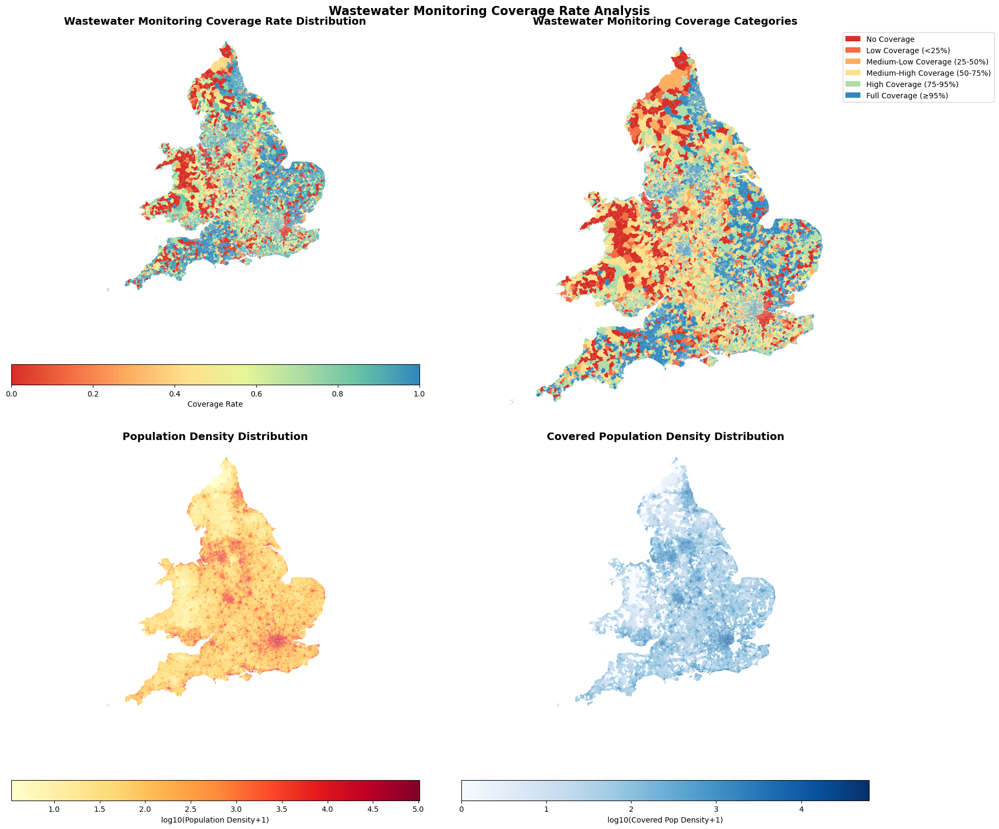

Creating interactive map...
Processing LSOA 0/34753
Processing LSOA 1000/34753
Processing LSOA 2000/34753
Processing LSOA 3000/34753
Processing LSOA 4000/34753
Processing LSOA 5000/34753
Processing LSOA 6000/34753
Processing LSOA 7000/34753
Processing LSOA 8000/34753
Processing LSOA 9000/34753
Processing LSOA 10000/34753
Processing LSOA 11000/34753
Processing LSOA 12000/34753
Processing LSOA 13000/34753
Processing LSOA 14000/34753
Processing LSOA 15000/34753
Processing LSOA 16000/34753
Processing LSOA 17000/34753
Processing LSOA 18000/34753
Processing LSOA 19000/34753
Processing LSOA 20000/34753
Processing LSOA 21000/34753
Processing LSOA 22000/34753
Processing LSOA 23000/34753
Processing LSOA 24000/34753
Processing LSOA 25000/34753
Processing LSOA 26000/34753
Processing LSOA 27000/34753
Processing LSOA 28000/34753
Processing LSOA 29000/34753
Processing LSOA 30000/34753
Processing LSOA 31000/34753
Processing LSOA 32000/34753
Processing LSOA 33000/34753
Processing LSOA 34000/34753
Inter

In [20]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

def create_coverage_map_english(results_df, lsoas_gdf):
    """
    Create coverage rate map visualization in English
    """
    
    # 1. Prepare map data
    print("Preparing map data...")
    
    # Reset lsoas index to ensure LSOA11CD is a column
    if 'LSOA11CD' not in lsoas_gdf.columns:
        lsoas_gdf = lsoas_gdf.reset_index()
    
    # Merge data
    map_data = lsoas_gdf.merge(results_df, left_on='LSOA11CD', right_on='lsoa_code', how='left')
    
    # Fill missing data
    map_data['weight_coverage_ratio'] = map_data['weight_coverage_ratio'].fillna(0)
    map_data['has_wastewater_coverage'] = map_data['has_wastewater_coverage'].fillna(False)
    
    print(f"Map data prepared, total {len(map_data)} LSOAs")
    
    # 2. Create multiple map views
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Wastewater Monitoring Coverage Rate Analysis', fontsize=16, fontweight='bold')
    
    # === Map 1: Continuous coverage rate ===
    ax1 = axes[0, 0]
    
    # Create custom colormap
    colors = ['#d73027', '#f46d43', '#fdae61', '#fee08b', '#e6f598', '#abdda4', '#66c2a5', '#3288bd']
    n_bins = 100
    cmap = LinearSegmentedColormap.from_list('coverage', colors, N=n_bins)
    
    # Plot coverage rate
    map_data.plot(column='weight_coverage_ratio', 
                  cmap=cmap, 
                  linewidth=0.1, 
                  ax=ax1,
                  legend=True,
                  legend_kwds={'label': 'Coverage Rate', 'orientation': 'horizontal', 'shrink': 0.8})
    
    ax1.set_title('Wastewater Monitoring Coverage Rate Distribution', fontsize=14, fontweight='bold')
    ax1.set_axis_off()
    
    # === Map 2: Categorical coverage rate ===
    ax2 = axes[0, 1]
    
    # Create coverage categories
    def categorize_coverage(ratio):
        if ratio == 0:
            return 'No Coverage'
        elif ratio < 0.25:
            return 'Low Coverage (<25%)'
        elif ratio < 0.5:
            return 'Medium-Low Coverage (25-50%)'
        elif ratio < 0.75:
            return 'Medium-High Coverage (50-75%)'
        elif ratio < 0.95:
            return 'High Coverage (75-95%)'
        else:
            return 'Full Coverage (≥95%)'
    
    map_data['coverage_category'] = map_data['weight_coverage_ratio'].apply(categorize_coverage)
    
    # Define category colors
    category_colors = {
        'No Coverage': '#d73027',
        'Low Coverage (<25%)': '#f46d43',
        'Medium-Low Coverage (25-50%)': '#fdae61',
        'Medium-High Coverage (50-75%)': '#fee08b',
        'High Coverage (75-95%)': '#abdda4',
        'Full Coverage (≥95%)': '#3288bd'
    }
    
    # Plot categorical map
    for category, color in category_colors.items():
        subset = map_data[map_data['coverage_category'] == category]
        if len(subset) > 0:
            subset.plot(color=color, linewidth=0.1, ax=ax2, label=category)
    
    ax2.set_title('Wastewater Monitoring Coverage Categories', fontsize=14, fontweight='bold')
    ax2.set_axis_off()
    
    # Add legend
    legend_elements = [Patch(facecolor=color, label=category) 
                      for category, color in category_colors.items()]
    ax2.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))
    
    # === Map 3: Population density ===
    ax3 = axes[1, 0]
    
    # Calculate population density (people/km²)
    map_data['area_km2'] = map_data.geometry.area / 1000000
    map_data['population_density'] = map_data['original_population'] / map_data['area_km2']
    map_data['population_density'] = map_data['population_density'].fillna(0)
    
    # Use log scale for better visualization
    map_data['log_pop_density'] = np.log10(map_data['population_density'] + 1)
    
    map_data.plot(column='log_pop_density', 
                  cmap='YlOrRd', 
                  linewidth=0.1, 
                  ax=ax3,
                  legend=True,
                  legend_kwds={'label': 'log10(Population Density+1)', 'orientation': 'horizontal', 'shrink': 0.8})
    
    ax3.set_title('Population Density Distribution', fontsize=14, fontweight='bold')
    ax3.set_axis_off()
    
    # === Map 4: Covered population ===
    ax4 = axes[1, 1]
    
    # Calculate covered population density
    map_data['covered_pop_density'] = map_data['covered_population'] / map_data['area_km2']
    map_data['covered_pop_density'] = map_data['covered_pop_density'].fillna(0)
    map_data['log_covered_density'] = np.log10(map_data['covered_pop_density'] + 1)
    
    map_data.plot(column='log_covered_density', 
                  cmap='Blues', 
                  linewidth=0.1, 
                  ax=ax4,
                  legend=True,
                  legend_kwds={'label': 'log10(Covered Pop Density+1)', 'orientation': 'horizontal', 'shrink': 0.8})
    
    ax4.set_title('Covered Population Density Distribution', fontsize=14, fontweight='bold')
    ax4.set_axis_off()
    
    plt.tight_layout()
    plt.show()
    
    return fig, map_data

def create_interactive_map_english_fixed(map_data):
    """
    Create interactive map in English (using folium) - Fixed version
    """
    try:
        import folium
        
        print("Creating interactive map...")
        
        # Convert data types to avoid numpy type issues
        map_data_clean = map_data.copy()
        
        # Convert numpy types to Python native types
        for col in ['original_population', 'weight_coverage_ratio', 'covered_population']:
            if col in map_data_clean.columns:
                map_data_clean[col] = map_data_clean[col].astype(float)
        
        # Convert to WGS84
        map_data_wgs84 = map_data_clean.to_crs('EPSG:4326')
        
        # Calculate map center
        bounds = map_data_wgs84.total_bounds
        center_lat = (bounds[1] + bounds[3]) / 2
        center_lon = (bounds[0] + bounds[2]) / 2
        
        # Create base map
        m = folium.Map(
            location=[center_lat, center_lon],
            zoom_start=8,
            tiles='OpenStreetMap'
        )
        
        # Color mapping function
        def get_color(coverage_ratio):
            if coverage_ratio == 0:
                return '#d73027'
            elif coverage_ratio < 0.25:
                return '#f46d43'
            elif coverage_ratio < 0.5:
                return '#fdae61'
            elif coverage_ratio < 0.75:
                return '#fee08b'
            elif coverage_ratio < 0.95:
                return '#abdda4'
            else:
                return '#3288bd'
        
        # Simplify the GeoJson approach
        for idx, row in map_data_wgs84.iterrows():
            if idx % 1000 == 0:
                print(f"Processing LSOA {idx}/{len(map_data_wgs84)}")
            
            # Get coverage ratio safely
            coverage_ratio = float(row.get('weight_coverage_ratio', 0))
            
            # Create popup text
            popup_text = f"""
            <b>LSOA Code:</b> {row.get('LSOA11CD', 'N/A')}<br>
            <b>Original Population:</b> {int(row.get('original_population', 0)):,}<br>
            <b>Coverage Rate:</b> {coverage_ratio:.3f}<br>
            <b>Covered Population:</b> {int(row.get('covered_population', 0)):,}
            """
            
            # Add polygon to map
            folium.GeoJson(
                row.geometry,
                style_function=lambda x, color=get_color(coverage_ratio): {
                    'fillColor': color,
                    'color': 'black',
                    'weight': 0.5,
                    'fillOpacity': 0.7,
                },
                popup=folium.Popup(popup_text, max_width=300),
                tooltip=f"LSOA: {row.get('LSOA11CD', 'N/A')} | Coverage: {coverage_ratio:.3f}"
            ).add_to(m)
        
        # Add legend
        legend_html = '''
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 200px; height: 200px; 
                    background-color: white; border:2px solid grey; z-index:9999; 
                    font-size:14px; padding: 10px">
        <p><b>Coverage Rate Legend</b></p>
        <p><i class="fa fa-square" style="color:#d73027"></i> No Coverage</p>
        <p><i class="fa fa-square" style="color:#f46d43"></i> Low Coverage (&lt;25%)</p>
        <p><i class="fa fa-square" style="color:#fdae61"></i> Medium-Low (25-50%)</p>
        <p><i class="fa fa-square" style="color:#fee08b"></i> Medium-High (50-75%)</p>
        <p><i class="fa fa-square" style="color:#abdda4"></i> High Coverage (75-95%)</p>
        <p><i class="fa fa-square" style="color:#3288bd"></i> Full Coverage (≥95%)</p>
        </div>
        '''
        m.get_root().html.add_child(folium.Element(legend_html))
        
        # Save map
        m.save('wastewater_coverage_map.html')
        print("Interactive map saved as 'wastewater_coverage_map.html'")
        
        return m
        
    except ImportError:
        print("Folium not available. Creating static map instead.")
        return create_static_detailed_map(map_data)
    except Exception as e:
        print(f"Error creating interactive map: {e}")
        print("Creating static map instead.")
        return create_static_detailed_map(map_data)

def create_static_detailed_map(map_data):
    """
    Create a detailed static map as alternative to interactive map
    """
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Detailed Wastewater Coverage Analysis', fontsize=16, fontweight='bold')
    
    # 1. Coverage rate with better color scheme
    ax1 = axes[0, 0]
    map_data.plot(column='weight_coverage_ratio', 
                  cmap='RdYlBu_r', 
                  linewidth=0.05, 
                  ax=ax1,
                  legend=True,
                  legend_kwds={'label': 'Coverage Rate', 'shrink': 0.8})
    ax1.set_title('Coverage Rate Distribution')
    ax1.set_axis_off()
    
    # 2. Population vs Coverage scatter on map
    ax2 = axes[0, 1]
    # Create size based on population
    map_data['pop_size'] = np.log10(map_data['original_population'] + 1) * 10
    
    # Plot with varying sizes
    for category in map_data['coverage_category'].unique():
        if pd.notna(category):
            subset = map_data[map_data['coverage_category'] == category]
            if len(subset) > 0:
                subset.plot(ax=ax2, 
                           markersize=subset['pop_size']/10,
                           alpha=0.6,
                           label=category)
    
    ax2.set_title('Population Size vs Coverage Category')
    ax2.set_axis_off()
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # 3. Uncovered population hotspots
    ax3 = axes[1, 0]
    map_data['uncovered_pop'] = map_data['original_population'] - map_data['covered_population']
    map_data.plot(column='uncovered_pop', 
                  cmap='Reds', 
                  linewidth=0.05, 
                  ax=ax3,
                  legend=True,
                  legend_kwds={'label': 'Uncovered Population', 'shrink': 0.8})
    ax3.set_title('Uncovered Population Hotspots')
    ax3.set_axis_off()
    
    # 4. Coverage efficiency
    ax4 = axes[1, 1]
    map_data['efficiency'] = map_data['covered_population'] / (map_data['original_population'] + 0.001)
    map_data.plot(column='efficiency', 
                  cmap='viridis', 
                  linewidth=0.05, 
                  ax=ax4,
                  legend=True,
                  legend_kwds={'label': 'Coverage Efficiency', 'shrink': 0.8})
    ax4.set_title('Coverage Efficiency')
    ax4.set_axis_off()
    
    plt.tight_layout()
    plt.show()
    
    return fig

def create_detailed_statistics_map_english(map_data):
    """
    Create detailed statistics map in English - Fixed version
    """
    fig, axes = plt.subplots(2, 3, figsize=(24, 16))
    fig.suptitle('Wastewater Monitoring Coverage Detailed Analysis Maps', fontsize=16, fontweight='bold')
    
    # 1. Total weight distribution
    ax1 = axes[0, 0]
    map_data.plot(column='total_weight', cmap='viridis', linewidth=0.1, ax=ax1, legend=True,
                  legend_kwds={'label': 'Total Weight', 'orientation': 'horizontal', 'shrink': 0.8})
    ax1.set_title('LSOA Total Weight Distribution')
    ax1.set_axis_off()
    
    # 2. Covered weight distribution
    ax2 = axes[0, 1]
    map_data.plot(column='covered_weight', cmap='plasma', linewidth=0.1, ax=ax2, legend=True,
                  legend_kwds={'label': 'Covered Weight', 'orientation': 'horizontal', 'shrink': 0.8})
    ax2.set_title('Covered Weight Distribution')
    ax2.set_axis_off()
    
    # 3. Population per unit weight
    ax3 = axes[0, 2]
    map_data['log_pop_per_weight'] = np.log10(map_data['population_per_unit_weight'] + 1)
    map_data.plot(column='log_pop_per_weight', cmap='coolwarm', linewidth=0.1, ax=ax3, legend=True,
                  legend_kwds={'label': 'log10(Pop/Weight+1)', 'orientation': 'horizontal', 'shrink': 0.8})
    ax3.set_title('Population per Unit Weight Distribution (log)')
    ax3.set_axis_off()
    
    # 4. Coverage efficiency
    ax4 = axes[1, 0]
    map_data['coverage_efficiency'] = map_data['covered_population'] / (map_data['covered_weight'] + 0.001)
    map_data['log_efficiency'] = np.log10(map_data['coverage_efficiency'] + 1)
    map_data.plot(column='log_efficiency', cmap='RdYlGn', linewidth=0.1, ax=ax4, legend=True,
                  legend_kwds={'label': 'log10(Efficiency+1)', 'orientation': 'horizontal', 'shrink': 0.8})
    ax4.set_title('Coverage Efficiency Distribution (log)')
    ax4.set_axis_off()
    
    # 5. Uncovered population
    ax5 = axes[1, 1]
    map_data['uncovered_population'] = map_data['original_population'] - map_data['covered_population']
    map_data.plot(column='uncovered_population', cmap='Reds', linewidth=0.1, ax=ax5, legend=True,
                  legend_kwds={'label': 'Uncovered Population', 'orientation': 'horizontal', 'shrink': 0.8})
    ax5.set_title('Uncovered Population Distribution')
    ax5.set_axis_off()
    
    # 6. Coverage rate categories (Fixed - using manual categories instead of quantiles)
    ax6 = axes[1, 2]
    
    # Use the existing coverage_category
    if 'coverage_category' in map_data.columns:
        category_colors = {
            'No Coverage': '#d73027',
            'Low Coverage (<25%)': '#f46d43',
            'Medium-Low Coverage (25-50%)': '#fdae61',
            'Medium-High Coverage (50-75%)': '#fee08b',
            'High Coverage (75-95%)': '#abdda4',
            'Full Coverage (≥95%)': '#3288bd'
        }
        
        for category, color in category_colors.items():
            subset = map_data[map_data['coverage_category'] == category]
            if len(subset) > 0:
                subset.plot(color=color, linewidth=0.1, ax=ax6, label=category)
        
        ax6.set_title('Coverage Rate Categories')
        ax6.set_axis_off()
        ax6.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def create_summary_statistics_english(map_data):
    """
    Create summary statistics in English
    """
    print(f"\n{'='*60}")
    print("WASTEWATER COVERAGE ANALYSIS SUMMARY")
    print(f"{'='*60}")
    
    # Basic statistics
    print(f"\n=== BASIC STATISTICS ===")
    print(f"Total LSOAs: {len(map_data):,}")
    print(f"LSOAs with geographic data: {map_data.geometry.notna().sum():,}")
    print(f"LSOAs with coverage data: {map_data['weight_coverage_ratio'].notna().sum():,}")
    print(f"LSOAs with wastewater coverage: {map_data['has_wastewater_coverage'].sum():,}")
    
    # Population statistics
    total_pop = map_data['original_population'].sum()
    covered_pop = map_data['covered_population'].sum()
    print(f"\n=== POPULATION STATISTICS ===")
    print(f"Total population: {total_pop:,}")
    print(f"Covered population: {covered_pop:,.0f}")
    print(f"Overall coverage rate: {covered_pop/total_pop:.3f} ({covered_pop/total_pop*100:.1f}%)")
    print(f"Uncovered population: {total_pop - covered_pop:,.0f}")
    
    # Coverage category statistics
    if 'coverage_category' in map_data.columns:
        coverage_stats = map_data['coverage_category'].value_counts()
        print(f"\n=== COVERAGE CATEGORY STATISTICS ===")
        for category, count in coverage_stats.items():
            percentage = (count / len(map_data)) * 100
            pop_in_category = map_data[map_data['coverage_category'] == category]['original_population'].sum()
            print(f"{category}: {count:,} LSOAs ({percentage:.1f}%) - Population: {pop_in_category:,}")
    
    # Weight statistics
    print(f"\n=== WEIGHT STATISTICS ===")
    print(f"Average total weight per LSOA: {map_data['total_weight'].mean():.2f}")
    print(f"Average covered weight per LSOA: {map_data['covered_weight'].mean():.2f}")
    print(f"Average population per unit weight: {map_data['population_per_unit_weight'].mean():.2f}")

# Run map visualization
print("Starting map visualization creation...")

# Create main coverage rate maps
fig1, map_data = create_coverage_map_english(precise_results, lsoas)

# Create detailed statistics maps
# fig2 = create_detailed_statistics_map_english(map_data)

# Create interactive map (with fallback to static)
interactive_map = create_interactive_map_english_fixed(map_data)

# Create summary statistics
create_summary_statistics_english(map_data)

# Save results as CSV with English headers
english_results = map_data[['LSOA11CD', 'original_population', 'weight_coverage_ratio', 
                           'covered_population', 'total_weight', 'covered_weight',
                           'population_per_unit_weight', 'coverage_category']].copy()

english_results.columns = ['LSOA_Code', 'Original_Population', 'Coverage_Rate', 
                          'Covered_Population', 'Total_Weight', 'Covered_Weight',
                          'Population_Per_Unit_Weight', 'Coverage_Category']

english_results.to_csv('wastewater_coverage_results_english.csv', index=False)


In [21]:
lsoas = lsoas.to_crs("EPSG:27700")


In [22]:
import geopandas as gpd
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

# === New: helpers for north arrow & scale bar ===
def add_north_arrow(ax, xy=(0.06, 0.92), text_y_offset=0.06, size=14):
    """
    Draw a simple north arrow on an axes (axes fraction coords).
    """
    ax.annotate('N',
                xy=xy, xycoords='axes fraction',
                xytext=(xy[0], xy[1]-text_y_offset),
                textcoords='axes fraction',
                ha='center', va='center',
                arrowprops=dict(arrowstyle='-|>', lw=1.5, color='black'),
                fontsize=size, color='black')

def _nice_length_m(target_m):
    """Round target length to 1/2/5*10^n."""
    if target_m <= 0:
        return 1000
    power = 10 ** np.floor(np.log10(target_m))
    for m in (1, 2, 5, 10):
        if target_m <= m * power:
            return m * power
    return 10 * power

def add_scale_bar(ax, gdf_crs, location=(0.08, 0.08)):
    """
    Draw a simple scalebar for projected CRS in meters.
    If CRS is geographic (degrees), the scalebar is skipped to avoid misleading lengths.
    """
    try:
        is_projected = getattr(gdf_crs, "is_projected", None)
        if is_projected is None:
            # old pyproj versions: try .to_string()
            is_projected = "degree" not in str(gdf_crs).lower()
    except Exception:
        is_projected = False

    if not is_projected:
        # Skip if in degrees (e.g., EPSG:4326). You can to_crs to a meter CRS before plotting if needed.
        return

    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    width_m = abs(x1 - x0)

    length_m = _nice_length_m(width_m / 5.0)  # ~1/5 of map width
    bar_x = x0 + (x1 - x0) * location[0]
    bar_y = y0 + (y1 - y0) * location[1]

    # bar height relative to axis height
    h = (y1 - y0) * 0.004

    # main bar
    ax.plot([bar_x, bar_x + length_m], [bar_y, bar_y], color='black', lw=3)
    # end ticks
    ax.plot([bar_x, bar_x], [bar_y - h, bar_y + h], color='black', lw=3)
    ax.plot([bar_x + length_m, bar_x + length_m], [bar_y - h, bar_y + h], color='black', lw=3)
    # label
    ax.text(bar_x + length_m / 2, bar_y + h * 3,
            f"{int(round(length_m / 1000))} km",
            ha='center', va='bottom', fontsize=10, color='black')

def create_coverage_map_english(results_df, lsoas_gdf):
    """
    Create coverage rate map visualization in English
    """
    # 1. Prepare map data
    print("Preparing map data...")

    if 'LSOA11CD' not in lsoas_gdf.columns:
        lsoas_gdf = lsoas_gdf.reset_index()

    map_data = lsoas_gdf.merge(results_df, left_on='LSOA11CD', right_on='lsoa_code', how='left')

    map_data['weight_coverage_ratio'] = map_data['weight_coverage_ratio'].fillna(0)
    map_data['has_wastewater_coverage'] = map_data['has_wastewater_coverage'].fillna(False)

    print(f"Map data prepared, total {len(map_data)} LSOAs")

    # 2. Create multiple map views
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('Wastewater Monitoring Coverage Rate Analysis', fontsize=16, fontweight='bold')

    # === Map 1: Continuous coverage rate (colorblind-friendly) ===
    ax1 = axes[0, 0]

    # Use 'cividis' (perceptually uniform, colorblind-friendly) instead of red/green gradients
    map_data.plot(column='weight_coverage_ratio',
                  cmap='cividis',
                  linewidth=0.1,
                  ax=ax1,
                  legend=True,
                  legend_kwds={'label': 'Coverage Rate', 'orientation': 'horizontal', 'shrink': 0.8})

    ax1.set_title('Wastewater Monitoring Coverage Rate Distribution', fontsize=14, fontweight='bold')
    ax1.set_axis_off()
    add_north_arrow(ax1)
    add_scale_bar(ax1, map_data.crs)

    # === Map 2: Categorical coverage rate (colorblind-friendly discrete palette) ===
    ax2 = axes[0, 1]

    def categorize_coverage(ratio):
        if ratio == 0:
            return 'No Coverage'
        elif ratio < 0.25:
            return 'Low Coverage (<25%)'
        elif ratio < 0.5:
            return 'Medium-Low Coverage (25-50%)'
        elif ratio < 0.75:
            return 'Medium-High Coverage (50-75%)'
        elif ratio < 0.95:
            return 'High Coverage (75-95%)'
        else:
            return 'Full Coverage (≥95%)'

    map_data['coverage_category'] = map_data['weight_coverage_ratio'].apply(categorize_coverage)

    # Discrete, red/green–free, colorblind-friendly set (greys + blues)
    category_colors = {
        'No Coverage':               '#f0f0f0',  # light grey
        'Low Coverage (<25%)':       '#deebf7',
        'Medium-Low Coverage (25-50%)': '#c6dbef',
        'Medium-High Coverage (50-75%)': '#9ecae1',
        'High Coverage (75-95%)':    '#6baed6',
        'Full Coverage (≥95%)':      '#2171b5'
    }

    for category, color in category_colors.items():
        subset = map_data[map_data['coverage_category'] == category]
        if len(subset) > 0:
            subset.plot(color=color, linewidth=0.1, ax=ax2, label=category)

    ax2.set_title('Wastewater Monitoring Coverage Categories', fontsize=14, fontweight='bold')
    ax2.set_axis_off()
    legend_elements = [Patch(facecolor=color, label=category) for category, color in category_colors.items()]
    ax2.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))
    add_north_arrow(ax2)
    add_scale_bar(ax2, map_data.crs)

    # === Map 3: Population density (unchanged) ===
    ax3 = axes[1, 0]
    map_data['area_km2'] = map_data.geometry.area / 1_000_000
    map_data['population_density'] = map_data['original_population'] / map_data['area_km2']
    map_data['population_density'] = map_data['population_density'].fillna(0)
    map_data['log_pop_density'] = np.log10(map_data['population_density'] + 1)

    map_data.plot(column='log_pop_density',
                  cmap='YlOrBr',  # also colorblind-friendly; adjust if you want to keep Blues only
                  linewidth=0.1,
                  ax=ax3,
                  legend=True,
                  legend_kwds={'label': 'log10(Population Density+1)', 'orientation': 'horizontal', 'shrink': 0.8})

    ax3.set_title('Population Density Distribution', fontsize=14, fontweight='bold')
    ax3.set_axis_off()
    add_north_arrow(ax3)
    add_scale_bar(ax3, map_data.crs)

    # === Map 4: Covered population density (unchanged) ===
    ax4 = axes[1, 1]
    map_data['covered_pop_density'] = map_data['covered_population'] / map_data['area_km2']
    map_data['covered_pop_density'] = map_data['covered_pop_density'].fillna(0)
    map_data['log_covered_density'] = np.log10(map_data['covered_pop_density'] + 1)

    map_data.plot(column='log_covered_density',
                  cmap='PuBu',
                  linewidth=0.1,
                  ax=ax4,
                  legend=True,
                  legend_kwds={'label': 'log10(Covered Pop Density+1)', 'orientation': 'horizontal', 'shrink': 0.8})

    ax4.set_title('Covered Population Density Distribution', fontsize=14, fontweight='bold')
    ax4.set_axis_off()
    add_north_arrow(ax4)
    add_scale_bar(ax4, map_data.crs)

    plt.tight_layout()
    plt.show()

    return fig, map_data


Preparing map data...
Map data prepared, total 34753 LSOAs


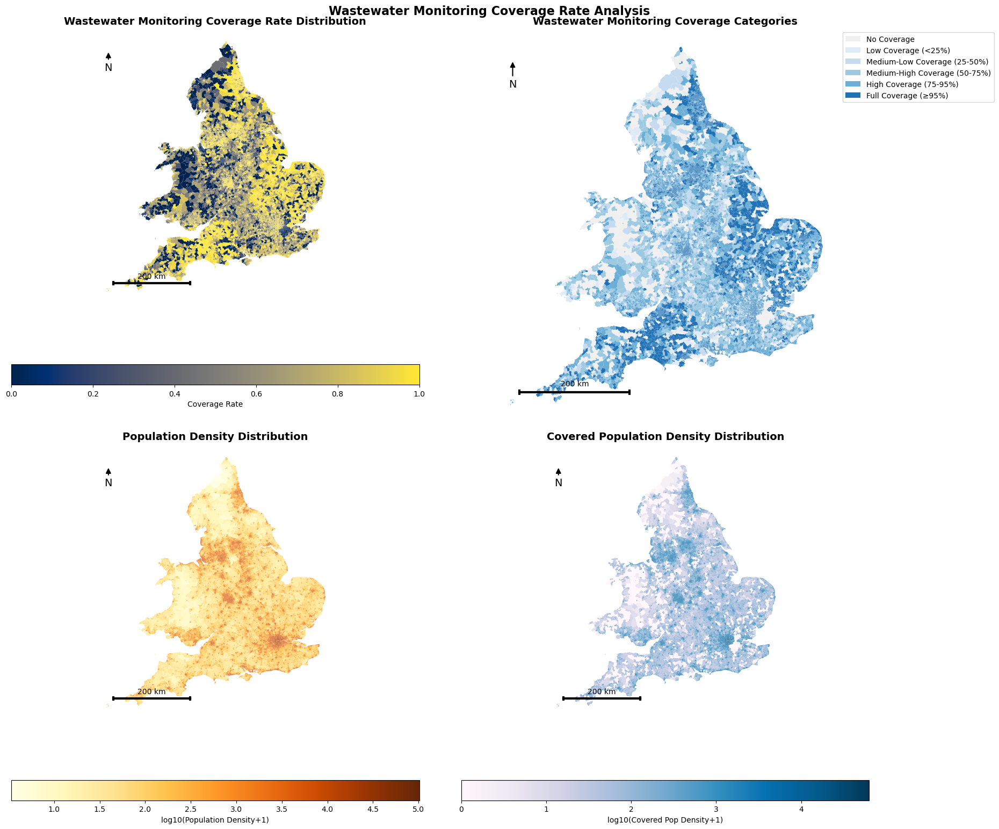

In [23]:
fig1, map_data = create_coverage_map_english(precise_results, lsoas)


Preparing map data...


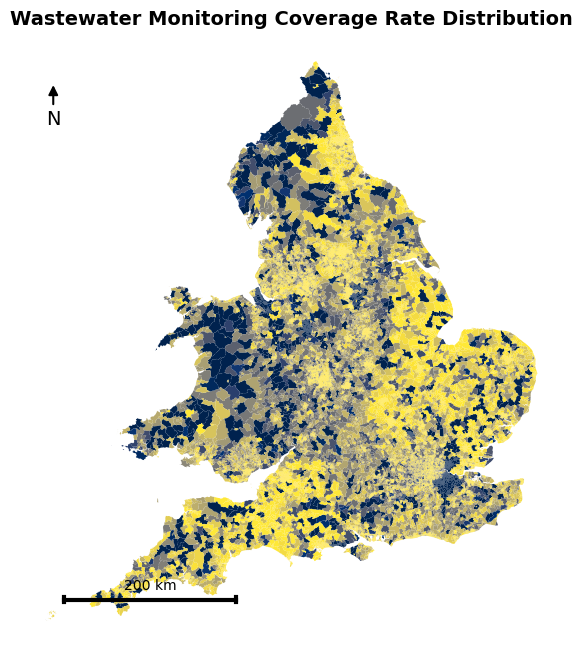

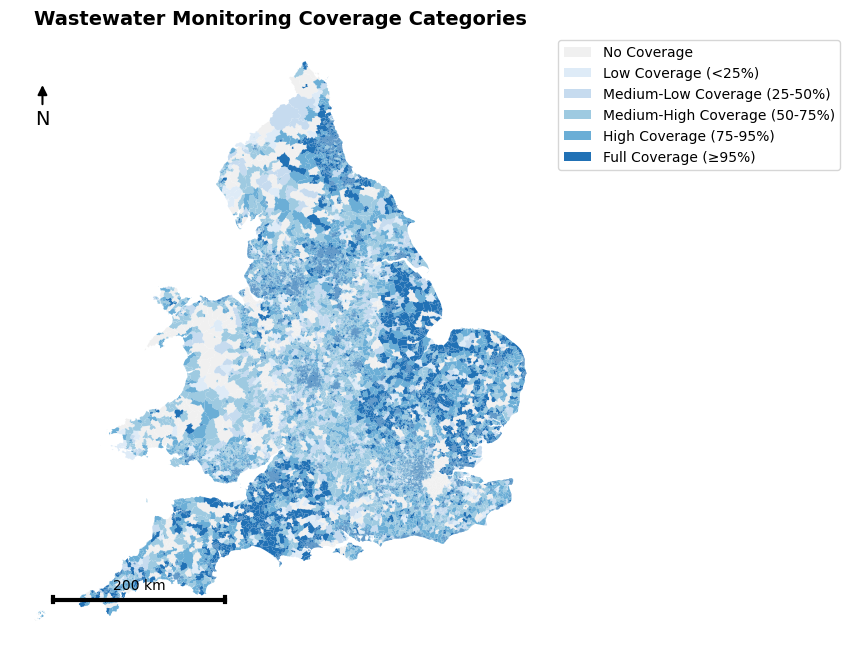

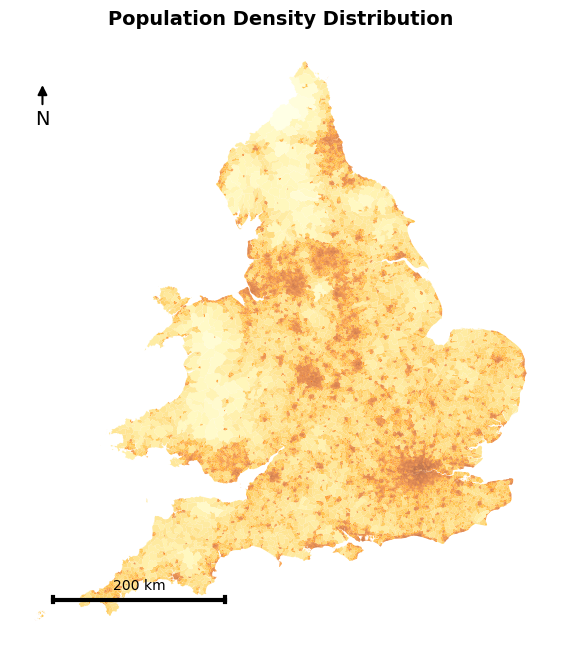

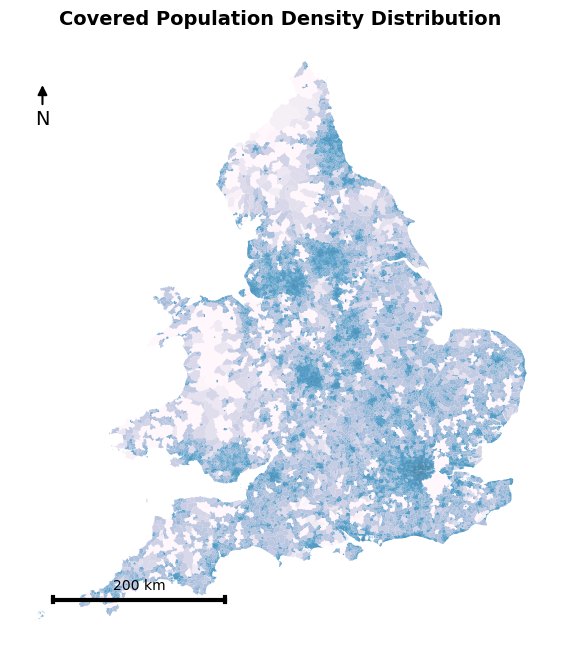

In [24]:
def create_coverage_map_english(results_df, lsoas_gdf, save_prefix=None):
    """
    Create four separate coverage-related maps (colorblind-friendly, no colorbar, north arrow & scale bar).
    save_prefix: optional, if set, will save each map as PNG with this prefix.
    """
    
    if lsoas_gdf.crs is None or lsoas_gdf.crs.to_string() != "EPSG:27700":
        lsoas_gdf = lsoas_gdf.to_crs("EPSG:27700")

    print("Preparing map data...")
    if 'LSOA11CD' not in lsoas_gdf.columns:
        lsoas_gdf = lsoas_gdf.reset_index()

    map_data = lsoas_gdf.merge(results_df, left_on='LSOA11CD', right_on='lsoa_code', how='left')
    map_data['weight_coverage_ratio'] = map_data['weight_coverage_ratio'].fillna(0)
    map_data['has_wastewater_coverage'] = map_data['has_wastewater_coverage'].fillna(False)

    # ===== Map 1: Continuous coverage rate =====
    fig1, ax1 = plt.subplots(figsize=(8, 8))
    map_data.plot(column='weight_coverage_ratio', cmap='cividis', linewidth=0.1, ax=ax1, legend=False)
    ax1.set_title('Wastewater Monitoring Coverage Rate Distribution', fontsize=14, fontweight='bold')
    ax1.set_axis_off()
    add_north_arrow(ax1)
    add_scale_bar(ax1, map_data.crs)
    if save_prefix:
        fig1.savefig(f"{save_prefix}_1_continuous_coverage.png", dpi=300, bbox_inches='tight')
    plt.show()

    # ===== Map 2: Categorical coverage rate =====
    fig2, ax2 = plt.subplots(figsize=(8, 8))
    def categorize_coverage(ratio):
        if ratio == 0:
            return 'No Coverage'
        elif ratio < 0.25:
            return 'Low Coverage (<25%)'
        elif ratio < 0.5:
            return 'Medium-Low Coverage (25-50%)'
        elif ratio < 0.75:
            return 'Medium-High Coverage (50-75%)'
        elif ratio < 0.95:
            return 'High Coverage (75-95%)'
        else:
            return 'Full Coverage (≥95%)'
    map_data['coverage_category'] = map_data['weight_coverage_ratio'].apply(categorize_coverage)
    category_colors = {
        'No Coverage':               '#f0f0f0',
        'Low Coverage (<25%)':       '#deebf7',
        'Medium-Low Coverage (25-50%)': '#c6dbef',
        'Medium-High Coverage (50-75%)': '#9ecae1',
        'High Coverage (75-95%)':    '#6baed6',
        'Full Coverage (≥95%)':      '#2171b5'
    }
    for category, color in category_colors.items():
        subset = map_data[map_data['coverage_category'] == category]
        if len(subset) > 0:
            subset.plot(color=color, linewidth=0.1, ax=ax2, label=category)
    ax2.set_title('Wastewater Monitoring Coverage Categories', fontsize=14, fontweight='bold')
    ax2.set_axis_off()
    ax2.legend(handles=[Patch(facecolor=color, label=cat) for cat, color in category_colors.items()],
               loc='upper left', bbox_to_anchor=(1, 1))
    add_north_arrow(ax2)
    add_scale_bar(ax2, map_data.crs)
    if save_prefix:
        fig2.savefig(f"{save_prefix}_2_categorical_coverage.png", dpi=300, bbox_inches='tight')
    plt.show()

    # ===== Map 3: Population density =====
    fig3, ax3 = plt.subplots(figsize=(8, 8))
    map_data['area_km2'] = map_data.geometry.area / 1_000_000
    map_data['population_density'] = map_data['original_population'] / map_data['area_km2']
    map_data['population_density'] = map_data['population_density'].fillna(0)
    map_data['log_pop_density'] = np.log10(map_data['population_density'] + 1)
    map_data.plot(column='log_pop_density', cmap='YlOrBr', linewidth=0.1, ax=ax3, legend=False)
    ax3.set_title('Population Density Distribution', fontsize=14, fontweight='bold')
    ax3.set_axis_off()
    add_north_arrow(ax3)
    add_scale_bar(ax3, map_data.crs)
    if save_prefix:
        fig3.savefig(f"{save_prefix}_3_population_density.png", dpi=300, bbox_inches='tight')
    plt.show()

    # ===== Map 4: Covered population density =====
    fig4, ax4 = plt.subplots(figsize=(8, 8))
    map_data['covered_pop_density'] = map_data['covered_population'] / map_data['area_km2']
    map_data['covered_pop_density'] = map_data['covered_pop_density'].fillna(0)
    map_data['log_covered_density'] = np.log10(map_data['covered_pop_density'] + 1)
    map_data.plot(column='log_covered_density', cmap='PuBu', linewidth=0.1, ax=ax4, legend=False)
    ax4.set_title('Covered Population Density Distribution', fontsize=14, fontweight='bold')
    ax4.set_axis_off()
    add_north_arrow(ax4)
    add_scale_bar(ax4, map_data.crs)
    if save_prefix:
        fig4.savefig(f"{save_prefix}_4_covered_population_density.png", dpi=300, bbox_inches='tight')
    plt.show()

    return map_data

map_data = create_coverage_map_english(precise_results, lsoas, save_prefix="coverage_map")


修改后的地图函数已更新，解决了重叠问题
Preparing map data...


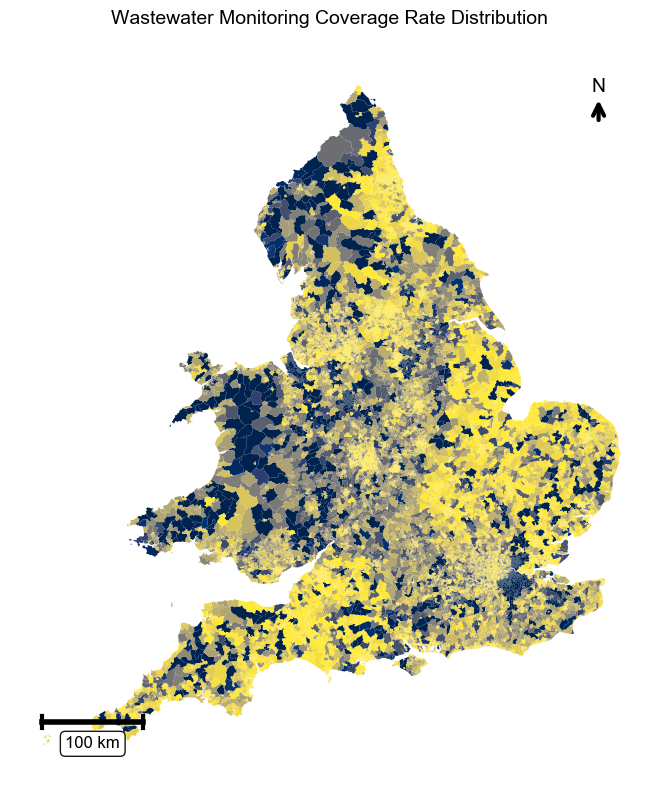

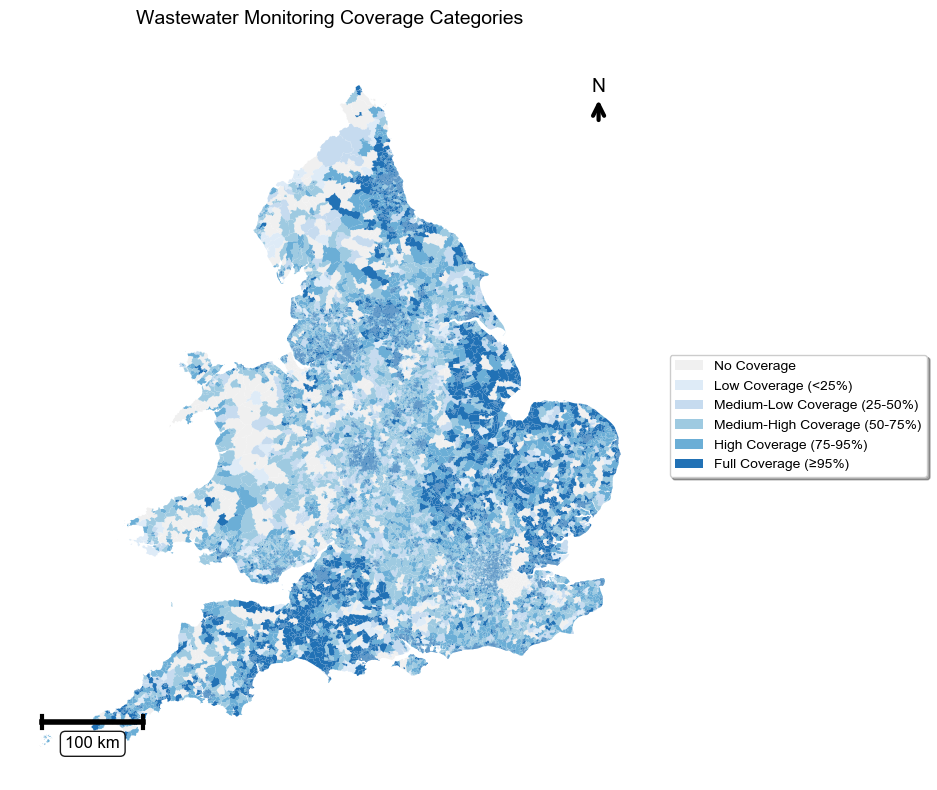

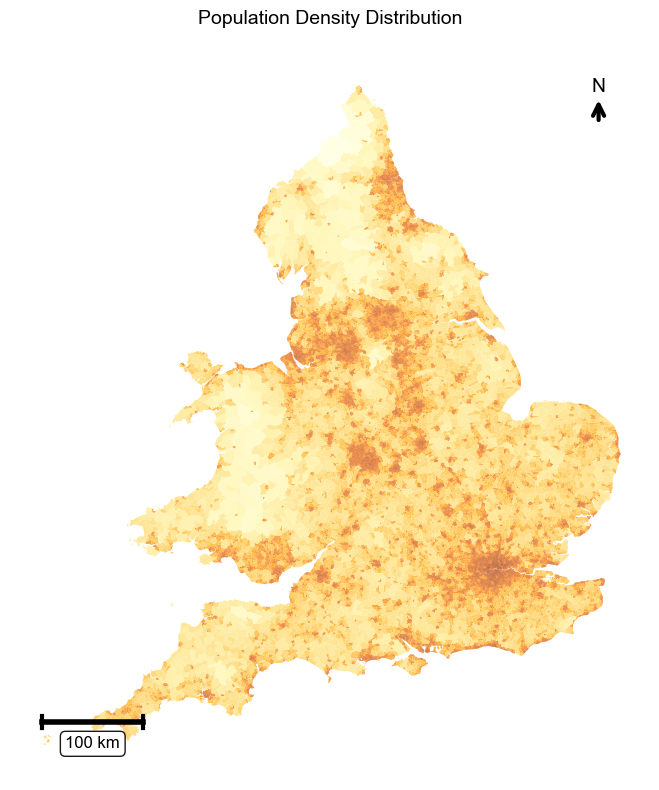

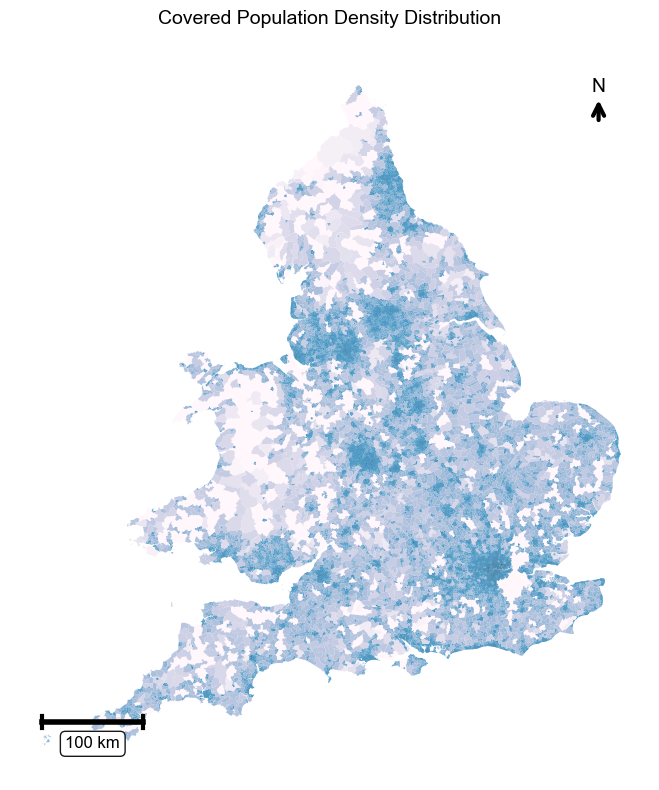

In [ ]:

# def add_north_arrow(ax):
   
   
#     xlim = ax.get_xlim()
#     ylim = ax.get_ylim()
    
   
#     arrow_x = xlim[1] - (xlim[1] - xlim[0]) * 0.08
#     arrow_y = ylim[1] - (ylim[1] - ylim[0]) * 0.08
    
    
#     arrow_size = min((xlim[1] - xlim[0]) * 0.02, (ylim[1] - ylim[0]) * 0.02)
    
   
#     arrow = patches.FancyArrowPatch(
#         (arrow_x, arrow_y - arrow_size), 
#         (arrow_x, arrow_y + arrow_size),
#         arrowstyle='->', 
#         mutation_scale=20, 
#         color='black',
#         linewidth=3
#     )
#     ax.add_patch(arrow)
    
  
#     ax.text(arrow_x, arrow_y + arrow_size * 1.8, 'N', 
#            ha='center', va='center', fontsize=14, fontweight='bold',
#            color='black')

# def add_scale_bar(ax, crs):

    
#     xlim = ax.get_xlim()
#     ylim = ax.get_ylim()
    
 
#     scale_x = xlim[0] + (xlim[1] - xlim[0]) * 0.05
#     scale_y = ylim[0] + (ylim[1] - ylim[0]) * 0.08
    
    
#     map_width = xlim[1] - xlim[0]
    
  
#     if map_width > 500000:
#         scale_length = 100000
#         scale_text = "100 km"
#     elif map_width > 200000:
#         scale_length = 50000
#         scale_text = "50 km"
#     elif map_width > 100000:
#         scale_length = 25000
#         scale_text = "25 km"
#     elif map_width > 50000:
#         scale_length = 10000
#         scale_text = "10 km"
#     else:
#         scale_length = 5000
#         scale_text = "5 km"
    
   
#     ax.plot([scale_x, scale_x + scale_length], [scale_y, scale_y], 
#             'k-', linewidth=4)
    

#     tick_height = (ylim[1] - ylim[0]) * 0.008
#     ax.plot([scale_x, scale_x], 
#             [scale_y - tick_height, scale_y + tick_height], 'k-', linewidth=3)
#     ax.plot([scale_x + scale_length, scale_x + scale_length], 
#             [scale_y - tick_height, scale_y + tick_height], 'k-', linewidth=3)
    
 
#     ax.text(scale_x + scale_length/2, scale_y - tick_height * 2.5, 
#             scale_text, ha='center', va='top', fontsize=12, fontweight='bold',
#             bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.9, edgecolor='black'))

# def create_coverage_map_english(results_df, lsoas_gdf, save_prefix=None):
#     """
#     Create four separate coverage-related maps (colorblind-friendly, no colorbar, north arrow & scale bar).
#     save_prefix: optional, if set, will save each map as PNG with this prefix.
#     """
    
#     if lsoas_gdf.crs is None or lsoas_gdf.crs.to_string() != "EPSG:27700":
#         lsoas_gdf = lsoas_gdf.to_crs("EPSG:27700")

#     print("Preparing map data...")
#     if 'LSOA11CD' not in lsoas_gdf.columns:
#         lsoas_gdf = lsoas_gdf.reset_index()

#     map_data = lsoas_gdf.merge(results_df, left_on='LSOA11CD', right_on='lsoa_code', how='left')
#     map_data['weight_coverage_ratio'] = map_data['weight_coverage_ratio'].fillna(0)
#     map_data['has_wastewater_coverage'] = map_data['has_wastewater_coverage'].fillna(False)

#     # ===== Map 1: Continuous coverage rate =====
#     fig1, ax1 = plt.subplots(figsize=(10, 8))
#     map_data.plot(column='weight_coverage_ratio', cmap='cividis', linewidth=0.1, ax=ax1, legend=False)
#     ax1.set_title('Wastewater Monitoring Coverage Rate Distribution', fontsize=14, fontweight='bold', pad=20)
#     ax1.set_axis_off()
    
  
#     ax1.margins(0.05)
    
#     add_north_arrow(ax1)
#     add_scale_bar(ax1, map_data.crs)
    
#     plt.tight_layout()
#     if save_prefix:
#         fig1.savefig(f"{save_prefix}_1_continuous_coverage.png", dpi=300, bbox_inches='tight', pad_inches=0.2)
#     plt.show()

#     # ===== Map 2: Categorical coverage rate =====
#     fig2, ax2 = plt.subplots(figsize=(12, 8))  
    
#     def categorize_coverage(ratio):
#         if ratio == 0:
#             return 'No Coverage'
#         elif ratio < 0.25:
#             return 'Low Coverage (<25%)'
#         elif ratio < 0.5:
#             return 'Medium-Low Coverage (25-50%)'
#         elif ratio < 0.75:
#             return 'Medium-High Coverage (50-75%)'
#         elif ratio < 0.95:
#             return 'High Coverage (75-95%)'
#         else:
#             return 'Full Coverage (≥95%)'
    
#     map_data['coverage_category'] = map_data['weight_coverage_ratio'].apply(categorize_coverage)
#     category_colors = {
#         'No Coverage':               '#f0f0f0',
#         'Low Coverage (<25%)':       '#deebf7',
#         'Medium-Low Coverage (25-50%)': '#c6dbef',
#         'Medium-High Coverage (50-75%)': '#9ecae1',
#         'High Coverage (75-95%)':    '#6baed6',
#         'Full Coverage (≥95%)':      '#2171b5'
#     }
    
#     for category, color in category_colors.items():
#         subset = map_data[map_data['coverage_category'] == category]
#         if len(subset) > 0:
#             subset.plot(color=color, linewidth=0.1, ax=ax2, label=category)
    
#     ax2.set_title('Wastewater Monitoring Coverage Categories', fontsize=14, fontweight='bold', pad=20)
#     ax2.set_axis_off()
    
   
#     legend_elements = [Patch(facecolor=color, label=cat) for cat, color in category_colors.items()]
#     ax2.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1.02, 0.5), 
#                fontsize=10, frameon=True, fancybox=True, shadow=True)
    
 
#     ax2.margins(0.05)
    
#     add_north_arrow(ax2)
#     add_scale_bar(ax2, map_data.crs)
    
#     plt.tight_layout()
#     if save_prefix:
#         fig2.savefig(f"{save_prefix}_2_categorical_coverage.png", dpi=300, bbox_inches='tight', pad_inches=0.2)
#     plt.show()

#     # ===== Map 3: Population density =====
#     fig3, ax3 = plt.subplots(figsize=(10, 8))
#     map_data['area_km2'] = map_data.geometry.area / 1_000_000
#     map_data['population_density'] = map_data['original_population'] / map_data['area_km2']
#     map_data['population_density'] = map_data['population_density'].fillna(0)
#     map_data['log_pop_density'] = np.log10(map_data['population_density'] + 1)
#     map_data.plot(column='log_pop_density', cmap='YlOrBr', linewidth=0.1, ax=ax3, legend=False)
#     ax3.set_title('Population Density Distribution', fontsize=14, fontweight='bold', pad=20)
#     ax3.set_axis_off()
    
  
#     ax3.margins(0.05)
    
#     add_north_arrow(ax3)
#     add_scale_bar(ax3, map_data.crs)
    
#     plt.tight_layout()
#     if save_prefix:
#         fig3.savefig(f"{save_prefix}_3_population_density.png", dpi=300, bbox_inches='tight', pad_inches=0.2)
#     plt.show()

#     # ===== Map 4: Covered population density =====
#     fig4, ax4 = plt.subplots(figsize=(10, 8))
#     map_data['covered_pop_density'] = map_data['covered_population'] / map_data['area_km2']
#     map_data['covered_pop_density'] = map_data['covered_pop_density'].fillna(0)
#     map_data['log_covered_density'] = np.log10(map_data['covered_pop_density'] + 1)
#     map_data.plot(column='log_covered_density', cmap='PuBu', linewidth=0.1, ax=ax4, legend=False)
#     ax4.set_title('Covered Population Density Distribution', fontsize=14, fontweight='bold', pad=20)
#     ax4.set_axis_off()
    
    
#     ax4.margins(0.05)
    
#     add_north_arrow(ax4)
#     add_scale_bar(ax4, map_data.crs)
    
#     plt.tight_layout()
#     if save_prefix:
#         fig4.savefig(f"{save_prefix}_4_covered_population_density.png", dpi=300, bbox_inches='tight', pad_inches=0.2)
#     plt.show()

#     return map_data






# map_data = create_coverage_map_english(precise_results, lsoas, save_prefix="coverage_map")

On the top left, our Wastewater Monitoring Coverage Rate Distribution map uses a red-to-blue color ramp (red = low coverage, blue = high) to reveal just how unevenly LSOAs in England and Wales are served by wastewater sampling. The top right panel, Wastewater Monitoring Coverage Categories, further breaks these rates into six discrete bands—from no coverage (red) through progressively higher brackets to full coverage (blue)—highlighting entire swaths of under-monitored territory. In the bottom left, the Population Density Distribution (log scale) shows expected hotspots—London, Manchester, Birmingham—in deep red, indicating very high densities. Finally, the bottom right map, Covered Population Density Distribution, overlays sampling coverage on population density (light to dark blue). By comparing the two lower panels, we can immediately spot densely populated areas that remain poorly monitored, underscoring a widespread shortfall in our current coverage strategy.

Starting at the top left, the LSOA Total Weight Distribution map (Panel 5) visualizes each area’s built-environment “capacity” based on CORINE land-use weights—highly built-up zones glow yellow while rural or natural regions appear deep purple. Directly to its right, Covered Weight Distribution (Panel 6) shows which weighted areas actually fall within wastewater catchments, revealing how monitoring aligns (or misaligns) with where people live. Moving on, the Population per Unit Weight Distribution map (Panel 7) uses a blue-to-red log scale to indicate how many residents each “weight unit” represents—blue zones mean fewer people per unit weight (higher housing efficiency), red zones mean more. In the bottom left, the Coverage Efficiency Distribution (Panel 8) calculates true monitoring efficiency—covered population divided by covered weight—so red patches signal low returns on sampling effort, while green areas are doing well. Beside it, Uncovered Population Distribution (Panel 9) highlights the remaining gaps: white areas have complete coverage, whereas deep red areas reveal large underserved populations that deserve policy attention. Finally, the Coverage Rate Categories map (Panel 10) reprises our six‐tier coverage bands from earlier, providing a familiar reference as we compare efficiency and equity across the region.

In [25]:
import pandas as pd
english_results=pd.read_csv("wastewater_coverage_results_english.csv")

In [26]:
english_results.head()
print(english_results.columns)

Index(['LSOA_Code', 'Original_Population', 'Coverage_Rate',
       'Covered_Population', 'Total_Weight', 'Covered_Weight',
       'Population_Per_Unit_Weight', 'Coverage_Category'],
      dtype='object')


In [ ]:
import pathlib

BASE_PATH = pathlib.Path('/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data')
ROOT = BASE_PATH / 'wastewater_catchment_areas_public'


lsoa_population = pd.read_csv(BASE_PATH / 'ons.gov.uk/lsoasyoaallyearst.zip', 
                              usecols=['LSOA11CD', 'year', 'Pop_Total'])
lsoa_population['year'] = lsoa_population.year.apply(lambda x: int(x[4:]))

lsoa_catchment_lookup = pd.read_csv(ROOT / 'lsoa_catchment_lookup.csv')

In [28]:
import numpy as np
import pandas as pd

# Read IMD data
imd_data = pd.read_csv("/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data/IMD2019.csv") 
# get population data of lsoa in 2015 (the IMD2019 data is literally for 2015)
lsoa_population_2015 = lsoa_population[lsoa_population.year == 2015]



# merge the IMD and 2015 population of LSOA. Some LSOAs have no IMD decile 
lsoa_imd_population = pd.merge(lsoa_population_2015, imd_data[["LSOA11CD", "IMD_Decile"]], on="LSOA11CD")
# lsoa_imd_population.to_csv("data/lsoa_imd_population.csv", index=True, encoding="utf-8")

# merge the IMD/population/catchment ID/total intersection area of LSOA
merged = pd.merge(lsoa_catchment_lookup, lsoa_imd_population, on="LSOA11CD")


lsoa_imd_population.head()
lsoa_imd_population.drop(columns=['Pop_Total', 'year'], inplace=True)

In [29]:
print(lsoa_imd_population.columns)

Index(['LSOA11CD', 'IMD_Decile'], dtype='object')


In [30]:
# align the key names
lsoa_imd_population = lsoa_imd_population.rename(columns={"LSOA11CD": "LSOA_Code"})

# now a normal one-column merge works
merged_df = (
    english_results
        .merge(lsoa_imd_population, on="LSOA_Code", how="left")   # or "inner"
)


In [31]:
print(merged_df.head())

   LSOA_Code  Original_Population  Coverage_Rate  Covered_Population  \
0  E01000001                 1375            1.0              1375.0   
1  E01000002                 1316            1.0              1316.0   
2  E01000003                 1497            1.0              1497.0   
3  E01000005                 1438            1.0              1438.0   
4  E01000006                 2043            1.0              2043.0   

   Total_Weight  Covered_Weight  Population_Per_Unit_Weight  \
0          10.0            10.0                  137.500000   
1          20.0            20.0                   65.800000   
2           6.0             6.0                  249.500000   
3          15.0            15.0                   95.866667   
4          13.0            13.0                  157.153846   

      Coverage_Category  IMD_Decile  
0  Full Coverage (≥95%)         9.0  
1  Full Coverage (≥95%)        10.0  
2  Full Coverage (≥95%)         5.0  
3  Full Coverage (≥95%)         3.0 

In [ ]:

merged_df["IMD_Decile"] = pd.to_numeric(merged_df["IMD_Decile"], errors="coerce")
merged_df = merged_df.dropna(subset=["IMD_Decile"]) 
merged_df["IMD_Decile"] = merged_df["IMD_Decile"].astype(int)


In [33]:
print(merged_df[["Coverage_Rate","Original_Population"]].describe())

       Coverage_Rate  Original_Population
count   32844.000000         32844.000000
mean        0.848869          1693.442638
std         0.271988           405.349638
min         0.000000           362.000000
25%         0.828571          1452.000000
50%         1.000000          1612.000000
75%         1.000000          1834.000000
max         1.000000         13404.000000


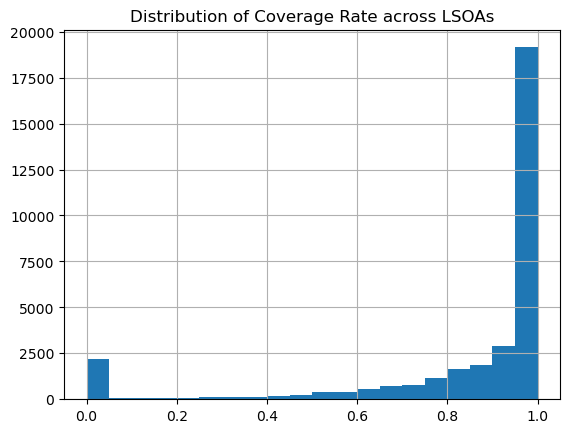

In [34]:
import matplotlib.pyplot as plt
merged_df["Coverage_Rate"].hist(bins=20)
plt.title("Distribution of Coverage Rate across LSOAs")
plt.show()

In [ ]:

grp = (merged_df
       .groupby("IMD_Decile")
       .agg( total_pop   = ("Original_Population","sum"),
             covered_pop = ("Covered_Population","sum"),
             mean_cov    = ("Coverage_Rate","mean"),
             median_cov  = ("Coverage_Rate","median") )
       .reset_index()
       .sort_values("IMD_Decile"))

grp["cov_rate_decile"] = grp["covered_pop"] / grp["total_pop"]
print(grp)

   IMD_Decile  total_pop   covered_pop  mean_cov  median_cov  cov_rate_decile
0           1    5512413  5.001053e+06  0.905372    1.000000         0.907235
1           2    5619674  4.879266e+06  0.869731    1.000000         0.868247
2           3    5744132  5.019201e+06  0.873678    1.000000         0.873796
3           4    5690970  4.871127e+06  0.852457    1.000000         0.855940
4           5    5623661  4.645154e+06  0.824970    0.977273         0.826002
5           6    5651509  4.647224e+06  0.818756    0.967204         0.822298
6           7    5492739  4.466472e+06  0.814112    0.948718         0.813159
7           8    5489663  4.551566e+06  0.828527    0.953704         0.829116
8           9    5432170  4.514494e+06  0.832080    0.952935         0.831066
9          10    5362499  4.644738e+06  0.869010    0.962963         0.866152


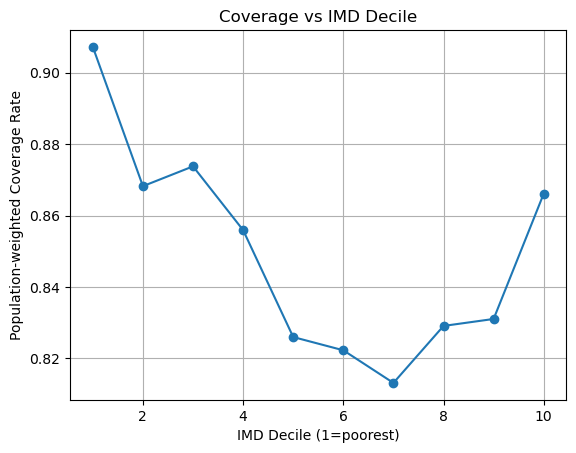

In [36]:
plt.figure()
plt.plot(grp["IMD_Decile"], grp["cov_rate_decile"], marker="o")
plt.xlabel("IMD Decile (1=poorest)")
plt.ylabel("Population-weighted Coverage Rate")
plt.title("Coverage vs IMD Decile")
plt.grid(True)
plt.show()

Gini=0.0329  

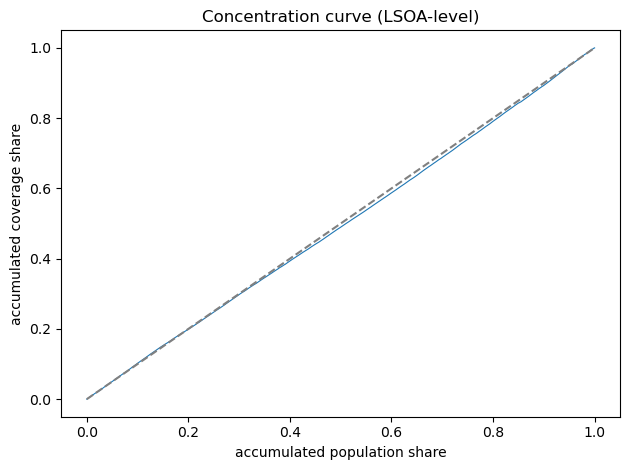

LSOA-level CI = 0.0113


In [37]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt
df = merged_df.copy()


df["pop_weights"] = df["Original_Population"]
df["cov_weights"] = df["Covered_Population"]


df_sorted = df.sort_values("IMD_Decile", ascending=False)


pop_share = df_sorted["pop_weights"] / df_sorted["pop_weights"].sum()
cov_share = df_sorted["cov_weights"] / df_sorted["cov_weights"].sum()
cum_pop   = np.cumsum(pop_share.to_numpy())
cum_cov   = np.cumsum(cov_share.to_numpy())


plt.plot(cum_pop, cum_cov, lw=.8)
plt.plot([0,1],[0,1],"--",color="grey")
plt.xlabel("accumulated population share")
plt.ylabel("accumulated coverage share")
plt.title("Concentration curve (LSOA-level)")
plt.tight_layout(); plt.show()

rank   = (np.arange(1, len(df_sorted)+1) - 0.5) / len(df_sorted)
cov_rt = df_sorted["cov_weights"] / df_sorted["pop_weights"]
mu     = np.average(cov_rt, weights=df_sorted["pop_weights"])
cov_rw = np.average((rank - rank.mean()) * (cov_rt - mu),
                    weights=df_sorted["pop_weights"])
CI = 2 * cov_rw / mu
print(f"LSOA-level CI = {CI:.4f}")


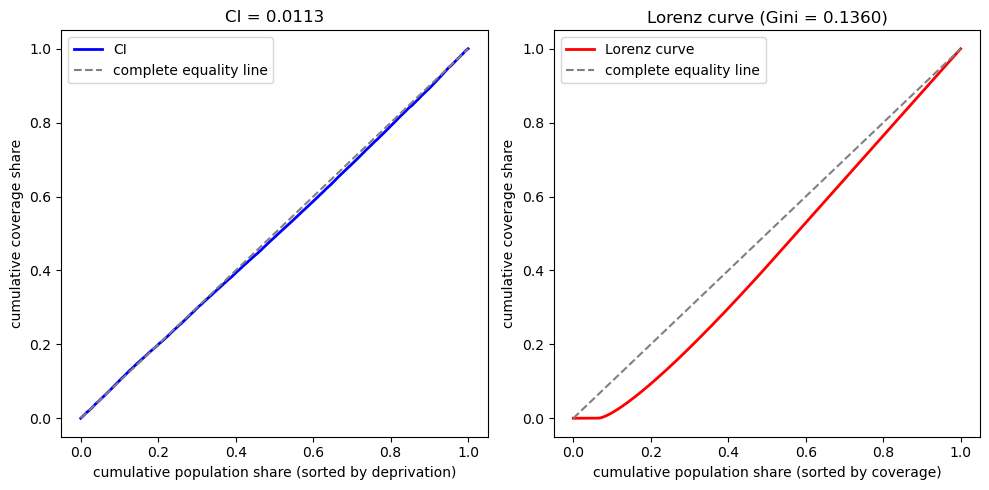


=== Results comparison ===
CI: 0.0113
Gini:     0.1360

Indicator meaning:
• CI: measure the correlation between coverage and deprivation
• Gini: measure the overall inequality of coverage distribution


In [39]:



df["coverage_rate"] = df["cov_weights"] / df["pop_weights"]
df["coverage_rate"] = df["coverage_rate"].fillna(0)

df_sorted_gini = df.sort_values("coverage_rate", ascending=True)


pop_share_gini = df_sorted_gini["pop_weights"] / df_sorted_gini["pop_weights"].sum()
cov_share_gini = df_sorted_gini["cov_weights"] / df_sorted_gini["cov_weights"].sum()
cum_pop_gini = np.cumsum(pop_share_gini.to_numpy())
cum_cov_gini = np.cumsum(cov_share_gini.to_numpy())


cum_pop_with_zero = np.concatenate([[0], cum_pop_gini])
cum_cov_with_zero = np.concatenate([[0], cum_cov_gini])


lorenz_area = np.trapz(cum_cov_with_zero, cum_pop_with_zero)
Gini = 1 - 2 * lorenz_area



plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(cum_pop, cum_cov, 'b-', lw=2, label='CI')
plt.plot([0,1],[0,1],"--",color="grey", label="complete equality line")
plt.xlabel("cumulative population share (sorted by deprivation)")
plt.ylabel("cumulative coverage share")
plt.title(f"CI = {CI:.4f}")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(cum_pop_with_zero, cum_cov_with_zero, 'r-', lw=2, label='Lorenz curve')
plt.plot([0,1],[0,1],"--",color="grey", label="complete equality line")
plt.xlabel("cumulative population share (sorted by coverage)")
plt.ylabel("cumulative coverage share")
plt.title(f"Lorenz curve (Gini = {Gini:.4f})")
plt.legend()

plt.tight_layout()
plt.show()

print(f"\n=== Results comparison ===")
print(f"CI: {CI:.4f}")
print(f"Gini:     {Gini:.4f}")
print(f"\nIndicator meaning:")
print(f"• CI: measure the correlation between coverage and deprivation")
print(f"• Gini: measure the overall inequality of coverage distribution")

In [40]:
share_total  = grp["total_pop"]  / grp["total_pop"].sum()
share_cov    = grp["covered_pop"]/ grp["covered_pop"].sum()

In [41]:
merged_df.to_csv("coverage_imd_results.csv", index=False)   

In [44]:
try:
    imd_data = pd.read_excel("IMD_ranks.xlsx")
    
    
 
    print(f"\ncolumn names:")
    for i, col in enumerate(imd_data.columns):
        print(f"  {i+1:2d}. {col}")
    
    print(f"\ndata types:")
    print(imd_data.dtypes)

    print(f"\n{'='*50}")
    print("preview of the first 5 rows of data:")
    print(f"{'='*50}")
    print(imd_data.head())
    
  
    print(f"\n{'='*50}")
    print("missing value check:")
    print(f"{'='*50}")
    missing_info = imd_data.isnull().sum()
    print(missing_info[missing_info > 0])
    if missing_info.sum() == 0:
        print("✓ no missing values")
    

    lsoa_cols = [col for col in imd_data.columns if 'LSOA' in col.upper()]
    if lsoa_cols:
        print(f"\nLSOA related columns:")
        for col in lsoa_cols:
            print(f"  - {col}")
            print(f"    example: {imd_data[col].head(3).tolist()}")
    
    
    rank_score_cols = [col for col in imd_data.columns 
                      if any(keyword in col.lower() for keyword in ['rank', 'score', 'decile', 'quintile'])]
    
    if rank_score_cols:
        print(f"\nstatistics of rank/score columns:")
        for col in rank_score_cols:
            if imd_data[col].dtype in ['int64', 'float64']:
                print(f"\n  {col}:")
                print(f"    min: {imd_data[col].min()}")
                print(f"    max: {imd_data[col].max()}")
                print(f"    mean: {imd_data[col].mean():.2f}")
                print(f"    unique: {imd_data[col].nunique()}")
    
    
    print(f"\n✓ data has been read, saved as 'imd_data'")
    print("you can proceed with the subsequent data merging and grouping operations")
    
except FileNotFoundError:
    print("❌ error: file IMD_ranks.xlsx not found")
    print("please confirm the file is in the current working directory")
    
except Exception as e:
    print(f"❌ error: {e}")
    print("please check the file format")


column names:
   1. LSOA code
   2. LSOA name (2011)
   3. Local Authority District code (2019)
   4. Local Authority District name (2019)
   5. Index of Multiple Deprivation (IMD) Score
   6. Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)
   7. Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)
   8. Income Score (rate)
   9. Income Rank (where 1 is most deprived)
  10. Income Decile (where 1 is most deprived 10% of LSOAs)
  11. Employment Score (rate)
  12. Employment Rank (where 1 is most deprived)
  13. Employment Decile (where 1 is most deprived 10% of LSOAs)
  14. Education, Skills and Training Score
  15. Education, Skills and Training Rank (where 1 is most deprived)
  16. Education, Skills and Training Decile (where 1 is most deprived 10% of LSOAs)
  17. Health Deprivation and Disability Score
  18. Health Deprivation and Disability Rank (where 1 is most deprived)
  19. Health Deprivation and Disability Decile (where 1 is mo

In [45]:
imd_data = pd.read_excel("IMD_ranks.xlsx")
key_cols = [
    'LSOA code',
    'Index of Multiple Deprivation (IMD) Score',
    'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)',
    'Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'
]
imd_clean = imd_data[key_cols].copy()

merged_data = pd.merge(english_results, imd_clean, 
                      left_on='LSOA_Code', right_on='LSOA code', how='inner')

analyisis of sensitivity

=== analysis of 10 groups ===
gini coefficient: 0.0276
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage gap: 0.0411
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%

=== analysis of 20 groups ===
gini coefficient: 0.0214
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage gap: 0.0236
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%

=== analysis of 30 groups ===
gini coefficient: 0.0203
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage gap: 0.0186
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%

=== analysis of 50 groups ===
gini coefficient: 0.0200
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage gap: 0.0167
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%


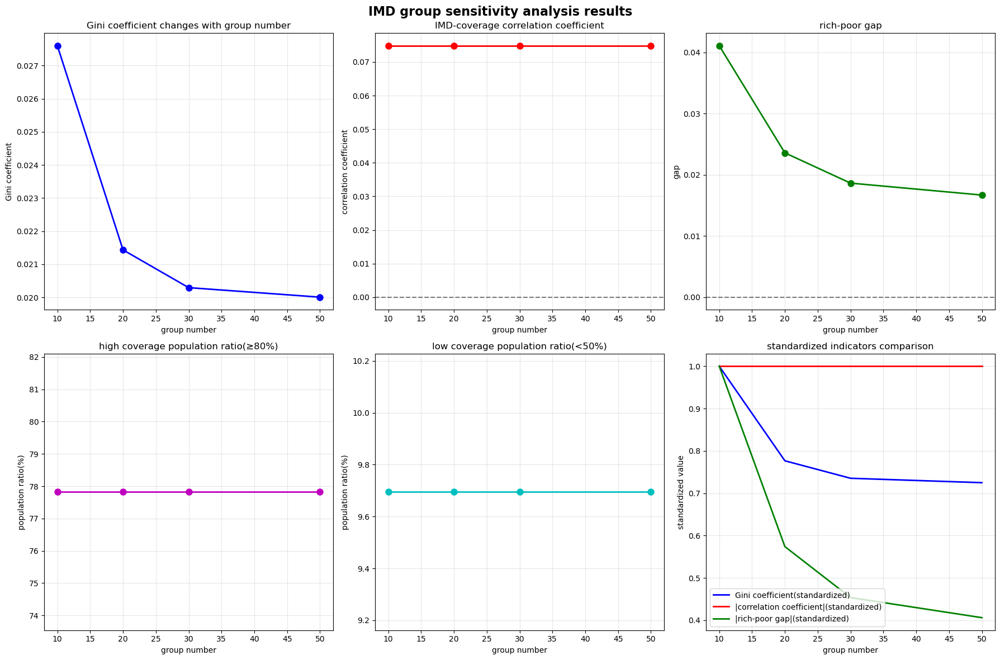


sensitivity analysis summary
gini coefficient variation coefficient: 13.82% (value range: 0.0200 - 0.0276)
correlation coefficient variation coefficient: 0.00% (value range: 0.0748 - 0.0748)
rich-poor gap variation coefficient: 38.50% (value range: 0.0167 - 0.0411)
⚠ gini coefficient is sensitive to the number of groups (CV ≥ 5%)
✓ correlation coefficient is not sensitive to the number of groups (CV < 5%)


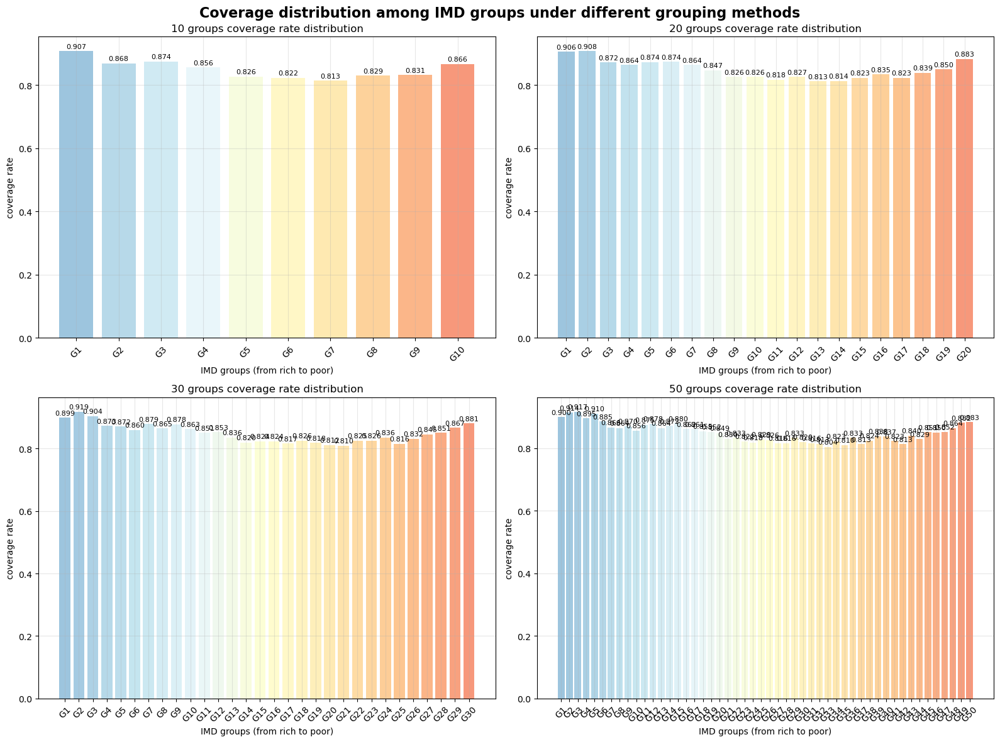


detailed comparison table
   group number    gini  IMD correlation  rich-poor gap  high coverage  \
0            10  0.0276           0.0748         0.0411        77.8233   
1            20  0.0214           0.0748         0.0236        77.8233   
2            30  0.0203           0.0748         0.0186        77.8233   
3            50  0.0200           0.0748         0.0167        77.8233   

   low coverage  
0        9.6949  
1        9.6949  
2        9.6949  
3        9.6949  


In [46]:
import seaborn as sns
from scipy import stats



def calculate_gini_coefficient(x, weights=None):
    """calculate the gini coefficient"""
    if weights is None:
        weights = np.ones_like(x)
    
    # ensure no negative values
    x = np.maximum(x, 0)
    weights = np.maximum(weights, 0)
    
    if len(x) == 0 or np.sum(weights) == 0 or np.sum(x * weights) == 0:
        return np.nan
    
    # sort by x
    sorted_indices = np.argsort(x)
    sorted_x = x[sorted_indices]
    sorted_weights = weights[sorted_indices]
    
    # calculate the cumulative weights and cumulative weighted values
    cumsum_weights = np.cumsum(sorted_weights)
    cumsum_values = np.cumsum(sorted_x * sorted_weights)
    
    # normalize
    total_weight = cumsum_weights[-1]
    total_value = cumsum_values[-1]
    
    if total_weight == 0 or total_value == 0:
        return np.nan
    
    # calculate the gini coefficient
    cumsum_weights_norm = cumsum_weights / total_weight
    cumsum_values_norm = cumsum_values / total_value
    
    # use the trapezoidal rule to calculate the area
    area_under_curve = np.trapz(cumsum_values_norm, cumsum_weights_norm)
    gini = 1 - 2 * area_under_curve
    
    return max(0, min(1, gini))  # ensure in the range of [0,1]

def create_imd_groups(data, n_groups, use_score=True):
    """
    create equal-sized groups based on IMD score or rank
    """
    data_copy = data.copy()
    
    if use_score:
        # use the IMD score, the higher the score, the poorer
        imd_column = 'Index of Multiple Deprivation (IMD) Score'
        ascending = True  # the lower the score, the richer
    else:
        # use the IMD rank, the smaller the rank, the poorer
        imd_column = 'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'
        ascending = True  # the smaller the rank, the richer
    
    # create quantile labels
    data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
        data_copy[imd_column].rank(ascending=ascending), 
        n_groups, 
        labels=[f'Group_{i+1}' for i in range(n_groups)]
    )
    
    return data_copy

def analyze_equity_by_groups(data, group_column):
    """
    analyze the equity indicators by groups
    """
    group_stats = []
    
    for group in data[group_column].unique():
        if pd.isna(group):
            continue
            
        group_data = data[data[group_column] == group]
        
        total_pop = group_data['Original_Population'].sum()
        covered_pop = group_data['Covered_Population'].sum()
        coverage_rate = covered_pop / total_pop if total_pop > 0 else 0
        
        group_stats.append({
            'Group': group,
            'LSOA_Count': len(group_data),
            'Total_Population': total_pop,
            'Covered_Population': covered_pop,
            'Coverage_Rate': coverage_rate,
            'Avg_IMD_Score': group_data['Index of Multiple Deprivation (IMD) Score'].mean(),
            'Avg_IMD_Rank': group_data['Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'].mean()
        })
    
    return pd.DataFrame(group_stats)

def perform_sensitivity_analysis(data, group_sizes=[10, 20, 30, 50]):
    """
    perform the sensitivity analysis of IMD groups
    """
    results = {}
    
    for n_groups in group_sizes:
        print(f"\n=== analysis of {n_groups} groups ===")
        
        # create groups
        grouped_data = create_imd_groups(data, n_groups, use_score=True)
        group_column = f'IMD_Group_{n_groups}'
        
        # calculate the group-level statistics
        group_stats = analyze_equity_by_groups(grouped_data, group_column)
        
        # calculate the gini coefficient
        gini_coef = calculate_gini_coefficient(
            group_stats['Coverage_Rate'].values,
            group_stats['Total_Population'].values
        )
        
        # calculate the correlation coefficient (the relationship between IMD score and coverage rate)
        correlation = stats.pearsonr(
            grouped_data['Index of Multiple Deprivation (IMD) Score'],
            grouped_data['Coverage_Rate']
        )[0]
        
        # calculate the rich-poor gap (the difference between the coverage rate of the richest group and the poorest group)
        if len(group_stats) >= 2:
            # sort by the average IMD score, the lower the score, the richer
            group_stats_sorted = group_stats.sort_values('Avg_IMD_Score', ascending=False)
            rich_poor_gap = (group_stats_sorted.iloc[0]['Coverage_Rate'] - 
                           group_stats_sorted.iloc[-1]['Coverage_Rate'])
        else:
            rich_poor_gap = 0
        
        # calculate the high and low coverage population ratio
        high_coverage_pop = grouped_data[grouped_data['Coverage_Rate'] >= 0.8]['Original_Population'].sum()
        low_coverage_pop = grouped_data[grouped_data['Coverage_Rate'] < 0.5]['Original_Population'].sum()
        total_pop = grouped_data['Original_Population'].sum()
        
        high_coverage_pct = high_coverage_pop / total_pop * 100
        low_coverage_pct = low_coverage_pop / total_pop * 100
        
        results[n_groups] = {
            'group_stats': group_stats,
            'grouped_data': grouped_data,
            'gini_coefficient': gini_coef,
            'correlation': correlation,
            'rich_poor_gap': rich_poor_gap,
            'high_coverage_pct': high_coverage_pct,
            'low_coverage_pct': low_coverage_pct,
            'n_groups': n_groups
        }
        
        print(f"gini coefficient: {gini_coef:.4f}")
        print(f"IMD-coverage correlation coefficient: {correlation:.4f}")
        print(f"rich-poor coverage gap: {rich_poor_gap:.4f}")
        print(f"high coverage population ratio: {high_coverage_pct:.2f}%")
        print(f"low coverage population ratio: {low_coverage_pct:.2f}%")
    
    return results

def plot_sensitivity_results(results):
    """
    visualize the sensitivity analysis results
    """
    # extract the indicator data
    group_sizes = list(results.keys())
    gini_coeffs = [results[n]['gini_coefficient'] for n in group_sizes]
    correlations = [results[n]['correlation'] for n in group_sizes]
    rich_poor_gaps = [results[n]['rich_poor_gap'] for n in group_sizes]
    high_coverage_pcts = [results[n]['high_coverage_pct'] for n in group_sizes]
    low_coverage_pcts = [results[n]['low_coverage_pct'] for n in group_sizes]
    
    # create the chart
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('IMD group sensitivity analysis results', fontsize=16, fontweight='bold')
    
    # 1. gini coefficient
    axes[0,0].plot(group_sizes, gini_coeffs, 'bo-', linewidth=2, markersize=8)
    axes[0,0].set_title('Gini coefficient changes with group number')
    axes[0,0].set_xlabel('group number')
    axes[0,0].set_ylabel('Gini coefficient')
    axes[0,0].grid(True, alpha=0.3)
    
    # 2. correlation coefficient
    axes[0,1].plot(group_sizes, correlations, 'ro-', linewidth=2, markersize=8)
    axes[0,1].set_title('IMD-coverage correlation coefficient')
    axes[0,1].set_xlabel('group number')
    axes[0,1].set_ylabel('correlation coefficient')
    axes[0,1].grid(True, alpha=0.3)
    axes[0,1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    # 3. rich-poor gap
    axes[0,2].plot(group_sizes, rich_poor_gaps, 'go-', linewidth=2, markersize=8)
    axes[0,2].set_title('rich-poor gap')
    axes[0,2].set_xlabel('group number')
    axes[0,2].set_ylabel('gap')
    axes[0,2].grid(True, alpha=0.3)
    axes[0,2].axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    # 4. high coverage population ratio
    axes[1,0].plot(group_sizes, high_coverage_pcts, 'mo-', linewidth=2, markersize=8)
    axes[1,0].set_title('high coverage population ratio(≥80%)')
    axes[1,0].set_xlabel('group number')
    axes[1,0].set_ylabel('population ratio(%)')
    axes[1,0].grid(True, alpha=0.3)
    
    # 5. low coverage population ratio
    axes[1,1].plot(group_sizes, low_coverage_pcts, 'co-', linewidth=2, markersize=8)
    axes[1,1].set_title('low coverage population ratio(<50%)')
    axes[1,1].set_xlabel('group number')
    axes[1,1].set_ylabel('population ratio(%)')
    axes[1,1].grid(True, alpha=0.3)
    
    # 6. 综合对比
    axes[1,2].plot(group_sizes, np.array(gini_coeffs)/np.max(gini_coeffs), 'b-', label='Gini coefficient(standardized)', linewidth=2)
    axes[1,2].plot(group_sizes, np.abs(correlations)/np.max(np.abs(correlations)), 'r-', label='|correlation coefficient|(standardized)', linewidth=2)
    axes[1,2].plot(group_sizes, np.abs(rich_poor_gaps)/np.max(np.abs(rich_poor_gaps)), 'g-', label='|rich-poor gap|(standardized)', linewidth=2)
    axes[1,2].set_title('standardized indicators comparison')
    axes[1,2].set_xlabel('group number')
    axes[1,2].set_ylabel('standardized value')
    axes[1,2].legend()
    axes[1,2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*60)
    print("sensitivity analysis summary")
    print("="*60)
    
   
    gini_cv = np.std(gini_coeffs) / np.mean(gini_coeffs) * 100
    corr_cv = np.std(np.abs(correlations)) / np.mean(np.abs(correlations)) * 100
    gap_cv = np.std(np.abs(rich_poor_gaps)) / np.mean(np.abs(rich_poor_gaps)) * 100
    
    print(f"gini coefficient variation coefficient: {gini_cv:.2f}% (value range: {min(gini_coeffs):.4f} - {max(gini_coeffs):.4f})")
    print(f"correlation coefficient variation coefficient: {corr_cv:.2f}% (value range: {min(correlations):.4f} - {max(correlations):.4f})")
    print(f"rich-poor gap variation coefficient: {gap_cv:.2f}% (value range: {min(rich_poor_gaps):.4f} - {max(rich_poor_gaps):.4f})")
    
    if gini_cv < 5:
        print("✓ gini coefficient is not sensitive to the number of groups (CV < 5%)")
    else:
        print("⚠ gini coefficient is sensitive to the number of groups (CV ≥ 5%)")
        
    if corr_cv < 5:
        print("✓ correlation coefficient is not sensitive to the number of groups (CV < 5%)")
    else:
        print("⚠ correlation coefficient is sensitive to the number of groups (CV ≥ 5%)")

def plot_group_comparison(results):
    """
    compare the coverage distribution among different grouping methods
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Coverage distribution among IMD groups under different grouping methods', fontsize=16, fontweight='bold')
    
    group_sizes = [10, 20, 30, 50]
    
    for i, n_groups in enumerate(group_sizes):
        row, col = i // 2, i % 2
        ax = axes[row, col]
        
        group_stats = results[n_groups]['group_stats']
        
        
        group_stats_sorted = group_stats.sort_values('Avg_IMD_Score', ascending=False)
        
        x_pos = range(len(group_stats_sorted))
        coverage_rates = group_stats_sorted['Coverage_Rate'].values
        
        bars = ax.bar(x_pos, coverage_rates, alpha=0.7, 
                     color=plt.cm.RdYlBu_r(np.linspace(0.2, 0.8, len(group_stats_sorted))))
        
        ax.set_title(f'{n_groups} groups coverage rate distribution')
        ax.set_xlabel('IMD groups (from rich to poor)')
        ax.set_ylabel('coverage rate')
        ax.set_xticks(x_pos)
        ax.set_xticklabels([f'G{i+1}' for i in x_pos], rotation=45)
        ax.grid(True, alpha=0.3)
        
        
        for j, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


print("analyisis of sensitivity")
sensitivity_results = perform_sensitivity_analysis(merged_data, [10, 20, 30, 50])


plot_sensitivity_results(sensitivity_results)
plot_group_comparison(sensitivity_results)


print("\n" + "="*80)
print("detailed comparison table")
print("="*80)

comparison_df = pd.DataFrame({
    'group number': list(sensitivity_results.keys()),
    'gini': [sensitivity_results[n]['gini_coefficient'] for n in sensitivity_results.keys()],
    'IMD correlation': [sensitivity_results[n]['correlation'] for n in sensitivity_results.keys()],
    'rich-poor gap': [sensitivity_results[n]['rich_poor_gap'] for n in sensitivity_results.keys()],
    'high coverage': [sensitivity_results[n]['high_coverage_pct'] for n in sensitivity_results.keys()],
    'low coverage': [sensitivity_results[n]['low_coverage_pct'] for n in sensitivity_results.keys()]
})

print(comparison_df.round(4))


=== Calculate Gini coefficient ===
Gini = 0.1360


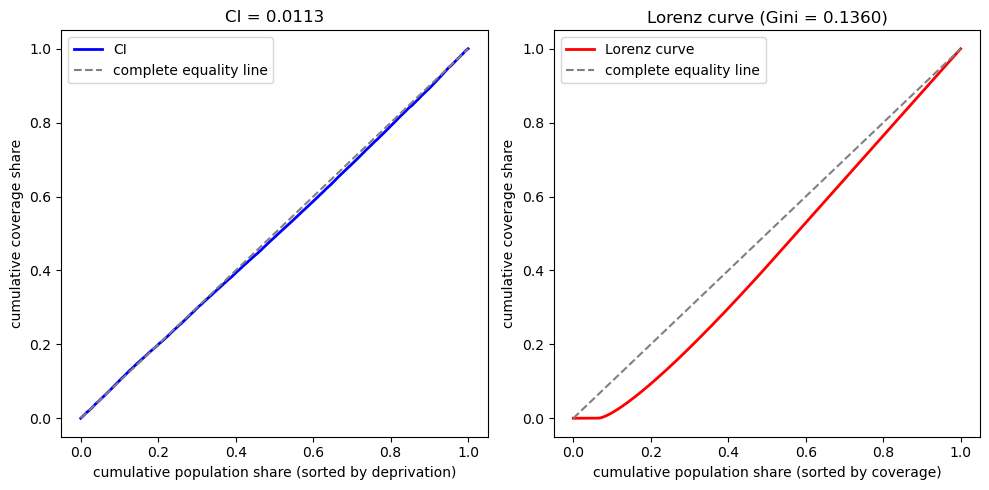


=== Results comparison ===
CI: 0.0113
Gini:     0.1360

Indicator meaning:
• CI: measure the correlation between coverage and deprivation
• Gini: measure the overall inequality of coverage distribution


In [47]:
print(f"\n=== Calculate Gini coefficient ===")

# calculate the coverage rate
df["coverage_rate"] = df["cov_weights"] / df["pop_weights"]
df["coverage_rate"] = df["coverage_rate"].fillna(0)

# sort by coverage rate (from low to high)
df_sorted_gini = df.sort_values("coverage_rate", ascending=True)

# calculate the cumulative share
pop_share_gini = df_sorted_gini["pop_weights"] / df_sorted_gini["pop_weights"].sum()
cov_share_gini = df_sorted_gini["cov_weights"] / df_sorted_gini["cov_weights"].sum()
cum_pop_gini = np.cumsum(pop_share_gini.to_numpy())
cum_cov_gini = np.cumsum(cov_share_gini.to_numpy())

# add the starting point (0,0)
cum_pop_with_zero = np.concatenate([[0], cum_pop_gini])
cum_cov_with_zero = np.concatenate([[0], cum_cov_gini])

# Gini coefficient = 1 - 2 * (area under the Lorenz curve)
lorenz_area = np.trapz(cum_cov_with_zero, cum_pop_with_zero)
Gini = 1 - 2 * lorenz_area

print(f"Gini = {Gini:.4f}")

# plot the Lorenz curve
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.plot(cum_pop, cum_cov, 'b-', lw=2, label='CI')
plt.plot([0,1],[0,1],"--",color="grey", label="complete equality line")
plt.xlabel("cumulative population share (sorted by deprivation)")
plt.ylabel("cumulative coverage share")
plt.title(f"CI = {CI:.4f}")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(cum_pop_with_zero, cum_cov_with_zero, 'r-', lw=2, label='Lorenz curve')
plt.plot([0,1],[0,1],"--",color="grey", label="complete equality line")
plt.xlabel("cumulative population share (sorted by coverage)")
plt.ylabel("cumulative coverage share")
plt.title(f"Lorenz curve (Gini = {Gini:.4f})")
plt.legend()

plt.tight_layout()
plt.show()


print(f"\n=== Results comparison ===")
print(f"CI: {CI:.4f}")
print(f"Gini:     {Gini:.4f}")
print(f"\nIndicator meaning:")
print(f"• CI: measure the correlation between coverage and deprivation")
print(f"• Gini: measure the overall inequality of coverage distribution")

In [48]:

print("=== IMD distribution ===")
print("IMD_Decile statistics (1=most deprived, 10=least deprived):")
print(df['IMD_Decile'].value_counts().sort_index())

print("\n=== coverage rate basic statistics ===")
print(df['Coverage_Rate'].describe())

print(f"\n=== data integrity check ===")
print(f"total records: {len(df)}")
print(f"IMD_Decile missing values: {df['IMD_Decile'].isna().sum()}")
print(f"Coverage_Rate missing values: {df['Coverage_Rate'].isna().sum()}")


df_clean = df.dropna(subset=['IMD_Decile', 'Coverage_Rate', 'Original_Population'])
print(f"cleaned records: {len(df_clean)}")

print(f"\n=== preliminary analysis of the correlation between IMD and coverage rate ===")
correlation = df_clean['IMD_Decile'].corr(df_clean['Coverage_Rate'])
print(f"correlation between IMD decile and coverage rate: {correlation:.4f}")

if correlation > 0.1:
    print("positive correlation -> IMD higher (richer) areas have higher coverage rate ⚠️")
elif correlation < -0.1:
    print("negative correlation -> IMD higher (richer) areas have lower coverage rate")
else:
    print("weak correlation")


=== IMD distribution ===
IMD_Decile statistics (1=most deprived, 10=least deprived):
IMD_Decile
1     3284
2     3284
3     3285
4     3284
5     3285
6     3284
7     3284
8     3285
9     3284
10    3285
Name: count, dtype: int64

=== coverage rate basic statistics ===
count    32844.000000
mean         0.848869
std          0.271988
min          0.000000
25%          0.828571
50%          1.000000
75%          1.000000
max          1.000000
Name: Coverage_Rate, dtype: float64

=== data integrity check ===
total records: 32844
IMD_Decile missing values: 0
Coverage_Rate missing values: 0
cleaned records: 32844

=== preliminary analysis of the correlation between IMD and coverage rate ===
correlation between IMD decile and coverage rate: -0.0600
weak correlation


analyisis of sensitivity

=== analysis of 10 equal-sized groups ===
Gini coefficient: 0.0276
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage rate gap: 0.0411
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%

=== analysis of 20 equal-sized groups ===
Gini coefficient: 0.0214
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage rate gap: 0.0236
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%

=== analysis of 30 equal-sized groups ===
Gini coefficient: 0.0203
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage rate gap: 0.0186
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%

=== analysis of 50 equal-sized groups ===
Gini coefficient: 0.0200
IMD-coverage correlation coefficient: 0.0748
rich-poor coverage rate gap: 0.0167
high coverage population ratio: 77.82%
low coverage population ratio: 9.69%


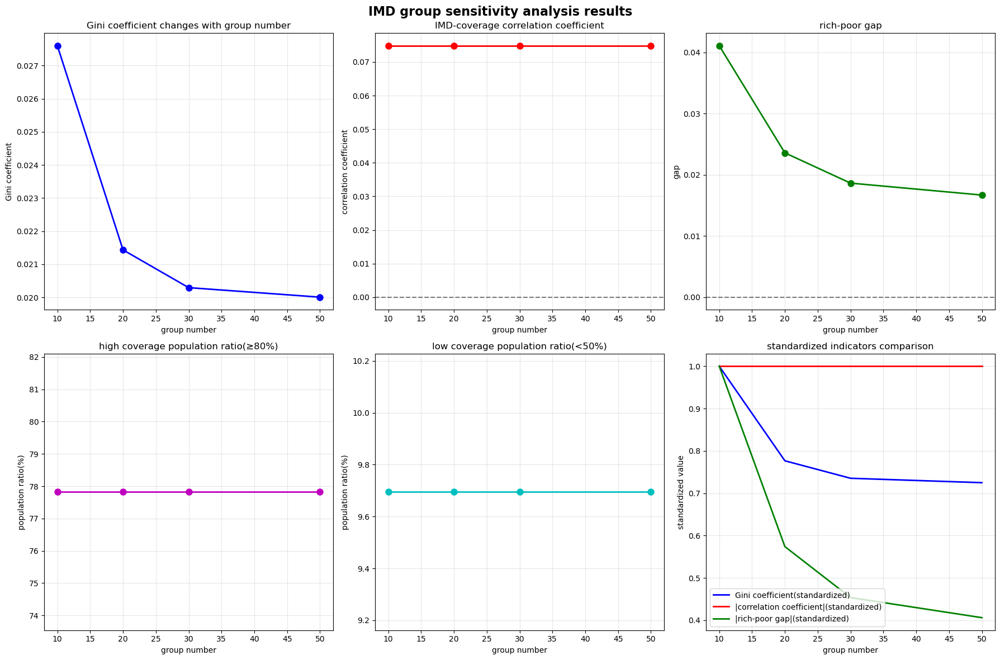

Gini coefficient variation coefficient: 13.82% (value range: 0.0200 - 0.0276)
correlation coefficient variation coefficient: 0.00% (value range: 0.0748 - 0.0748)
rich-poor gap variation coefficient: 38.50% (value range: 0.0167 - 0.0411)
⚠ Gini coefficient is sensitive to the number of groups (CV ≥ 5%)
✓ correlation coefficient is not sensitive to the number of groups (CV < 5%)


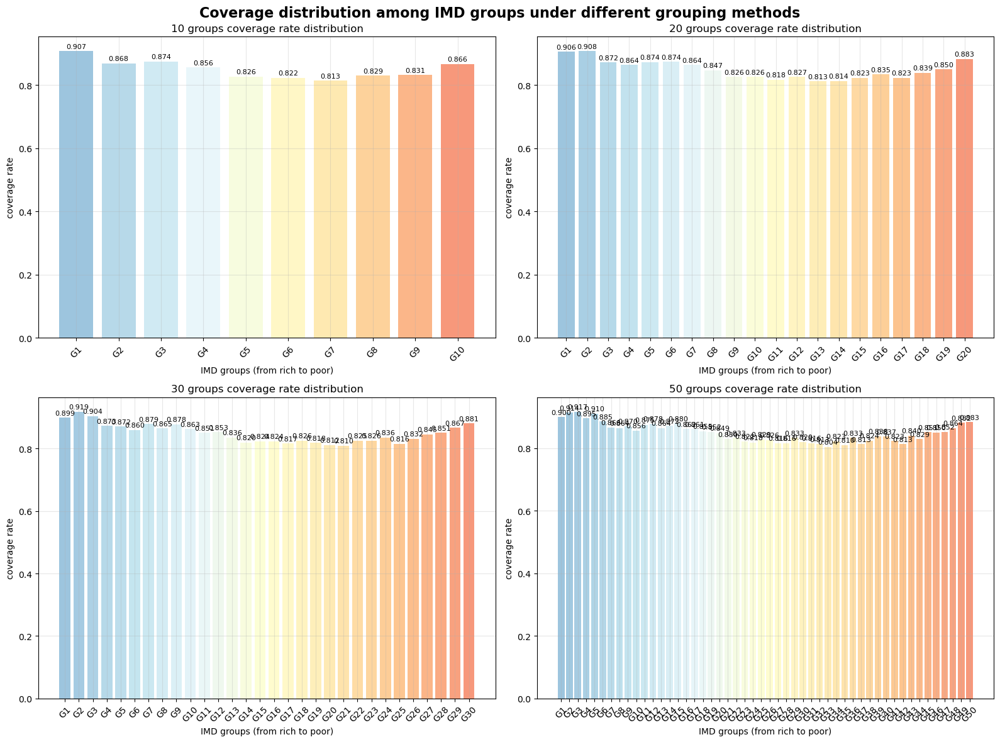


detailed comparison table
   group number    gini  IMD correlation  rich-poor gap  high coverage  \
0            10  0.0276           0.0748         0.0411        77.8233   
1            20  0.0214           0.0748         0.0236        77.8233   
2            30  0.0203           0.0748         0.0186        77.8233   
3            50  0.0200           0.0748         0.0167        77.8233   

   low coverage  
0        9.6949  
1        9.6949  
2        9.6949  
3        9.6949  


In [49]:
def calculate_gini_coefficient(x, weights=None):
    """calculate the Gini coefficient"""
    if weights is None:
        weights = np.ones_like(x)
    
    
    x = np.maximum(x, 0)
    weights = np.maximum(weights, 0)
    
    if len(x) == 0 or np.sum(weights) == 0 or np.sum(x * weights) == 0:
        return np.nan
    
    
    sorted_indices = np.argsort(x)
    sorted_x = x[sorted_indices]
    sorted_weights = weights[sorted_indices]
    
   
    cumsum_weights = np.cumsum(sorted_weights)
    cumsum_values = np.cumsum(sorted_x * sorted_weights)
    
    
    total_weight = cumsum_weights[-1]
    total_value = cumsum_values[-1]
    
    if total_weight == 0 or total_value == 0:
        return np.nan
    
    
    cumsum_weights_norm = cumsum_weights / total_weight
    cumsum_values_norm = cumsum_values / total_value
    
    
    area_under_curve = np.trapz(cumsum_values_norm, cumsum_weights_norm)
    gini = 1 - 2 * area_under_curve
    
    return max(0, min(1, gini))  

def create_imd_groups(data, n_groups, use_score=True):
    """
    create equal-sized groups based on IMD score or rank
    """
    data_copy = data.copy()
    
    if use_score:
        
        imd_column = 'Index of Multiple Deprivation (IMD) Score'
        ascending = True  
    else:
        
        imd_column = 'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'
        ascending = True  
    
    
    data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
        data_copy[imd_column].rank(ascending=ascending), 
        n_groups, 
        labels=[f'Group_{i+1}' for i in range(n_groups)]
    )
    
    return data_copy

def analyze_equity_by_groups(data, group_column):
   
    group_stats = []
    
    for group in data[group_column].unique():
        if pd.isna(group):
            continue
            
        group_data = data[data[group_column] == group]
        
        total_pop = group_data['Original_Population'].sum()
        covered_pop = group_data['Covered_Population'].sum()
        coverage_rate = covered_pop / total_pop if total_pop > 0 else 0
        
        group_stats.append({
            'Group': group,
            'LSOA_Count': len(group_data),
            'Total_Population': total_pop,
            'Covered_Population': covered_pop,
            'Coverage_Rate': coverage_rate,
            'Avg_IMD_Score': group_data['Index of Multiple Deprivation (IMD) Score'].mean(),
            'Avg_IMD_Rank': group_data['Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'].mean()
        })
    
    return pd.DataFrame(group_stats)

def perform_sensitivity_analysis(data, group_sizes=[10, 20, 30, 50]):
    """
    perform IMD group sensitivity analysis
    """
    results = {}
    
    for n_groups in group_sizes:
        print(f"\n=== analysis of {n_groups} equal-sized groups ===")
        
        # create groups
        grouped_data = create_imd_groups(data, n_groups, use_score=True)
        group_column = f'IMD_Group_{n_groups}'
        
        # calculate group-level statistics
        group_stats = analyze_equity_by_groups(grouped_data, group_column)
        
        # calculate the Gini coefficient
        gini_coef = calculate_gini_coefficient(
            group_stats['Coverage_Rate'].values,
            group_stats['Total_Population'].values
        )
        
        # calculate the correlation coefficient (the relationship between IMD score and coverage rate)
        correlation = stats.pearsonr(
            grouped_data['Index of Multiple Deprivation (IMD) Score'],
            grouped_data['Coverage_Rate']
        )[0]
        
        # calculate the rich-poor gap (the difference in coverage rate between the richest and poorest groups)
        if len(group_stats) >= 2:
            # sort by average IMD score, the lower the richer
            group_stats_sorted = group_stats.sort_values('Avg_IMD_Score',ascending=False)
            rich_poor_gap = (group_stats_sorted.iloc[0]['Coverage_Rate'] - 
                           group_stats_sorted.iloc[-1]['Coverage_Rate'])
        else:
            rich_poor_gap = 0
        
        # calculate the high and low coverage rate population ratio
        high_coverage_pop = grouped_data[grouped_data['Coverage_Rate'] >= 0.8]['Original_Population'].sum()
        low_coverage_pop = grouped_data[grouped_data['Coverage_Rate'] < 0.5]['Original_Population'].sum()
        total_pop = grouped_data['Original_Population'].sum()
        
        high_coverage_pct = high_coverage_pop / total_pop * 100
        low_coverage_pct = low_coverage_pop / total_pop * 100
        
        results[n_groups] = {
            'group_stats': group_stats,
            'grouped_data': grouped_data,
            'gini_coefficient': gini_coef,
            'correlation': correlation,
            'rich_poor_gap': rich_poor_gap,
            'high_coverage_pct': high_coverage_pct,
            'low_coverage_pct': low_coverage_pct,
            'n_groups': n_groups
        }
        
        print(f"Gini coefficient: {gini_coef:.4f}")
        print(f"IMD-coverage correlation coefficient: {correlation:.4f}")
        print(f"rich-poor coverage rate gap: {rich_poor_gap:.4f}")
        print(f"high coverage population ratio: {high_coverage_pct:.2f}%")
        print(f"low coverage population ratio: {low_coverage_pct:.2f}%")
    
    return results

def plot_sensitivity_results(results):
    """
    visualize the sensitivity analysis results
    """
    # extract the indicator data
    group_sizes = list(results.keys())
    gini_coeffs = [results[n]['gini_coefficient'] for n in group_sizes]
    correlations = [results[n]['correlation'] for n in group_sizes]
    rich_poor_gaps = [results[n]['rich_poor_gap'] for n in group_sizes]
    high_coverage_pcts = [results[n]['high_coverage_pct'] for n in group_sizes]
    low_coverage_pcts = [results[n]['low_coverage_pct'] for n in group_sizes]
    
    # create the chart
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('IMD group sensitivity analysis results', fontsize=16, fontweight='bold')
    
    # 1. Gini coefficient
    axes[0,0].plot(group_sizes, gini_coeffs, 'bo-', linewidth=2, markersize=8)
    axes[0,0].set_title('Gini coefficient changes with group number')
    axes[0,0].set_xlabel('group number')
    axes[0,0].set_ylabel('Gini coefficient')
    axes[0,0].grid(True, alpha=0.3)
    
    # 2. correlation coefficient
    axes[0,1].plot(group_sizes, correlations, 'ro-', linewidth=2, markersize=8)
    axes[0,1].set_title('IMD-coverage correlation coefficient')
    axes[0,1].set_xlabel('group number')
    axes[0,1].set_ylabel('correlation coefficient')
    axes[0,1].grid(True, alpha=0.3)
    axes[0,1].axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    # 3. rich-poor gap
    axes[0,2].plot(group_sizes, rich_poor_gaps, 'go-', linewidth=2, markersize=8)
    axes[0,2].set_title('rich-poor gap')
    axes[0,2].set_xlabel('group number')
    axes[0,2].set_ylabel('gap')
    axes[0,2].grid(True, alpha=0.3)
    axes[0,2].axhline(y=0, color='black', linestyle='--', alpha=0.5)
    
    # 4. high coverage population ratio
    axes[1,0].plot(group_sizes, high_coverage_pcts, 'mo-', linewidth=2, markersize=8)
    axes[1,0].set_title('high coverage population ratio(≥80%)')
    axes[1,0].set_xlabel('group number')
    axes[1,0].set_ylabel('population ratio(%)')
    axes[1,0].grid(True, alpha=0.3)
    
    # 5. low coverage population ratio
    axes[1,1].plot(group_sizes, low_coverage_pcts, 'co-', linewidth=2, markersize=8)
    axes[1,1].set_title('low coverage population ratio(<50%)')
    axes[1,1].set_xlabel('group number')
    axes[1,1].set_ylabel('population ratio(%)')
    axes[1,1].grid(True, alpha=0.3)
    
    # 6. comprehensive comparison
    axes[1,2].plot(group_sizes, np.array(gini_coeffs)/np.max(gini_coeffs), 'b-', label='Gini coefficient(standardized)', linewidth=2)
    axes[1,2].plot(group_sizes, np.abs(correlations)/np.max(np.abs(correlations)), 'r-', label='|correlation coefficient|(standardized)', linewidth=2)
    axes[1,2].plot(group_sizes, np.abs(rich_poor_gaps)/np.max(np.abs(rich_poor_gaps)), 'g-', label='|rich-poor gap|(standardized)', linewidth=2)
    axes[1,2].set_title('standardized indicators comparison')
    axes[1,2].set_xlabel('group number')
    axes[1,2].set_ylabel('standardized value')
    axes[1,2].legend()
    axes[1,2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    

    
    # calculate the coefficient of variation for each indicator
    gini_cv = np.std(gini_coeffs) / np.mean(gini_coeffs) * 100
    corr_cv = np.std(np.abs(correlations)) / np.mean(np.abs(correlations)) * 100
    gap_cv = np.std(np.abs(rich_poor_gaps)) / np.mean(np.abs(rich_poor_gaps)) * 100
    
    print(f"Gini coefficient variation coefficient: {gini_cv:.2f}% (value range: {min(gini_coeffs):.4f} - {max(gini_coeffs):.4f})")
    print(f"correlation coefficient variation coefficient: {corr_cv:.2f}% (value range: {min(correlations):.4f} - {max(correlations):.4f})")
    print(f"rich-poor gap variation coefficient: {gap_cv:.2f}% (value range: {min(rich_poor_gaps):.4f} - {max(rich_poor_gaps):.4f})")
    
    if gini_cv < 5:
        print("✓ Gini coefficient is not sensitive to the number of groups (CV < 5%)")
    else:
        print("⚠ Gini coefficient is sensitive to the number of groups (CV ≥ 5%)")
        
    if corr_cv < 5:
        print("✓ correlation coefficient is not sensitive to the number of groups (CV < 5%)")
    else:
        print("⚠ correlation coefficient is sensitive to the number of groups (CV ≥ 5%)")

def plot_group_comparison(results):
    """
    compare the coverage rate distribution among different grouping methods
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Coverage distribution among IMD groups under different grouping methods', fontsize=16, fontweight='bold')
    
    group_sizes = [10, 20, 30, 50]
    
    for i, n_groups in enumerate(group_sizes):
        row, col = i // 2, i % 2
        ax = axes[row, col]
        
        group_stats = results[n_groups]['group_stats']
        
        
        group_stats_sorted = group_stats.sort_values('Avg_IMD_Score',ascending=False)
        
        x_pos = range(len(group_stats_sorted))
        coverage_rates = group_stats_sorted['Coverage_Rate'].values
        
        bars = ax.bar(x_pos, coverage_rates, alpha=0.7, 
                     color=plt.cm.RdYlBu_r(np.linspace(0.2, 0.8, len(group_stats_sorted))))
        
        ax.set_title(f'{n_groups} groups coverage rate distribution')
        ax.set_xlabel('IMD groups (from rich to poor)')
        ax.set_ylabel('coverage rate')
        ax.set_xticks(x_pos)
        ax.set_xticklabels([f'G{i+1}' for i in x_pos], rotation=45)
        ax.grid(True, alpha=0.3)
        
        
        for j, bar in enumerate(bars):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


print("analyisis of sensitivity")
sensitivity_results = perform_sensitivity_analysis(merged_data, [10, 20, 30, 50])


plot_sensitivity_results(sensitivity_results)
plot_group_comparison(sensitivity_results)


print("\n" + "="*80)
print("detailed comparison table")
print("="*80)

comparison_df = pd.DataFrame({
    'group number': list(sensitivity_results.keys()),
    'gini': [sensitivity_results[n]['gini_coefficient'] for n in sensitivity_results.keys()],
    'IMD correlation': [sensitivity_results[n]['correlation'] for n in sensitivity_results.keys()],
    'rich-poor gap': [sensitivity_results[n]['rich_poor_gap'] for n in sensitivity_results.keys()],
    'high coverage': [sensitivity_results[n]['high_coverage_pct'] for n in sensitivity_results.keys()],
    'low coverage': [sensitivity_results[n]['low_coverage_pct'] for n in sensitivity_results.keys()]
})

print(comparison_df.round(4))

sensitivity analysis of CI...
=== Concentration Index (CI) sensitivity analysis ===

=== analysis of 10 equal-sized groups ===
overall CI: 0.011705 (SE: 0.001767)
between-group CI: 0.011794 (SE: 0.010495)
explanation: wastewater monitoring services are biased towards poor areas (|CI|=0.0117)
average sample size in each group: 3284

=== analysis of 20 equal-sized groups ===
overall CI: 0.011705 (SE: 0.001767)
between-group CI: 0.011666 (SE: 0.007640)
explanation: wastewater monitoring services are biased towards poor areas (|CI|=0.0117)
average sample size in each group: 1642

=== analysis of 30 equal-sized groups ===
overall CI: 0.011705 (SE: 0.001767)
between-group CI: 0.011726 (SE: 0.006271)
explanation: wastewater monitoring services are biased towards poor areas (|CI|=0.0117)
average sample size in each group: 1095

=== analysis of 50 equal-sized groups ===
overall CI: 0.011705 (SE: 0.001767)
between-group CI: 0.011710 (SE: 0.004918)
explanation: wastewater monitoring services are 

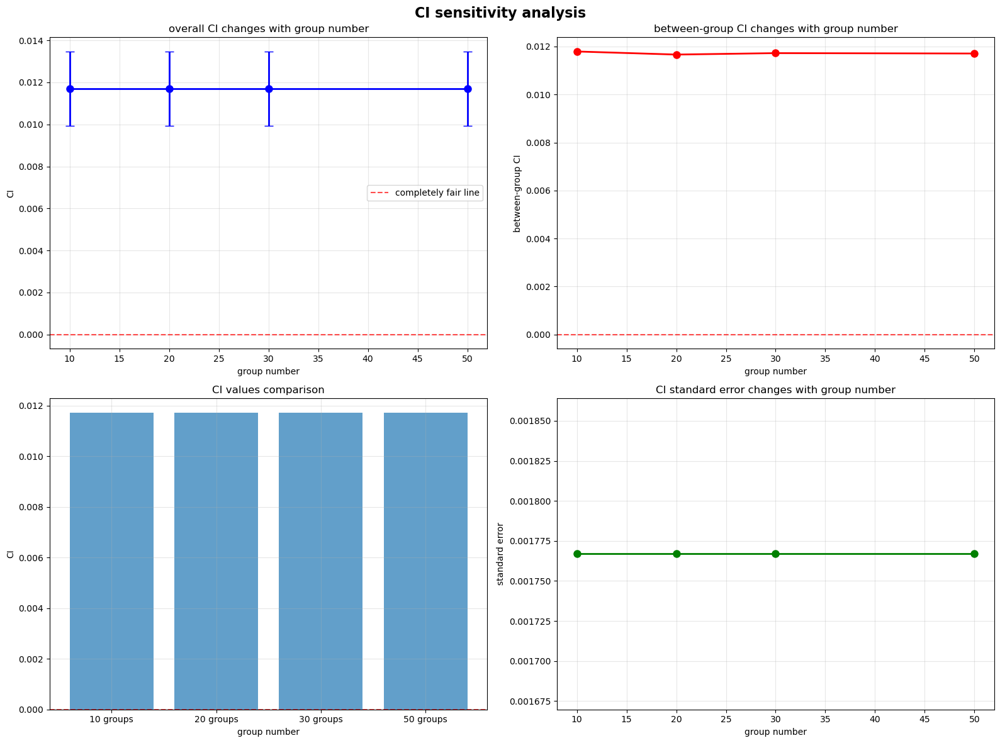

CI sensitivity analysis detailed comparison table
   group number  overall CI  overall CI standard error  between-group CI  \
0            10    0.011705                   0.001767          0.011794   
1            20    0.011705                   0.001767          0.011666   
2            30    0.011705                   0.001767          0.011726   
3            50    0.011705                   0.001767          0.011710   

   between-group CI standard error  
0                         0.010495  
1                         0.007640  
2                         0.006271  
3                         0.004918  

overall CI variation coefficient: 0.00%
between-group CI variation coefficient: 0.39%
✓ overall CI is not sensitive to the number of groups (CV < 5%)

mean CI value: 0.011705
→ wastewater monitoring services are approximately fair

CI analysis vs traditional indicators
   group number    gini        CI  IMD correlation
0            10  0.0276  0.011705           0.0748
1          

In [50]:
def calculate_concentration_index(health_variable, socioeconomic_variable, sample_weights=None):
   
    
    data = pd.DataFrame({
        'health': health_variable,
        'ses': socioeconomic_variable,
        'weight': sample_weights if sample_weights is not None else np.ones(len(health_variable))
    }).dropna()
    
    if len(data) == 0:
        return np.nan, np.nan
    
    
    data = data.sort_values('ses',ascending=False)
    
    # calculate the cumulative weight
    data['cum_weight'] = data['weight'].cumsum()
    data['total_weight'] = data['weight'].sum()
    data['cum_pop_prop'] = data['cum_weight'] / data['total_weight']
    
    # calculate the relative rank (R_i)
    data['rank'] = (data['cum_pop_prop'] + data['cum_pop_prop'].shift(1).fillna(0)) / 2
    
    # calculate the weighted average health level
    weighted_health_mean = (data['health'] * data['weight']).sum() / data['weight'].sum()
    
    if weighted_health_mean == 0:
        return np.nan, np.nan
    
    # calculate the CI
    ci = 2 * ((data['health'] * data['weight'] * data['rank']).sum() / data['weight'].sum()) / weighted_health_mean - 1
    
    # calculate the standard error (simplified version)
    n = len(data)
    se = np.sqrt(np.var(data['health']) / n) / weighted_health_mean
    
    return ci, se

def analyze_ci_by_groups(data, group_column):
    """
    analyze the CI by groups
    """
    group_data = data.copy()
    
    
    group_cis = []
    for group in group_data[group_column].unique():
        if pd.isna(group):
            continue
            
        subset = group_data[group_data[group_column] == group]
        
        if len(subset) < 5:  
            ci, se = np.nan, np.nan
        else:
            ci, se = calculate_concentration_index(
                subset['Coverage_Rate'],
                subset['Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'],
                subset['Original_Population']
            )
        
        group_cis.append({
            'Group': group,
            'CI': ci,
            'SE': se,
            'Sample_Size': len(subset),
            'Total_Population': subset['Original_Population'].sum()
        })
    
    return pd.DataFrame(group_cis)

def perform_ci_sensitivity_analysis(data, group_sizes=[10, 20, 30, 50]):
    """
    perform CI sensitivity analysis
    """
    ci_results = {}
    
    print("=== Concentration Index (CI) sensitivity analysis ===\n")
    
    for n_groups in group_sizes:
        print(f"=== analysis of {n_groups} equal-sized groups ===")
        
        # create groups (based on IMD score)
        data_copy = data.copy()
        data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
            data_copy['Index of Multiple Deprivation (IMD) Score'].rank(ascending=True), 
            n_groups, 
            labels=[f'Group_{i+1}' for i in range(n_groups)]
        )
        
        # 1. overall CI (all LSOAs)
        overall_ci, overall_se = calculate_concentration_index(
            data_copy['Coverage_Rate'],
            data_copy['Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'],
            data_copy['Original_Population']
        )
        
        # 2. analyze the CI by groups
        group_column = f'IMD_Group_{n_groups}'
        group_ci_stats = analyze_ci_by_groups(data_copy, group_column)
        
        # 3. group-level CI
        group_summary = data_copy.groupby(group_column).agg({
            'Coverage_Rate': lambda x: np.average(x, weights=data_copy.loc[x.index, 'Original_Population']),
            'Original_Population': 'sum',
            'Index of Multiple Deprivation (IMD) Score': 'mean',
            'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)': 'mean'
        }).reset_index()
        
        between_group_ci, between_group_se = calculate_concentration_index(
            group_summary['Coverage_Rate'],
            group_summary['Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)'],
            group_summary['Original_Population']
        )
        
        ci_results[n_groups] = {
            'overall_ci': overall_ci,
            'overall_se': overall_se,
            'between_group_ci': between_group_ci,
            'between_group_se': between_group_se,
            'group_ci_stats': group_ci_stats,
            'group_summary': group_summary,
            'grouped_data': data_copy
        }
        
        print(f"overall CI: {overall_ci:.6f} (SE: {overall_se:.6f})")
        print(f"between-group CI: {between_group_ci:.6f} (SE: {between_group_se:.6f})")
        
        if not np.isnan(overall_ci):
            if overall_ci > 0:
                print(f"explanation: wastewater monitoring services are biased towards poor areas (|CI|={abs(overall_ci):.4f})")
            elif overall_ci < 0:
                print(f"explanation: wastewater monitoring services are biased towards rich areas (|CI|={abs(overall_ci):.4f})")
            else:
                print("explanation: wastewater monitoring services are relatively fair")
        
        print(f"average sample size in each group: {group_ci_stats['Sample_Size'].mean():.0f}")
        print()
    
    return ci_results

def plot_ci_sensitivity_results(ci_results):
    """
    visualize the CI sensitivity analysis results
    """
    group_sizes = list(ci_results.keys())
    overall_cis = [ci_results[n]['overall_ci'] for n in group_sizes]
    between_group_cis = [ci_results[n]['between_group_ci'] for n in group_sizes]
    overall_ses = [ci_results[n]['overall_se'] for n in group_sizes]
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('CI sensitivity analysis', fontsize=16, fontweight='bold')
    
    # 1. overall CI changes
    axes[0,0].errorbar(group_sizes, overall_cis, yerr=overall_ses, 
                       fmt='bo-', linewidth=2, markersize=8, capsize=5)
    axes[0,0].set_title('overall CI changes with group number')
    axes[0,0].set_xlabel('group number')
    axes[0,0].set_ylabel('CI')
    axes[0,0].grid(True, alpha=0.3)
    axes[0,0].axhline(y=0, color='red', linestyle='--', alpha=0.7, label='completely fair line')
    axes[0,0].legend()
    
    # 2. between-group CI changes
    axes[0,1].plot(group_sizes, between_group_cis, 'ro-', linewidth=2, markersize=8)
    axes[0,1].set_title('between-group CI changes with group number')
    axes[0,1].set_xlabel('group number')
    axes[0,1].set_ylabel('between-group CI')
    axes[0,1].grid(True, alpha=0.3)
    axes[0,1].axhline(y=0, color='red', linestyle='--', alpha=0.7)
    
    # 3. CI value distribution comparison
    ci_values = []
    ci_labels = []
    for n in group_sizes:
        ci_values.extend([ci_results[n]['overall_ci']])
        ci_labels.extend([f'{n} groups'])
    
    axes[1,0].bar(range(len(ci_values)), ci_values, alpha=0.7)
    axes[1,0].set_title('CI values comparison')
    axes[1,0].set_xlabel('group number')
    axes[1,0].set_ylabel('CI')
    axes[1,0].set_xticks(range(len(ci_labels)))
    axes[1,0].set_xticklabels(ci_labels)
    axes[1,0].axhline(y=0, color='red', linestyle='--', alpha=0.7)
    axes[1,0].grid(True, alpha=0.3)
    
    # 4. standard error changes
    axes[1,1].plot(group_sizes, overall_ses, 'go-', linewidth=2, markersize=8)
    axes[1,1].set_title('CI standard error changes with group number')
    axes[1,1].set_xlabel('group number')
    axes[1,1].set_ylabel('standard error')
    axes[1,1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def create_ci_comparison_table(ci_results):
    """
    create the CI sensitivity analysis comparison table
    """
    comparison_data = []
    for n_groups in ci_results.keys():
        comparison_data.append({
            'group number': n_groups,
            'overall CI': ci_results[n_groups]['overall_ci'],
            'overall CI standard error': ci_results[n_groups]['overall_se'],
            'between-group CI': ci_results[n_groups]['between_group_ci'],
            'between-group CI standard error': ci_results[n_groups]['between_group_se']
        })
    
    comparison_df = pd.DataFrame(comparison_data)
    
    print("="*80)
    print("CI sensitivity analysis detailed comparison table")
    print("="*80)
    print(comparison_df.round(6))
    
    # calculate the coefficient of variation
    overall_ci_cv = np.std([abs(x) for x in comparison_df['overall CI']]) / np.mean([abs(x) for x in comparison_df['overall CI']]) * 100
    between_ci_cv = np.std([abs(x) for x in comparison_df['between-group CI']]) / np.mean([abs(x) for x in comparison_df['between-group CI']]) * 100
    
    print(f"\noverall CI variation coefficient: {overall_ci_cv:.2f}%")
    print(f"between-group CI variation coefficient: {between_ci_cv:.2f}%")
    
    if overall_ci_cv < 5:
        print("✓ overall CI is not sensitive to the number of groups (CV < 5%)")
    else:
        print("⚠ overall CI is sensitive to the number of groups (CV ≥ 5%)")
    
    # CI explanation
    mean_ci = comparison_df['overall CI'].mean()
    print(f"\nmean CI value: {mean_ci:.6f}")
    if abs(mean_ci) < 0.05:
        print("→ wastewater monitoring services are approximately fair")
    elif mean_ci > 0:
        print("→ wastewater monitoring services significantly偏向贫困地区")
  
    
    return comparison_df

# execute the CI sensitivity analysis
print("sensitivity analysis of CI...")
ci_sensitivity_results = perform_ci_sensitivity_analysis(merged_data, [10, 20, 30, 50])

# visualize the results
plot_ci_sensitivity_results(ci_sensitivity_results)

# create the comparison table
ci_comparison_df = create_ci_comparison_table(ci_sensitivity_results)

# compare with the previous results
print("\n" + "="*80)
print("CI analysis vs traditional indicators")
print("="*80)

traditional_gini = [0.0276, 0.0214, 0.0203, 0.0200]
ci_values = [abs(ci_sensitivity_results[n]['overall_ci']) for n in [10, 20, 30, 50]]

comparison_methods = pd.DataFrame({
    'group number': [10, 20, 30, 50],
    'gini': traditional_gini,
    'CI': ci_values,
    'IMD correlation': [0.0748] * 4  #  
})

print(comparison_methods.round(6))

# correlation analysis
gini_ci_corr = np.corrcoef(traditional_gini, ci_values)[0, 1]
print(f"\ngini coefficient and CI correlation: {gini_ci_corr:.4f}")

if gini_ci_corr > 0.8:
    print("✓ gini coefficient and CI are highly correlated, the results are consistent")
else:
    print("⚠ gini coefficient and CI are not highly correlated, further analysis is needed")

create the coverage vs IMD decile comparison plot for different groupings...


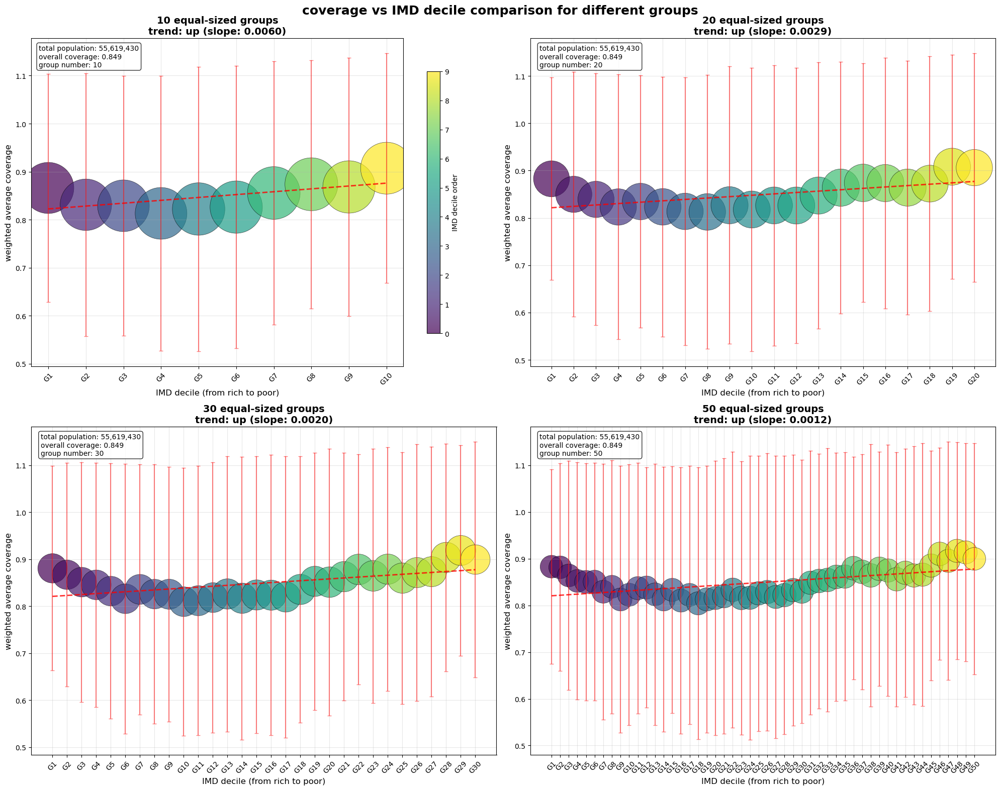


generate the detailed comparison statistics table...
coverage statistics comparison for different groupings
   group number  average coverage  coverage standard deviation  \
0            10            0.8493                       0.0297   
1            20            0.8493                       0.0298   
2            30            0.8493                       0.0297   
3            50            0.8493                       0.0298   

   coefficient of variation  trend slope  highest coverage  lowest coverage  \
0                    0.0350       0.0060            0.9073           0.8132   
1                    0.0351       0.0029            0.9083           0.8127   
2                    0.0349       0.0020            0.9186           0.8096   
3                    0.0351       0.0012            0.9168           0.8045   

   coverage range  
0          0.0941  
1          0.0956  
2          0.1090  
3          0.1123  

create the trend analysis plot...


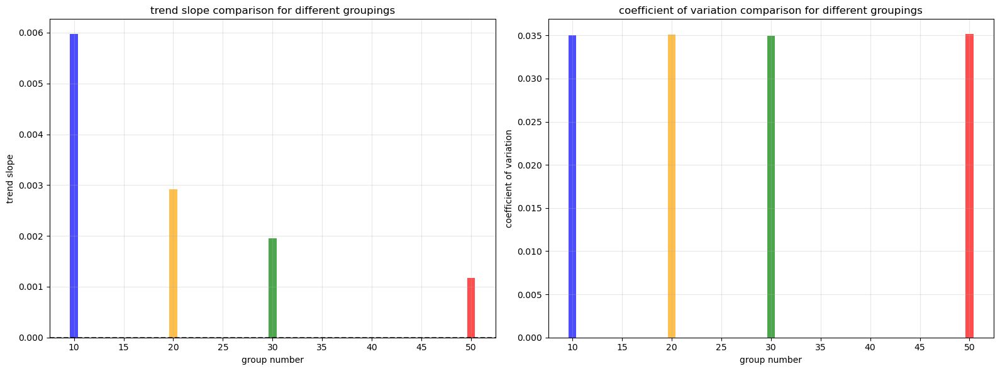


grouping method sensitivity analysis summary
trend slope coefficient of variation: 60.58%
coefficient of variation of variation: 0.21%
⚠ the trend slope is sensitive to the grouping method
✓ the coefficient of variation is relatively stable for different groupings


In [51]:

def create_coverage_vs_imd_plots(data, group_sizes=[10, 20, 30, 50]):
    """
    create the coverage vs IMD decile comparison plot for different groups
    """
    fig, axes = plt.subplots(2, 2, figsize=(20, 16))
    fig.suptitle('coverage vs IMD decile comparison for different groups', fontsize=18, fontweight='bold')
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
    
    for idx, n_groups in enumerate(group_sizes):
        row, col = idx // 2, idx % 2
        ax = axes[row, col]
        
        # create group
        data_copy = data.copy()
        data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
            data_copy['Index of Multiple Deprivation (IMD) Score'].rank(ascending=True), 
            n_groups, 
            labels=[f'G{i+1}' for i in range(n_groups)]
        )
        
        # calculate the statistics of each group
        group_stats = data_copy.groupby(f'IMD_Group_{n_groups}').agg({
            'Coverage_Rate': ['mean', 'std', 'count'],
            'Original_Population': 'sum',
            'Covered_Population': 'sum',
            'Index of Multiple Deprivation (IMD) Score': 'mean',
            'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)': 'mean'
        }).round(4)
        
        
        group_stats['Coverage_Rate', 'weighted_mean'] = (
            group_stats['Covered_Population', 'sum'] / 
            group_stats['Original_Population', 'sum']
        )
        
        # prepare the data for the plot
        x_pos = range(len(group_stats))
        coverage_means = group_stats['Coverage_Rate', 'weighted_mean'].values
        coverage_stds = group_stats['Coverage_Rate', 'std'].values
        population_sizes = group_stats['Original_Population', 'sum'].values
        
        # create the bubble plot
        scatter = ax.scatter(x_pos, coverage_means, 
                           s=population_sizes/1000,  
                           alpha=0.7, 
                           c=range(len(x_pos)), 
                           cmap='viridis',
                           edgecolors='black', 
                           linewidth=0.5)
        
        # add the error bar
        ax.errorbar(x_pos, coverage_means, yerr=coverage_stds, 
                   fmt='none', color='red', alpha=0.5, capsize=3)
        
        # add the trend line
        z = np.polyfit(x_pos, coverage_means, 1)
        p = np.poly1d(z)
        ax.plot(x_pos, p(x_pos), "--", color='red', alpha=0.8, linewidth=2)
        
        # calculate the trend line slope
        slope = z[0]
        trend_direction = "up" if slope > 0 else "down" if slope < 0 else "horizontal"
        
        # set the plot attributes
        ax.set_title(f'{n_groups} equal-sized groups\ntrend: {trend_direction} (slope: {slope:.4f})', 
                    fontsize=14, fontweight='bold')
        ax.set_xlabel('IMD decile (from rich to poor)', fontsize=12)
        ax.set_ylabel('weighted average coverage', fontsize=12)
        ax.set_xticks(x_pos)
        ax.set_xticklabels([f'G{i+1}' for i in range(n_groups)], rotation=45)
        ax.grid(True, alpha=0.3)
        
        # add the statistics information
        total_pop = group_stats['Original_Population', 'sum'].sum()
        weighted_overall_coverage = (
            group_stats['Covered_Population', 'sum'].sum() / 
            group_stats['Original_Population', 'sum'].sum()
        )
        
        # add the statistics information on the plot
        ax.text(0.02, 0.98, 
               f'total population: {total_pop:,.0f}\noverall coverage: {weighted_overall_coverage:.3f}\ngroup number: {n_groups}', 
               transform=ax.transAxes, 
               verticalalignment='top',
               bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
               fontsize=10)
        
        # add the color bar explanation
        if idx == 0:  # only add the color bar in the first subplot
            cbar = plt.colorbar(scatter, ax=ax, shrink=0.8)
            cbar.set_label('IMD decile order', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    return fig

def create_detailed_comparison_table(data, group_sizes=[10, 20, 30, 50]):
    """
    create the detailed comparison statistics table
    """
    comparison_results = []
    
    for n_groups in group_sizes:
        # 创建分组
        data_copy = data.copy()
        data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
            data_copy['Index of Multiple Deprivation (IMD) Score'].rank(ascending=True), 
            n_groups, 
            labels=[f'G{i+1}' for i in range(n_groups)]
        )
        
        
        group_stats = data_copy.groupby(f'IMD_Group_{n_groups}').agg({
            'Coverage_Rate': ['mean', 'std', 'min', 'max'],
            'Original_Population': 'sum',
            'Covered_Population': 'sum',
            'Index of Multiple Deprivation (IMD) Score': 'mean',
            'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)': 'mean'
        }).round(4)
        
        
        group_stats['Coverage_Rate', 'weighted_mean'] = (
            group_stats['Covered_Population', 'sum'] / 
            group_stats['Original_Population', 'sum']
        )
        
        # calculate the trend
        x_pos = range(len(group_stats))
        coverage_means = group_stats['Coverage_Rate', 'weighted_mean'].values
        z = np.polyfit(x_pos, coverage_means, 1)
        slope = z[0]
        
        # calculate the coefficient of variation
        cv = group_stats['Coverage_Rate', 'weighted_mean'].std() / group_stats['Coverage_Rate', 'weighted_mean'].mean()
        
        comparison_results.append({
            'group number': n_groups,
            'average coverage': group_stats['Coverage_Rate', 'weighted_mean'].mean(),
            'coverage standard deviation': group_stats['Coverage_Rate', 'weighted_mean'].std(),
            'coefficient of variation': cv,
            'trend slope': slope,
            'highest coverage': group_stats['Coverage_Rate', 'weighted_mean'].max(),
            'lowest coverage': group_stats['Coverage_Rate', 'weighted_mean'].min(),
            'coverage range': group_stats['Coverage_Rate', 'weighted_mean'].max() - group_stats['Coverage_Rate', 'weighted_mean'].min()
        })
    
    comparison_df = pd.DataFrame(comparison_results)
    
    print("="*80)
    print("coverage statistics comparison for different groupings")
    print("="*80)
    print(comparison_df.round(4))
    
    return comparison_df

def create_trend_analysis_plot(data, group_sizes=[10, 20, 30, 50]):
    """
    create the trend analysis plot
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # 1. trend slope comparison
    slopes = []
    for n_groups in group_sizes:
        data_copy = data.copy()
        data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
            data_copy['Index of Multiple Deprivation (IMD) Score'].rank(ascending=True), 
            n_groups, 
            labels=[f'G{i+1}' for i in range(n_groups)]
        )
        
        group_stats = data_copy.groupby(f'IMD_Group_{n_groups}').agg({
            'Covered_Population': 'sum',
            'Original_Population': 'sum'
        })
        
        weighted_coverage = group_stats['Covered_Population'] / group_stats['Original_Population']
        x_pos = range(len(weighted_coverage))
        z = np.polyfit(x_pos, weighted_coverage, 1)
        slopes.append(z[0])
    
    axes[0].bar(group_sizes, slopes, alpha=0.7, color=['blue', 'orange', 'green', 'red'])
    axes[0].set_title('trend slope comparison for different groupings')
    axes[0].set_xlabel('group number')
    axes[0].set_ylabel('trend slope')
    axes[0].axhline(y=0, color='black', linestyle='--', alpha=0.7)
    axes[0].grid(True, alpha=0.3)
    
    # 2. coefficient of variation comparison
    cvs = []
    for n_groups in group_sizes:
        data_copy = data.copy()
        data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
            data_copy['Index of Multiple Deprivation (IMD) Score'].rank(ascending=True), 
            n_groups, 
            labels=[f'G{i+1}' for i in range(n_groups)]
        )
        
        group_stats = data_copy.groupby(f'IMD_Group_{n_groups}').agg({
            'Covered_Population': 'sum',
            'Original_Population': 'sum'
        })
        
        weighted_coverage = group_stats['Covered_Population'] / group_stats['Original_Population']
        cv = weighted_coverage.std() / weighted_coverage.mean()
        cvs.append(cv)
    
    axes[1].bar(group_sizes, cvs, alpha=0.7, color=['blue', 'orange', 'green', 'red'])
    axes[1].set_title('coefficient of variation comparison for different groupings')
    axes[1].set_xlabel('group number')
    axes[1].set_ylabel('coefficient of variation')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


print("create the coverage vs IMD decile comparison plot for different groupings...")
fig = create_coverage_vs_imd_plots(merged_data, [10, 20, 30, 50])

print("\ngenerate the detailed comparison statistics table...")
comparison_table = create_detailed_comparison_table(merged_data, [10, 20, 30, 50])

print("\ncreate the trend analysis plot...")
create_trend_analysis_plot(merged_data, [10, 20, 30, 50])


print("\n" + "="*80)
print("grouping method sensitivity analysis summary")
print("="*80)

# calculate the slopes and cvs
slopes = []
cvs = []
for n_groups in [10, 20, 30, 50]:
    data_copy = merged_data.copy()
    data_copy[f'IMD_Group_{n_groups}'] = pd.qcut(
        data_copy['Index of Multiple Deprivation (IMD) Score'].rank(ascending=True), 
        n_groups, 
        labels=[f'G{i+1}' for i in range(n_groups)]
    )
    
    group_stats = data_copy.groupby(f'IMD_Group_{n_groups}').agg({
        'Covered_Population': 'sum',
        'Original_Population': 'sum'
    })
    
    weighted_coverage = group_stats['Covered_Population'] / group_stats['Original_Population']
    x_pos = range(len(weighted_coverage))
    z = np.polyfit(x_pos, weighted_coverage, 1)
    slopes.append(z[0])
    
    cv = weighted_coverage.std() / weighted_coverage.mean()
    cvs.append(cv)

slope_cv = np.std(slopes) / np.mean(np.abs(slopes)) * 100
cv_cv = np.std(cvs) / np.mean(cvs) * 100

print(f"trend slope coefficient of variation: {slope_cv:.2f}%")
print(f"coefficient of variation of variation: {cv_cv:.2f}%")

if slope_cv < 10:
    print("✓ the trend slope is relatively stable for different groupings")
else:
    print("⚠ the trend slope is sensitive to the grouping method")

if cv_cv < 10:
    print("✓ the coefficient of variation is relatively stable for different groupings")
else:
    print("⚠ the coefficient of variation is sensitive to the grouping method")

In [52]:

possible_paths = [
    "/Users/hh/Desktop/论文/WBE-sample-site-planning-main/data/geoportal.statistics.gov.uk/LSOA11_BGC/LSOA_(Dec_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp",

]

lsoas = None
for path in possible_paths:
    try:
        print(f"trying to read: {path}")
        if path.endswith('.zip'):
            lsoas = gpd.read_file(path).set_index('LSOA11CD')
        else:
            lsoas = gpd.read_file(path)
        print(f"✅ successfully read LSOA data: {lsoas.shape}")
        break
    except Exception as e:
        print(f"❌ failed to read: {e}")
        continue

if lsoas is None:
    print("❌ failed to read LSOA boundary data")
    exit(1)


print(f"\n📊 LSOA data information:")
print(f"   shape: {lsoas.shape}")
print(f"   columns: {list(lsoas.columns)}")
print(f"  CRS: {lsoas.crs}")


print(f"\n📊 merged_data information:")
print(f"   shape: {merged_data.shape}")
print(f"   columns: {list(merged_data.columns)}")


print(f"\n🔗 merge data...")


if 'LSOA_Code' in merged_data.columns:
    merged_data['LSOA11CD'] = merged_data['LSOA_Code']
    print("use the LSOA_Code column as LSOA11CD")
elif 'LSOA11CD' in merged_data.columns:
    print("use the LSOA11CD column directly")
else:
    print("❌ failed to find the LSOA code column")
    print(f"available columns: {list(merged_data.columns)}")
    exit(1)


if lsoas.index.name == 'LSOA11CD':
    print("lsoas has already set LSOA11CD as the index")
else:
    print("set LSOA11CD as the index...")
    lsoas = lsoas.set_index('LSOA11CD')

print(f"lsoas index example: {list(lsoas.index[:5])}")
print(f"merged_data LSOA11CD example: {list(merged_data['LSOA11CD'].head())}")


spatial_gdf = merged_data.merge(
    lsoas[['geometry']], 
    left_on='LSOA11CD', 
    right_index=True, 
    how='inner'
)

spatial_gdf = gpd.GeoDataFrame(spatial_gdf, geometry='geometry')

print(f"✅ merge completed!")
print(f"   final data shape: {spatial_gdf.shape}")
print(f"   final columns: {list(spatial_gdf.columns)}")
print(f"   geographic data CRS: {spatial_gdf.crs}")


if spatial_gdf.crs != 'EPSG:27700':
    print("convert to the UK National Grid coordinate system...")
    spatial_gdf = spatial_gdf.to_crs('EPSG:27700')

print(f"✅ data preparation completed!")
print(f"   final CRS: {spatial_gdf.crs}")
print(f"   number of rows: {len(spatial_gdf)}")

print(f"\n🎯 data is ready for LISA analysis!")
print(f"    columns: {list(spatial_gdf.columns)}")

trying to read: /Users/hh/Desktop/论文/WBE-sample-site-planning-main/data/geoportal.statistics.gov.uk/LSOA11_BGC/LSOA_(Dec_2011)_Boundaries_Generalised_Clipped_(BGC)_EW_V3.shp
✅ successfully read LSOA data: (34753, 12)

📊 LSOA data information:
   shape: (34753, 12)
   columns: ['OBJECTID', 'LSOA11CD', 'LSOA11NM', 'LSOA11NMW', 'BNG_E', 'BNG_N', 'LONG', 'LAT', 'Shape__Are', 'Shape__Len', 'GlobalID', 'geometry']
  CRS: EPSG:27700

📊 merged_data information:
   shape: (32844, 12)
   columns: ['LSOA_Code', 'Original_Population', 'Coverage_Rate', 'Covered_Population', 'Total_Weight', 'Covered_Weight', 'Population_Per_Unit_Weight', 'Coverage_Category', 'LSOA code', 'Index of Multiple Deprivation (IMD) Score', 'Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)', 'Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)']

🔗 merge data...
use the LSOA_Code column as LSOA11CD
set LSOA11CD as the index...
lsoas index example: ['E01000001', 'E01000002', '

🔗 create spatial matrix...
number of LSOA: 32844
('WARNING: ', 18535, ' is an island (no neighbors)')
✅ weight matrix created
   - number of area: 32844
   - mean neighbors: 5.86
📈 LISA analysis...
Lisa Coverage analysis completed
   - number of significant local spatial clusters: 9233
🎨 create LISA hotspot map...


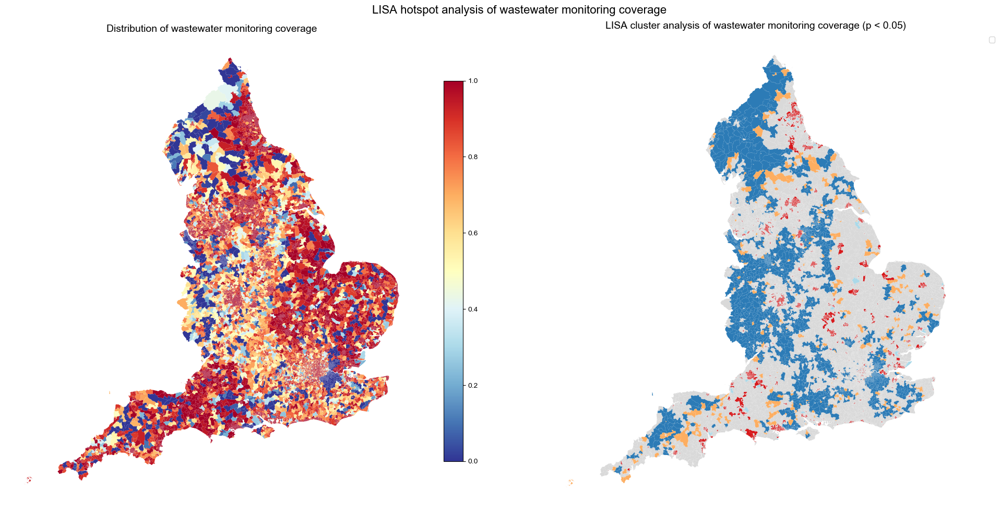


📊 LISA cluster statistics (p < 0.05):
   HH (high-high): 5578 areas
   LH (low-high): 74 areas
   LL (low-low): 3173 areas
   HL (high-low): 408 areas

✅ LISA hotspot analysis completed!
    total number of areas: 32844
    number of significant clusters: 9233 (28.1%)


In [54]:
from pysal import lib as pysal_lib
from pysal.explore import esda


# 1. create spatial matrix
print("🔗 create spatial matrix...")

# remove any invalid geometries
spatial_gdf_clean = spatial_gdf[spatial_gdf.geometry.is_valid].copy()
spatial_gdf_clean = spatial_gdf_clean.dropna(subset=['geometry'])

print(f"number of LSOA: {len(spatial_gdf_clean)}")

# create Queen adjacency weight matrix
w_queen = pysal_lib.weights.Queen.from_dataframe(spatial_gdf_clean)
w_queen.transform = 'r'

print(f"✅ weight matrix created")
print(f"   - number of area: {w_queen.n}")
print(f"   - mean neighbors: {w_queen.mean_neighbors:.2f}")

# 2.LISA analysis
print("📈 LISA analysis...")

# coverage LISA analysis
coverage_data = spatial_gdf_clean['Coverage_Rate'].fillna(0)
lisa_coverage = esda.moran.Moran_Local(coverage_data, w_queen, permutations=999)

# add the results to the dataframe
spatial_gdf_clean['lisa_coverage_I'] = lisa_coverage.Is
spatial_gdf_clean['lisa_coverage_p'] = lisa_coverage.p_sim
spatial_gdf_clean['lisa_coverage_cluster'] = lisa_coverage.q
spatial_gdf_clean['lisa_coverage_sig'] = (lisa_coverage.p_sim < 0.05) & (lisa_coverage.q != 0)

print(f"Lisa Coverage analysis completed")
print(f"   - number of significant local spatial clusters: {(lisa_coverage.p_sim < 0.05).sum()}")

# 3. create LISA hotspot map
print("🎨 create LISA hotspot map...")


plt.rcParams['font.sans-serif'] = ['SimHei', 'Arial Unicode MS', 'DejaVu Sans']
plt.rcParams['axes.unicode_minus'] = False

# create figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle('LISA hotspot analysis of wastewater monitoring coverage', fontsize=16, fontweight='bold')

# define LISA cluster colors and labels
lisa_colors = {
    0: '#d9d9d9',    # not significant - gray
    1: '#d7191c',    # HH (high-high) - red  
    2: '#abd9e9',    # LH (low-high) - light blue
    3: '#2c7bb6',    # LL (low-low) - deep blue
    4: '#fdae61'     # HL (high-low) - orange
}

lisa_labels = {
    0: 'not significant',
    1: 'HH (high-high)', 
    2: 'LH (low-high)',
    3: 'LL (low-low)',
    4: 'HL (high-low)'
}

# left figure: original coverage distribution
spatial_gdf_clean.plot(column='Coverage_Rate', ax=ax1, cmap='RdYlBu_r', 
                       legend=True, legend_kwds={'shrink': 0.8})
ax1.set_title('Distribution of wastewater monitoring coverage', fontsize=14, fontweight='bold')
ax1.axis('off')

# right figure: LISA cluster
# only show significant clusters
lisa_plot_data = spatial_gdf_clean.copy()
lisa_plot_data['lisa_plot'] = lisa_plot_data.apply(
    lambda row: row['lisa_coverage_cluster'] if row['lisa_coverage_sig'] else 0, axis=1
)

for cluster_type in lisa_plot_data['lisa_plot'].unique():
    if cluster_type in lisa_colors:
        subset = lisa_plot_data[lisa_plot_data['lisa_plot'] == cluster_type]
        subset.plot(ax=ax2, color=lisa_colors[cluster_type], 
                   label=lisa_labels[cluster_type])

ax2.set_title('LISA cluster analysis of wastewater monitoring coverage (p < 0.05)', fontsize=14, fontweight='bold')
ax2.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
ax2.axis('off')

plt.tight_layout()
plt.show()

# 4. print statistics
print(f"\n📊 LISA cluster statistics (p < 0.05):")
sig_clusters = spatial_gdf_clean[spatial_gdf_clean['lisa_coverage_sig']]
for i, label in lisa_labels.items():
    count = len(sig_clusters[sig_clusters['lisa_coverage_cluster'] == i])
    if count > 0:
        print(f"   {label}: {count} areas")

print(f"\n✅ LISA hotspot analysis completed!")
print(f"    total number of areas: {len(spatial_gdf_clean)}")
print(f"    number of significant clusters: {len(sig_clusters)} ({len(sig_clusters)/len(spatial_gdf_clean)*100:.1f}%)")

('WARNING: ', 18535, ' is an island (no neighbors)')


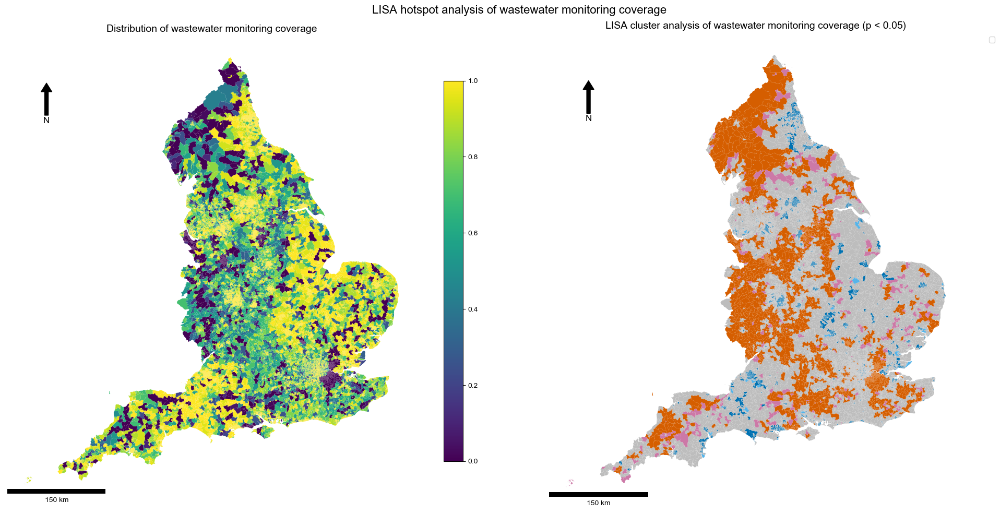

In [55]:
from pysal import lib as pysal_lib
from pysal.explore import esda
import matplotlib.patches as mpatches
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.transforms as mtransforms

# 1. create spatial matrix
spatial_gdf_clean = spatial_gdf[spatial_gdf.geometry.is_valid].copy()
spatial_gdf_clean = spatial_gdf_clean.dropna(subset=['geometry'])

w_queen = pysal_lib.weights.Queen.from_dataframe(spatial_gdf_clean)
w_queen.transform = 'r'

# 2. LISA analysis
coverage_data = spatial_gdf_clean['Coverage_Rate'].fillna(0)
lisa_coverage = esda.moran.Moran_Local(coverage_data, w_queen, permutations=999)

spatial_gdf_clean['lisa_coverage_I'] = lisa_coverage.Is
spatial_gdf_clean['lisa_coverage_p'] = lisa_coverage.p_sim
spatial_gdf_clean['lisa_coverage_cluster'] = lisa_coverage.q
spatial_gdf_clean['lisa_coverage_sig'] = (lisa_coverage.p_sim < 0.05) & (lisa_coverage.q != 0)

# 3. set colorblind-friendly colors 
lisa_colors = {
    0: '#bdbdbd',  # gray - not significant
    1: '#0072B2',  # blue
    2: '#56B4E9',  # light blue
    3: '#D55E00',  # orange
    4: '#CC79A7'   # purple
}

lisa_labels = {
    0: 'not significant',
    1: 'HH (high-high)', 
    2: 'LH (low-high)',
    3: 'LL (low-low)',
    4: 'HL (high-low)'
}

# 4. create figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
fig.suptitle('LISA hotspot analysis of wastewater monitoring coverage', fontsize=16, fontweight='bold')

# left figure: coverage distribution
spatial_gdf_clean.plot(column='Coverage_Rate', ax=ax1, cmap='viridis', 
                       legend=True, legend_kwds={'shrink': 0.8})
ax1.set_title('Distribution of wastewater monitoring coverage', fontsize=14, fontweight='bold')
ax1.axis('off')

# add scalebar
scalebar = ScaleBar(1, location='lower left', units="m", dimension='si-length', length_fraction=0.25)
ax1.add_artist(scalebar)

# add north arrow
def add_north_arrow(ax, x=0.1, y=0.9, size=0.08):
    ax.annotate('N', xy=(x, y), xytext=(x, y-size),
                arrowprops=dict(facecolor='black', width=5, headwidth=15),
                ha='center', va='center', fontsize=12, xycoords=ax.transAxes)

add_north_arrow(ax1)

# right figure: LISA cluster
lisa_plot_data = spatial_gdf_clean.copy()
lisa_plot_data['lisa_plot'] = lisa_plot_data.apply(
    lambda row: row['lisa_coverage_cluster'] if row['lisa_coverage_sig'] else 0, axis=1
)

for cluster_type in lisa_plot_data['lisa_plot'].unique():
    if cluster_type in lisa_colors:
        subset = lisa_plot_data[lisa_plot_data['lisa_plot'] == cluster_type]
        subset.plot(ax=ax2, color=lisa_colors[cluster_type], 
                   label=lisa_labels[cluster_type])

ax2.set_title('LISA cluster analysis of wastewater monitoring coverage (p < 0.05)', fontsize=14, fontweight='bold')
ax2.legend(loc='upper left', bbox_to_anchor=(1.05, 1))
ax2.axis('off')

# add scalebar & north arrow
scalebar2 = ScaleBar(1, location='lower left', units="m", dimension='si-length', length_fraction=0.25)
ax2.add_artist(scalebar2)
add_north_arrow(ax2)

plt.tight_layout()
plt.show()


🔍 analyze IMD composition of low coverage clusters...
✅ find 3258 low coverage clusters

📊 IMD decile distribution of low coverage clusters:
   IMD decile  1 (most poor):  197 areas (  6.0%)
   IMD decile  2 (poorness 9/10):  267 areas (  8.2%)
   IMD decile  3 (poorness 8/10):  255 areas (  7.8%)
   IMD decile  4 (poorness 7/10):  311 areas (  9.5%)
   IMD decile  5 (poorness 6/10):  369 areas ( 11.3%)
   IMD decile  6 (poorness 5/10):  406 areas ( 12.5%)
   IMD decile  7 (poorness 4/10):  437 areas ( 13.4%)
   IMD decile  8 (poorness 3/10):  402 areas ( 12.3%)
   IMD decile  9 (poorness 2/10):  360 areas ( 11.0%)
   IMD decile 10 (most rich):  254 areas (  7.8%)

🎯 key statistics:
   number of poor areas (IMD 1-3) in low coverage clusters: 719 (22.1%)
   number of rich areas (IMD 8-10) in low coverage clusters: 1016 (31.2%)

📈 comparison with overall data:
   percentage of poor areas (IMD 1-3) in overall data: 30.0%
   percentage of poor areas (IMD 1-3) in low coverage clusters: 22.1

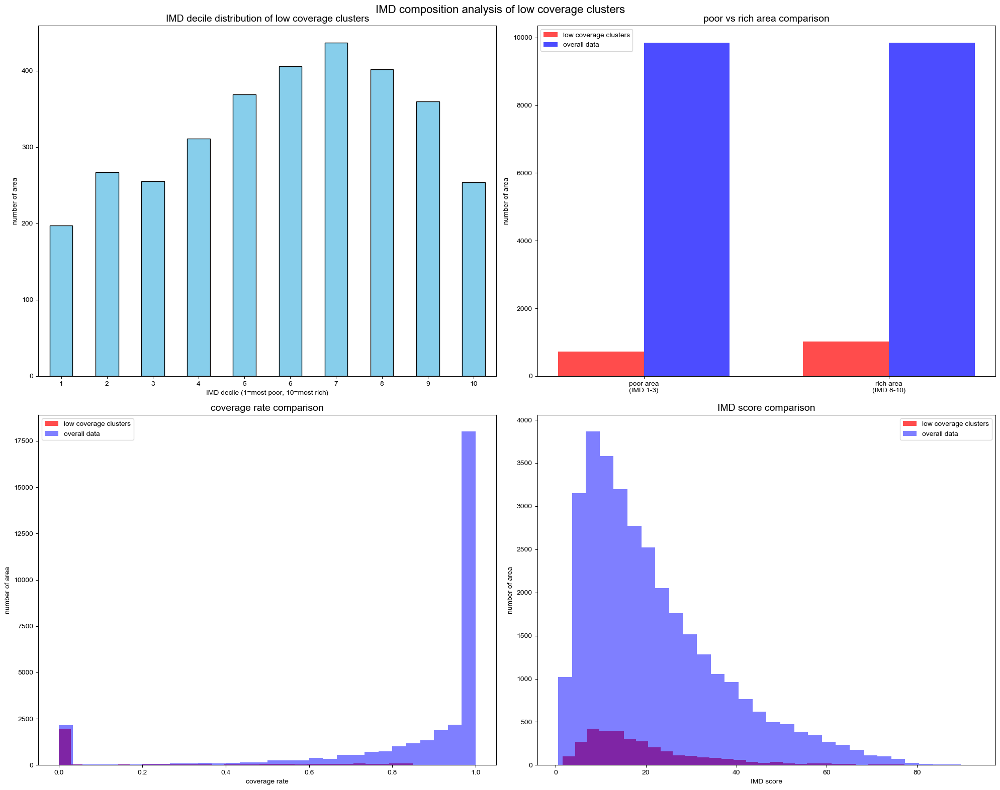


🎯 fairness assessment:
   📊 percentage of poor areas (IMD 1-3) in low coverage clusters is significantly lower than in overall data
   → poor areas have better monitoring coverage
   ✅ percentage of rich areas (IMD 8-10) in low coverage clusters is similar to in overall data
   → support fairness conclusion

📋 summary:
   poverty bias: -7.9 percentage points
   wealth bias: +1.2 percentage points
   ✅ conclusion: spatial distribution is fair

✅ analysis completed!


In [56]:


print("🔍 analyze IMD composition of low coverage clusters...")

# 1. extract low coverage clusters
low_coverage_clusters = spatial_gdf_clean[
    (spatial_gdf_clean['lisa_coverage_sig']) & 
    (spatial_gdf_clean['lisa_coverage_cluster'] == 3)  # LL (low-low)
]

print(f"✅ find {len(low_coverage_clusters)} low coverage clusters")

# 2. analyze IMD decile distribution
print(f"\n📊 IMD decile distribution of low coverage clusters:")
imd_decile_counts = low_coverage_clusters['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'].value_counts().sort_index()

for decile, count in imd_decile_counts.items():
    percentage = (count / len(low_coverage_clusters)) * 100
    if decile == 1:
        label = "most poor"
    elif decile == 10:
        label = "most rich"
    else:
        label = f"poorness {11-decile}/10"
    print(f"   IMD decile {decile:2d} ({label:8s}): {count:4d} areas ({percentage:5.1f}%)")

# 3. calculate the ratio of poor and rich areas
poverty_areas = low_coverage_clusters[low_coverage_clusters['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'] <= 3]
wealth_areas = low_coverage_clusters[low_coverage_clusters['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'] >= 8]

print(f"\n🎯 key statistics:")
print(f"   number of poor areas (IMD 1-3) in low coverage clusters: {len(poverty_areas)} ({len(poverty_areas)/len(low_coverage_clusters)*100:.1f}%)")
print(f"   number of rich areas (IMD 8-10) in low coverage clusters: {len(wealth_areas)} ({len(wealth_areas)/len(low_coverage_clusters)*100:.1f}%)")

# 4. compare with overall data
print(f"\n📈 comparison with overall data:")
overall_poverty = spatial_gdf_clean[spatial_gdf_clean['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'] <= 3]
overall_wealth = spatial_gdf_clean[spatial_gdf_clean['Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)'] >= 8]

overall_poverty_pct = len(overall_poverty) / len(spatial_gdf_clean) * 100
overall_wealth_pct = len(overall_wealth) / len(spatial_gdf_clean) * 100
low_cov_poverty_pct = len(poverty_areas) / len(low_coverage_clusters) * 100
low_cov_wealth_pct = len(wealth_areas) / len(low_coverage_clusters) * 100

print(f"   percentage of poor areas (IMD 1-3) in overall data: {overall_poverty_pct:.1f}%")
print(f"   percentage of poor areas (IMD 1-3) in low coverage clusters: {low_cov_poverty_pct:.1f}%")
print(f"   difference: {low_cov_poverty_pct - overall_poverty_pct:+.1f} percentage points")

print(f"   percentage of rich areas (IMD 8-10) in overall data: {overall_wealth_pct:.1f}%")
print(f"   percentage of rich areas (IMD 8-10) in low coverage clusters: {low_cov_wealth_pct:.1f}%")
print(f"   difference: {low_cov_wealth_pct - overall_wealth_pct:+.1f} percentage points")

# 5. create visualization
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))
fig.suptitle('IMD composition analysis of low coverage clusters', fontsize=16, fontweight='bold')

# figure 1: IMD decile distribution
imd_decile_counts.plot(kind='bar', ax=ax1, color='skyblue', edgecolor='black')
ax1.set_title('IMD decile distribution of low coverage clusters', fontsize=14, fontweight='bold')
ax1.set_xlabel('IMD decile (1=most poor, 10=most rich)')
ax1.set_ylabel('number of area')
ax1.tick_params(axis='x', rotation=0)

# figure 2: poor vs rich area comparison
categories = ['poor area\n(IMD 1-3)', 'rich area\n(IMD 8-10)']
low_cov_counts = [len(poverty_areas), len(wealth_areas)]
overall_counts = [len(overall_poverty), len(overall_wealth)]

x = np.arange(len(categories))
width = 0.35

ax2.bar(x - width/2, low_cov_counts, width, label='low coverage clusters', color='red', alpha=0.7)
ax2.bar(x + width/2, overall_counts, width, label='overall data', color='blue', alpha=0.7)

ax2.set_title('poor vs rich area comparison', fontsize=14, fontweight='bold')
ax2.set_ylabel('number of area')
ax2.set_xticks(x)
ax2.set_xticklabels(categories)
ax2.legend()

# figure 3: coverage rate comparison
ax3.hist(low_coverage_clusters['Coverage_Rate'], bins=30, alpha=0.7, color='red', label='low coverage clusters')
ax3.hist(spatial_gdf_clean['Coverage_Rate'], bins=30, alpha=0.5, color='blue', label='overall data')
ax3.set_title('coverage rate comparison', fontsize=14, fontweight='bold')
ax3.set_xlabel('coverage rate')
ax3.set_ylabel('number of area')
ax3.legend()

# figure 4: IMD score distribution comparison
ax4.hist(low_coverage_clusters['Index of Multiple Deprivation (IMD) Score'], bins=30, alpha=0.7, color='red', label='low coverage clusters')
ax4.hist(spatial_gdf_clean['Index of Multiple Deprivation (IMD) Score'], bins=30, alpha=0.5, color='blue', label='overall data')
ax4.set_title('IMD score comparison', fontsize=14, fontweight='bold')
ax4.set_xlabel('IMD score')
ax4.set_ylabel('number of area')
ax4.legend()

plt.tight_layout()
plt.show()

# 6. fairness assessment
print(f"\n🎯 fairness assessment:")

if low_cov_poverty_pct > overall_poverty_pct + 5:
    print("   ⚠️ percentage of poor areas (IMD 1-3) in low coverage clusters is significantly higher than in overall data")
    print("   → there may be unfair treatment of poor areas")
elif low_cov_poverty_pct < overall_poverty_pct - 5:
    print("   📊 percentage of poor areas (IMD 1-3) in low coverage clusters is significantly lower than in overall data")
    print("   → poor areas have better monitoring coverage")
else:
    print("   ✅ percentage of poor areas (IMD 1-3) in low coverage clusters is similar to in overall data")
    print("   → support fairness conclusion")

if low_cov_wealth_pct > overall_wealth_pct + 5:
    print("   📊 percentage of rich areas (IMD 8-10) in low coverage clusters is significantly higher than in overall data")
    print("   → rich areas have worse monitoring coverage")
elif low_cov_wealth_pct < overall_wealth_pct - 5:
    print("   ⚠️ percentage of rich areas (IMD 8-10) in low coverage clusters is significantly lower than in overall data")
    print("   → rich areas have better monitoring coverage")
else:
    print("   ✅ percentage of rich areas (IMD 8-10) in low coverage clusters is similar to in overall data")
    print("   → support fairness conclusion")

# 7. calculate key indicators
poverty_bias = low_cov_poverty_pct - overall_poverty_pct
wealth_bias = low_cov_wealth_pct - overall_wealth_pct

print(f"\n📋 summary:")
print(f"   poverty bias: {poverty_bias:+.1f} percentage points")
print(f"   wealth bias: {wealth_bias:+.1f} percentage points")

if abs(poverty_bias) < 5 and abs(wealth_bias) < 5:
    print("   ✅ conclusion: social economic composition of low coverage clusters is similar to in overall data")
    print("   → strongly support fairness conclusion")
elif poverty_bias > 5:
    print("   ⚠️ conclusion: low coverage clusters偏向贫困地区")
    print("   → there may be unfair treatment of poor areas")
elif wealth_bias > 5:
    print("   📊 conclusion: low coverage clusters偏向富裕地区")
    print("   → rich areas have worse monitoring coverage")
else:
    print("   ✅ conclusion: spatial distribution is fair")

print(f"\n✅ analysis completed!")